In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import uproot3 as uproot
import pandas as pd
import numpy as np
import math
from tqdm import tqdm

import xgboost as xgb

import kdar_functions as kdar
import general_functions as utils

from matplotlib.pyplot import cm

import importlib



In [2]:
single_run = True

In [3]:
importlib.reload(kdar)
importlib.reload(utils)

<module 'general_functions' from '/Users/bbogart/Documents/analysisCode/kdar_bdt/general_functions.py'>

In [4]:
model_hiE = xgb.Booster({'nthread': 4})  # init model
model_hiE.load_model('model_hiE_1.json')  # load data

model_lowE = xgb.Booster({'nthread': 4})  # init model
model_lowE.load_model('model_lowE_1.json')  # load data

model_hiE_genie_only = xgb.Booster({'nthread': 4})  # init model
model_hiE_genie_only.load_model('model_hiE_genie_only_1.json')  # load data

model_lowE_genie_only = xgb.Booster({'nthread': 4})  # init model
model_lowE_genie_only.load_model('model_lowE_genie_only_1.json')  # load data

lowE_cut = 0.8
hiE_cut = 0.9

bdt_query = f"kdar_score_hiE>{hiE_cut} and kdar_score_lowE>{lowE_cut}"

bdt_query_genie = bdt_query #+" and event%10>=4"
bdt_query_nuwro = bdt_query +" and event%10>=5"
bdt_query_gibuu = bdt_query +" and event%10>=5"
bdt_query_lowE = bdt_query +" and event%10>=7"
bdt_query_hiE = bdt_query +" and event%10>=7"

In [5]:
def check_var(var,xmin,xmax,nbins,check_bckg=False,
              check_n_genie_uni=10,plot_rpa=False,plot_XSecShape_CCMEC=False,plot_DecayAngMEC=False,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,
              check_bdtsel=False,check_presel=False,check_tagger=False,clipped=False,norm_sig=True,
              logy=False,xlabel_name="",multicolor=True,alpha=0.7):


        
    bins = np.linspace(xmin,xmax,nbins+1)
    err_truth = utils.get_x_err_Enu(utils.get_bin_centers(bins),bins)

    clipped_max =  99999999
    clipped_min = -99999999
    if clipped:
        clipped_max = xmax
        clipped_min = xmin       
    
    query = "is_KDAR==1"
    if check_bckg:
        norm_sig=False
        query = "is_KDAR==0"
        
    if check_bdtsel and check_bckg: query = query+" and " + bdt_query_hiE
    elif check_bdtsel: query = query+" and " + bdt_query_genie
    elif check_presel: query = query+" and " + kdar.presel_query
    elif check_tagger: query = query+" and ssm_kine_energy>0"
    
    if check_bckg:
        temp_df = overlay_df.query(query)
    else:
        temp_df = kdar_overlay_df.query(query)
    
    sig_test, _xx = np.histogram(np.clip(temp_df[var].to_numpy(),clipped_min,clipped_max),
                                    bins=bins,density=False,
                                    weights=temp_df['net_weight'].to_numpy())
    if norm_sig == True: 
        norm_sig_test = np.sum(sig_test)
        sig_test = sig_test/norm_sig_test
    max_y = np.max(sig_test)
    
    
    
    plt.figure()
    plt.errorbar(utils.get_bin_centers(bins),sig_test,label='GENIE CV', ms=5, fmt='o',lw=4,color='black')

    
    if check_n_genie_uni>599: check_n_genie_uni=599
    color = iter(cm.rainbow(np.linspace(0, 1, check_n_genie_uni)))
    if check_n_genie_uni>0:
        if multicolor: c = next(color)
        else: c = 'dodgerblue'
        var_name = f"All_UBGenie0"
        y,x=np.histogram(np.clip(temp_df[var].to_numpy(),clipped_min,clipped_max),
                 bins=nbins, range=(xmin,xmax),
                 weights=temp_df[var_name]*temp_df["weight_spline"].to_numpy(),         
        )   

        if norm_sig: 
            norm_y = np.sum(y)
            y = y/norm_y   
        max_y = np.max([max_y,np.max(y)])
        plt.stairs(y,edges=bins,alpha=alpha,color=c,label='GENIE Multisim')
    if check_n_genie_uni>1:  
        for uni in range(1,check_n_genie_uni):
            if multicolor: c = next(color)
            else: c = 'dodgerblue'
            var_name = f"All_UBGenie{uni}"
            y,x=np.histogram(np.clip(temp_df[var].to_numpy(),clipped_min,clipped_max),
                     bins=nbins, range=(xmin,xmax),
                     weights=temp_df[var_name]*temp_df["weight_spline"].to_numpy()
            )
            if norm_sig: 
                norm_y = np.sum(y)
                y = y/norm_y        
            max_y = np.max([max_y,np.max(y)])
            plt.stairs(y,edges=bins,alpha=alpha,color=c)



    if plot_rpa:
        var_name = f"RPA_CCQE_UBGenie_0"
        y,x=np.histogram(np.clip(temp_df[var].to_numpy(),clipped_min,clipped_max),
                 bins=nbins, range=(xmin,xmax),
                 weights=temp_df[var_name]*temp_df["weight_spline"].to_numpy(),         
        )      
        if norm_sig: 
            norm_y = np.sum(y)
            y = y/norm_y   
        max_y = np.max([max_y,np.max(y)])
        plt.stairs(y,edges=bins,alpha=0.8,color='red',label='-40% RPA')
        var_name = f"RPA_CCQE_UBGenie_1"
        y,x=np.histogram(np.clip(temp_df[var].to_numpy(),clipped_min,clipped_max),
                 bins=nbins, range=(xmin,xmax),
                 weights=temp_df[var_name]*temp_df["weight_spline"].to_numpy(),         
        )      
        if norm_sig: 
            norm_y = np.sum(y)
            y = y/norm_y   
        max_y = np.max([max_y,np.max(y)])
        plt.stairs(y,edges=bins,alpha=0.8,color='green',label='+40% RPA')

    if plot_XSecShape_CCMEC:
        var_name = f"XSecShape_CCMEC_UBGenie_1"
        y,x=np.histogram(np.clip(temp_df[var].to_numpy(),clipped_min,clipped_max),
                 bins=nbins, range=(xmin,xmax),
                 weights=temp_df[var_name]*temp_df["weight_spline"].to_numpy(),         
        )      
        if norm_sig: 
            norm_y = np.sum(y)
            y = y/norm_y   
        max_y = np.max([max_y,np.max(y)])
        plt.stairs(y,edges=bins,alpha=0.8,color='orangered',label='MEC Shape')

    if plot_DecayAngMEC:
        var_name = f"DecayAngMEC_UBGenie_0"
        y,x=np.histogram(np.clip(temp_df[var].to_numpy(),clipped_min,clipped_max),
                 bins=nbins, range=(xmin,xmax),
                 weights=temp_df[var_name]*temp_df["weight_spline"].to_numpy(),         
        )      
        if norm_sig: 
            norm_y = np.sum(y)
            y = y/norm_y   
        max_y = np.max([max_y,np.max(y)])
        plt.stairs(y,edges=bins,alpha=0.8,color='indigo',label='Decay Angle MEC')

    if plot_AxFFCCQEshape:
        var_name = f"AxFFCCQEshape_UBGenie_1"
        y,x=np.histogram(np.clip(temp_df[var].to_numpy(),clipped_min,clipped_max),
                 bins=nbins, range=(xmin,xmax),
                 weights=temp_df[var_name]*temp_df["weight_spline"].to_numpy(),         
        )      
        if norm_sig: 
            norm_y = np.sum(y)
            y = y/norm_y   
        max_y = np.max([max_y,np.max(y)])
        plt.stairs(y,edges=bins,alpha=0.8,color='lime',label='AxFFCCQEshape')
        
    if plot_VecFFCCQEshape:
        var_name = f"VecFFCCQEshape_UBGenie_1"
        y,x=np.histogram(np.clip(temp_df[var].to_numpy(),clipped_min,clipped_max),
                 bins=nbins, range=(xmin,xmax),
                 weights=temp_df[var_name]*temp_df["weight_spline"].to_numpy(),         
        )      
        if norm_sig: 
            norm_y = np.sum(y)
            y = y/norm_y   
        max_y = np.max([max_y,np.max(y)])
        plt.stairs(y,edges=bins,alpha=0.8,color='blue',label='VecFFCCQEshape')
        

    plt.xlabel(var)
    if xlabel_name!="": plt.xlabel(xlabel_name)
    if norm_sig: plt.ylabel("Normalized Counts")
    else: plt.ylabel("Events")
    title_suffix = 'Signal'
    if check_bckg: title_suffix = 'Bckground'
    plt.legend(title=title_suffix)
    if check_bdtsel: plt.legend(title='BDT Selected '+title_suffix)
    elif check_presel: plt.legend(title='Preselected '+title_suffix)
    elif check_tagger: plt.legend(title='Tagged '+title_suffix)
    plt.ylim(0,1.1*max_y)
    if logy: plt.yscale("log")
    plt.show()



In [6]:
weight_vars = ["All_UBGenie",'mcweight_filled','AxFFCCQEshape_UBGenie','DecayAngMEC_UBGenie','NormCCCOH_UBGenie','NormNCCOH_UBGenie','RPA_CCQE_UBGenie','ThetaDelta2NRad_UBGenie','Theta_Delta2Npi_UBGenie','VecFFCCQEshape_UBGenie','XSecShape_CCMEC_UBGenie','xsr_scc_Fa3_SCC','xsr_scc_Fv3_SCC','TunedCentralValue_UBGenie']


f_kdar_overlay = uproot.open("/Users/bbogart/Documents/data/KDAR_MCC9.10/sys/prodgenie_UseGroundStateRemnant_kdar_overlay_run4b_UBGenieFluxSmallUni.root")["wcpselection"]
f_kdar_overlay_bdt = f_kdar_overlay["T_BDTvars"].pandas.df(kdar.bdt_vars+kdar.ssm_bdt_vars, flatten=False)
f_kdar_overlay_eval = f_kdar_overlay["T_eval"].pandas.df(kdar.eval_vars+kdar.eval_mc_vars+["weight_spline","weight_cv"], flatten=False)
f_kdar_overlay_pfeval = f_kdar_overlay["T_PFeval"].pandas.df(kdar.pf_eval_vars+kdar.pf_eval_mc_vars, flatten=False)
f_kdar_overlay_kine = f_kdar_overlay["T_KINEvars"].pandas.df(kdar.kine_vars+kdar.kine_mc_vars, flatten=False)
f_kdar_overlay_weight = f_kdar_overlay["T_weight"].pandas.df(weight_vars, flatten=False)
f_kdar_overlay_pot = f_kdar_overlay["T_pot"].pandas.df("pot_tor875good", flatten=False)
kdar_overlay_POT = np.sum(f_kdar_overlay_pot["pot_tor875good"].to_numpy())
kdar_overlay_df = pd.concat([f_kdar_overlay_bdt, f_kdar_overlay_eval, f_kdar_overlay_pfeval, f_kdar_overlay_kine,f_kdar_overlay_weight], axis=1, sort=False)

kdar_overlay_df["horncur"] = ["RHC" for i in range(kdar_overlay_df.shape[0])]

del f_kdar_overlay
del f_kdar_overlay_bdt
del f_kdar_overlay_eval
del f_kdar_overlay_pfeval
del f_kdar_overlay_kine

if not single_run: 
    f_kdar_overlay = uproot.open("/Users/bbogart/Documents/data/KDAR_MCC9.10/prodgenie_UseGroundStateRemnant_kdar_overlay_run1_train.root")["wcpselection"]
    f_kdar_overlay_bdt = f_kdar_overlay["T_BDTvars"].pandas.df(kdar.bdt_vars+kdar.ssm_bdt_vars, flatten=False)
    f_kdar_overlay_eval = f_kdar_overlay["T_eval"].pandas.df(kdar.eval_vars+kdar.eval_mc_vars+["weight_spline","weight_cv"], flatten=False)
    f_kdar_overlay_pfeval = f_kdar_overlay["T_PFeval"].pandas.df(kdar.pf_eval_vars+kdar.pf_eval_mc_vars, flatten=False)
    f_kdar_overlay_kine = f_kdar_overlay["T_KINEvars"].pandas.df(kdar.kine_vars+kdar.kine_mc_vars, flatten=False)
    f_kdar_overlay_weight = f_kdar_overlay["T_weight"].pandas.df(weight_vars, flatten=False)
    f_kdar_overlay_pot = f_kdar_overlay["T_pot"].pandas.df("pot_tor875good", flatten=False)
    kdar_overlay_POT = np.sum(f_kdar_overlay_pot["pot_tor875good"].to_numpy())
    kdar_overlay_df_2 = pd.concat([f_kdar_overlay_bdt, f_kdar_overlay_eval, f_kdar_overlay_pfeval, f_kdar_overlay_kine,f_kdar_overlay_weight], axis=1, sort=False)

    kdar_overlay_df_2["horncur"] = ["FHC" for i in range(kdar_overlay_df_2.shape[0])]
    
    del f_kdar_overlay
    del f_kdar_overlay_bdt
    del f_kdar_overlay_eval
    del f_kdar_overlay_pfeval
    del f_kdar_overlay_kine

    kdar_overlay_df = pd.concat([kdar_overlay_df, kdar_overlay_df_2], sort=False)

kdar_overlay_df = kdar.apply_goodruns(kdar_overlay_df)

kdar_overlay_df["net_weight"] = kdar_overlay_df["weight_cv"].to_numpy()*kdar_overlay_df["weight_spline"].to_numpy()
print("All events",kdar_overlay_df.shape[0],np.sum(kdar_overlay_df["net_weight"].to_numpy()))

kdar_overlay_df["rse_num"] = (kdar_overlay_df["run"].to_numpy() * 100_000_000_000
                         + kdar_overlay_df["subrun"].to_numpy() * 1_000_000
                         + kdar_overlay_df["event"].to_numpy())
kdar_overlay_df = kdar_overlay_df.drop_duplicates(subset=['rse_num'])
print("Duplicates Dropped",kdar_overlay_df.shape[0],np.sum(kdar_overlay_df["net_weight"].to_numpy()))

kdar_overlay_df = kdar_overlay_df.query("truth_vtxInside==1")
print("In FV",kdar_overlay_df.shape[0],np.sum(kdar_overlay_df["net_weight"].to_numpy()))

kdar_overlay_df["isEXT"] = [0 for i in range(kdar_overlay_df.shape[0])]
kdar_overlay_df["isDirt"] = [0 for i in range(kdar_overlay_df.shape[0])]
kdar_overlay_df["WC_file"] = ["numi_kdar_overlay" for i in range(kdar_overlay_df.shape[0])]
kdar_overlay_df["POTscaled"] = [1 for i in range(kdar_overlay_df.shape[0])]
kdar_overlay_df["is_KDAR"] = [1 for i in range(kdar_overlay_df.shape[0])]

All events 50388 50781.67
Duplicates Dropped 50388 50781.67
In FV 50119 50528.223


In [7]:

print("All",kdar_overlay_df.shape[0])
kdar_overlay_df = kdar_overlay_df.query('mcweight_filled==1')
print("mcweight_filled==1",kdar_overlay_df.shape[0])

All_UBGenie = kdar_overlay_df["All_UBGenie"].to_numpy()
for uni in range(600):
    All_UBGenie_temp = []
    var_name = f"All_UBGenie{uni}"
    print(var_name)
    for i in range(len(All_UBGenie)):
        All_UBGenie_temp.append(np.clip(np.nan_to_num(All_UBGenie[i][uni],nan=0),0,30))
    kdar_overlay_df[var_name] = All_UBGenie_temp

xsr_scc_Fa3_SCC = kdar_overlay_df["xsr_scc_Fa3_SCC"].to_numpy()
for uni in range(10):
    xsr_scc_Fa3_SCC_temp = []
    var_name = f"xsr_scc_Fa3_SCC{uni}"
    print(var_name)
    for i in range(len(xsr_scc_Fa3_SCC)):
        xsr_scc_Fa3_SCC_temp.append(xsr_scc_Fa3_SCC[i][uni])
    kdar_overlay_df[var_name] = xsr_scc_Fa3_SCC_temp

xsr_scc_Fv3_SCC = kdar_overlay_df["xsr_scc_Fv3_SCC"].to_numpy()
for uni in range(10):
    xsr_scc_Fv3_SCC_temp = []
    var_name = f"xsr_scc_Fv3_SCC{uni}"
    print(var_name)
    for i in range(len(xsr_scc_Fv3_SCC)):
        xsr_scc_Fv3_SCC_temp.append(xsr_scc_Fv3_SCC[i][uni])
    kdar_overlay_df[var_name] = xsr_scc_Fv3_SCC_temp

AxFFCCQEshape_UBGenie = kdar_overlay_df["AxFFCCQEshape_UBGenie"].to_numpy()
AxFFCCQEshape_UBGenie_0 = []
AxFFCCQEshape_UBGenie_1 = []
for i in range(len(AxFFCCQEshape_UBGenie)):
    AxFFCCQEshape_UBGenie_0.append( np.clip(np.nan_to_num(AxFFCCQEshape_UBGenie[i][0],nan=0),0,30))
    AxFFCCQEshape_UBGenie_1.append( np.clip(np.nan_to_num(AxFFCCQEshape_UBGenie[i][1],nan=0),0,30))
kdar_overlay_df["AxFFCCQEshape_UBGenie_0"] = AxFFCCQEshape_UBGenie_0
kdar_overlay_df["AxFFCCQEshape_UBGenie_1"] = AxFFCCQEshape_UBGenie_1

DecayAngMEC_UBGenie = kdar_overlay_df["DecayAngMEC_UBGenie"].to_numpy()
DecayAngMEC_UBGenie_0 = []
DecayAngMEC_UBGenie_1 = []
for i in range(len(DecayAngMEC_UBGenie)):
    DecayAngMEC_UBGenie_0.append( np.clip(np.nan_to_num(DecayAngMEC_UBGenie[i][0],nan=0),0,30))
    DecayAngMEC_UBGenie_1.append( np.clip(np.nan_to_num(DecayAngMEC_UBGenie[i][1],nan=0),0,30))
kdar_overlay_df["DecayAngMEC_UBGenie_0"] = DecayAngMEC_UBGenie_0
kdar_overlay_df["DecayAngMEC_UBGenie_1"] = DecayAngMEC_UBGenie_1

NormCCCOH_UBGenie = kdar_overlay_df["NormCCCOH_UBGenie"].to_numpy()
NormCCCOH_UBGenie_0 = []
NormCCCOH_UBGenie_1 = []
for i in range(len(NormCCCOH_UBGenie)):
    NormCCCOH_UBGenie_0.append( np.clip(np.nan_to_num(NormCCCOH_UBGenie[i][0],nan=0),0,30))
    NormCCCOH_UBGenie_1.append( np.clip(np.nan_to_num(NormCCCOH_UBGenie[i][1],nan=0),0,30))
kdar_overlay_df["NormCCCOH_UBGenie_0"] = NormCCCOH_UBGenie_0
kdar_overlay_df["NormCCCOH_UBGenie_1"] = NormCCCOH_UBGenie_1

NormNCCOH_UBGenie = kdar_overlay_df["NormNCCOH_UBGenie"].to_numpy()
NormNCCOH_UBGenie_0 = []
NormNCCOH_UBGenie_1 = []
for i in range(len(NormNCCOH_UBGenie)):
    NormNCCOH_UBGenie_0.append( np.clip(np.nan_to_num(NormNCCOH_UBGenie[i][0],nan=0),0,30))
    NormNCCOH_UBGenie_1.append( np.clip(np.nan_to_num(NormNCCOH_UBGenie[i][1],nan=0),0,30))
kdar_overlay_df["NormNCCOH_UBGenie_0"] = NormNCCOH_UBGenie_0
kdar_overlay_df["NormNCCOH_UBGenie_1"] = NormNCCOH_UBGenie_1

RPA_CCQE_UBGenie = kdar_overlay_df["RPA_CCQE_UBGenie"].to_numpy()
RPA_CCQE_UBGenie_0 = []
RPA_CCQE_UBGenie_1 = []
for i in range(len(RPA_CCQE_UBGenie)):
    RPA_CCQE_UBGenie_0.append( np.clip(np.nan_to_num(RPA_CCQE_UBGenie[i][0],nan=0),0,30))
    RPA_CCQE_UBGenie_1.append( np.clip(np.nan_to_num(RPA_CCQE_UBGenie[i][1],nan=0),0,30))
kdar_overlay_df["RPA_CCQE_UBGenie_0"] = RPA_CCQE_UBGenie_0
kdar_overlay_df["RPA_CCQE_UBGenie_1"] = RPA_CCQE_UBGenie_1

ThetaDelta2NRad_UBGenie = kdar_overlay_df["ThetaDelta2NRad_UBGenie"].to_numpy()
ThetaDelta2NRad_UBGenie_0 = []
ThetaDelta2NRad_UBGenie_1 = []
for i in range(len(ThetaDelta2NRad_UBGenie)):
    ThetaDelta2NRad_UBGenie_0.append( np.clip(np.nan_to_num(ThetaDelta2NRad_UBGenie[i][0],nan=0),0,30))
    ThetaDelta2NRad_UBGenie_1.append( np.clip(np.nan_to_num(ThetaDelta2NRad_UBGenie[i][1],nan=0),0,30))
kdar_overlay_df["ThetaDelta2NRad_UBGenie_0"] = ThetaDelta2NRad_UBGenie_0
kdar_overlay_df["ThetaDelta2NRad_UBGenie_1"] = ThetaDelta2NRad_UBGenie_1

Theta_Delta2Npi_UBGenie = kdar_overlay_df["Theta_Delta2Npi_UBGenie"].to_numpy()
Theta_Delta2Npi_UBGenie_0 = []
Theta_Delta2Npi_UBGenie_1 = []
for i in range(len(Theta_Delta2Npi_UBGenie)):
    Theta_Delta2Npi_UBGenie_0.append( np.clip(np.nan_to_num(Theta_Delta2Npi_UBGenie[i][0],nan=0),0,30))
    Theta_Delta2Npi_UBGenie_1.append( np.clip(np.nan_to_num(Theta_Delta2Npi_UBGenie[i][1],nan=0),0,30))
kdar_overlay_df["Theta_Delta2Npi_UBGenie_0"] = Theta_Delta2Npi_UBGenie_0
kdar_overlay_df["Theta_Delta2Npi_UBGenie_1"] = Theta_Delta2Npi_UBGenie_1

VecFFCCQEshape_UBGenie = kdar_overlay_df["VecFFCCQEshape_UBGenie"].to_numpy()
VecFFCCQEshape_UBGenie_0 = []
VecFFCCQEshape_UBGenie_1 = []
for i in range(len(VecFFCCQEshape_UBGenie)):
    VecFFCCQEshape_UBGenie_0.append( np.clip(np.nan_to_num(VecFFCCQEshape_UBGenie[i][0],nan=0),0,30))
    VecFFCCQEshape_UBGenie_1.append( np.clip(np.nan_to_num(VecFFCCQEshape_UBGenie[i][1],nan=0),0,30))
kdar_overlay_df["VecFFCCQEshape_UBGenie_0"] = VecFFCCQEshape_UBGenie_0
kdar_overlay_df["VecFFCCQEshape_UBGenie_1"] = VecFFCCQEshape_UBGenie_1

XSecShape_CCMEC_UBGenie = kdar_overlay_df["XSecShape_CCMEC_UBGenie"].to_numpy()
XSecShape_CCMEC_UBGenie_0 = []
XSecShape_CCMEC_UBGenie_1 = []
for i in range(len(XSecShape_CCMEC_UBGenie)):
    XSecShape_CCMEC_UBGenie_0.append( np.clip(np.nan_to_num(XSecShape_CCMEC_UBGenie[i][0],nan=0),0,30))
    XSecShape_CCMEC_UBGenie_1.append( np.clip(np.nan_to_num(XSecShape_CCMEC_UBGenie[i][1],nan=0),0,30))
kdar_overlay_df["XSecShape_CCMEC_UBGenie_0"] = XSecShape_CCMEC_UBGenie_0
kdar_overlay_df["XSecShape_CCMEC_UBGenie_1"] = XSecShape_CCMEC_UBGenie_1

All 50119
mcweight_filled==1 50119
All_UBGenie0
All_UBGenie1
All_UBGenie2
All_UBGenie3
All_UBGenie4
All_UBGenie5
All_UBGenie6
All_UBGenie7
All_UBGenie8
All_UBGenie9
All_UBGenie10
All_UBGenie11
All_UBGenie12
All_UBGenie13
All_UBGenie14
All_UBGenie15
All_UBGenie16
All_UBGenie17
All_UBGenie18
All_UBGenie19
All_UBGenie20
All_UBGenie21
All_UBGenie22
All_UBGenie23
All_UBGenie24
All_UBGenie25
All_UBGenie26
All_UBGenie27
All_UBGenie28
All_UBGenie29
All_UBGenie30
All_UBGenie31
All_UBGenie32
All_UBGenie33
All_UBGenie34
All_UBGenie35
All_UBGenie36
All_UBGenie37
All_UBGenie38
All_UBGenie39
All_UBGenie40
All_UBGenie41
All_UBGenie42
All_UBGenie43
All_UBGenie44
All_UBGenie45
All_UBGenie46
All_UBGenie47
All_UBGenie48
All_UBGenie49
All_UBGenie50
All_UBGenie51
All_UBGenie52
All_UBGenie53
All_UBGenie54
All_UBGenie55
All_UBGenie56
All_UBGenie57
All_UBGenie58
All_UBGenie59
All_UBGenie60
All_UBGenie61
All_UBGenie62
All_UBGenie63
All_UBGenie64
All_UBGenie65
All_UBGenie66
All_UBGenie67
All_UBGenie68
All_UBGen

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie90


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie91


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie92


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie93


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie94


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie95


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie96


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie97


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie98


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie99


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie100


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie101


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie102


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie103


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie104


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie105


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie106


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie107


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie108


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie109


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie110


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie111


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie112


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie113


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie114


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie115


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie116


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie117


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie118


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie119


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie120


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie121


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie122


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie123


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie124


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie125


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie126


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie127


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie128


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie129


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie130


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie131


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie132


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie133


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie134


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie135


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie136


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie137


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie138


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie139


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie140


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie141


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie142


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie143


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie144


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie145


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie146


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie147


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie148


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie149


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie150


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie151


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie152


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie153


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie154


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie155


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie156


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie157


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie158


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie159


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie160


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie161


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie162


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie163


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie164


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie165


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie166


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie167


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie168


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie169


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie170


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie171


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie172


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie173


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie174


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie175


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie176


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie177


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie178


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie179


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie180


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie181


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie182


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie183


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie184


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie185


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie186


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie187


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie188


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie189


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie190


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie191


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie192


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie193


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie194


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie195


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie196


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie197


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie198


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie199


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie200


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie201


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie202


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie203


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie204


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie205


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie206


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie207


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie208


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie209


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie210


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie211


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie212


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie213


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie214


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie215


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie216


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie217


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie218


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie219


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie220


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie221


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie222


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie223


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie224


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie225


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie226


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie227


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie228


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie229


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie230


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie231


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie232


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie233


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie234


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie235


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie236


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie237


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie238


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie239


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie240


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie241


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie242


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie243


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie244


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie245


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie246


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie247


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie248


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie249


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie250


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie251


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie252


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie253


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie254


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie255


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie256


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie257


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie258


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie259


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie260


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie261


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie262


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie263


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie264


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie265


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie266


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie267


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie268


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie269


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie270


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie271


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie272


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie273


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie274


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie275


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie276


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie277


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie278


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie279


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie280


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie281


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie282


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie283


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie284


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie285


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie286


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie287


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie288


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie289


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie290


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie291


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie292


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie293


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie294


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie295


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie296


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie297


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie298


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie299


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie300


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie301


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie302


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie303


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie304


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie305


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie306


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie307


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie308


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie309


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie310


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie311


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie312


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie313


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie314


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie315


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie316


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie317


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie318


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie319


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie320


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie321


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie322


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie323


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie324


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie325


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie326


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie327


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie328


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie329


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie330


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie331


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie332


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie333


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie334


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie335


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie336


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie337


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie338


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie339


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie340


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie341


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie342


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie343


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie344


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie345


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie346


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie347


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie348


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie349


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie350


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie351


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie352


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie353


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie354


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie355


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie356


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie357


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie358


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie359


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie360


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie361


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie362


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie363


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie364


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie365


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie366


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie367


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie368


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie369


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie370


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie371


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie372


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie373


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie374


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie375


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie376


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie377


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie378


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie379


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie380


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie381


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie382


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie383


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie384


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie385


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie386


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie387


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie388


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie389


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie390


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie391


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie392


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie393


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie394


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie395


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie396


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie397


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie398


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie399


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie400


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie401


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie402


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie403


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie404


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie405


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie406


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie407


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie408


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie409


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie410


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie411


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie412


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie413


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie414


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie415


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie416


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie417


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie418


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie419


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie420


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie421


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie422


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie423


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie424


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie425


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie426


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie427


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie428


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie429


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie430


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie431


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie432


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie433


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie434


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie435


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie436


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie437


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie438


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie439


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie440


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie441


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie442


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie443


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie444


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie445


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie446


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie447


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie448


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie449


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie450


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie451


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie452


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie453


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie454


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie455


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie456


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie457


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie458


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie459


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie460


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie461


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie462


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie463


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie464


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie465


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie466


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie467


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie468


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie469


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie470


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie471


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie472


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie473


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie474


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie475


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie476


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie477


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie478


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie479


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie480


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie481


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie482


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie483


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie484


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie485


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie486


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie487


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie488


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie489


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie490


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie491


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie492


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie493


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie494


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie495


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie496


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie497


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie498


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie499


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie500


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie501


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie502


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie503


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie504


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie505


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie506


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie507


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie508


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie509


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie510


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie511


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie512


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie513


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie514


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie515


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie516


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie517


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie518


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie519


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie520


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie521


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie522


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie523


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie524


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie525


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie526


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie527


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie528


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie529


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie530


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie531


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie532


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie533


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie534


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie535


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie536


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie537


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie538


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie539


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie540


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie541


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie542


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie543


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie544


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie545


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie546


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie547


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie548


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie549


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie550


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie551


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie552


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie553


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie554


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie555


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie556


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie557


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie558


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie559


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie560


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie561


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie562


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie563


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie564


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie565


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie566


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie567


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie568


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie569


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie570


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie571


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie572


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie573


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie574


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie575


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie576


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie577


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie578


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie579


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie580


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie581


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie582


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie583


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie584


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie585


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie586


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie587


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie588


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie589


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie590


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie591


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie592


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie593


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie594


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie595


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie596


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie597


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie598


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp


All_UBGenie599


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = All_UBGenie_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = xsr_scc_Fa3_SCC_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert`

xsr_scc_Fa3_SCC0
xsr_scc_Fa3_SCC1
xsr_scc_Fa3_SCC2
xsr_scc_Fa3_SCC3
xsr_scc_Fa3_SCC4
xsr_scc_Fa3_SCC5
xsr_scc_Fa3_SCC6
xsr_scc_Fa3_SCC7
xsr_scc_Fa3_SCC8
xsr_scc_Fa3_SCC9
xsr_scc_Fv3_SCC0
xsr_scc_Fv3_SCC1
xsr_scc_Fv3_SCC2
xsr_scc_Fv3_SCC3
xsr_scc_Fv3_SCC4
xsr_scc_Fv3_SCC5
xsr_scc_Fv3_SCC6


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:30: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = xsr_scc_Fv3_SCC_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:30: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df[var_name] = xsr_scc_Fv3_SCC_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:30: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

xsr_scc_Fv3_SCC7
xsr_scc_Fv3_SCC8
xsr_scc_Fv3_SCC9


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df["AxFFCCQEshape_UBGenie_0"] = AxFFCCQEshape_UBGenie_0
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:39: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kdar_overlay_df["AxFFCCQEshape_UBGenie_1"] = AxFFCCQEshape_UBGenie_1
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/46965787.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is 

In [8]:
print(kdar_overlay_df.query("truth_nuScatType==10")["DecayAngMEC_UBGenie_0"].to_numpy())
print(kdar_overlay_df.query("truth_nuScatType==10")["DecayAngMEC_UBGenie_1"].to_numpy())
print(kdar_overlay_df.query("truth_nuScatType==10")["weight_cv"].to_numpy())

[0.40575814 2.62183547 0.0138114  ... 3.59708905 3.43829346 0.44050336]
[0.1540648  2.09131074 0.17868081 ... 7.50538778 4.28447962 0.16206135]
[0.1540648  2.0913107  0.1786808  ... 7.505388   4.2844796  0.16206135]


In [9]:
print(kdar_overlay_df.query("truth_nuScatType==10")["XSecShape_CCMEC_UBGenie_0"].to_numpy())
print(kdar_overlay_df.query("truth_nuScatType==10")["XSecShape_CCMEC_UBGenie_1"].to_numpy())
print(kdar_overlay_df.query("truth_nuScatType==10")["weight_cv"].to_numpy())

[0.1540648  2.09131074 0.17868081 ... 7.50538778 4.28447962 0.16206135]
[1.65594494 1.65594494 1.65594494 ... 1.65594494 1.65594494 1.65594494]
[0.1540648  2.0913107  0.1786808  ... 7.505388   4.2844796  0.16206135]


In [10]:
print(kdar_overlay_df["VecFFCCQEshape_UBGenie_0"].to_numpy())
print(kdar_overlay_df["VecFFCCQEshape_UBGenie_1"].to_numpy())
print(kdar_overlay_df["weight_cv"].to_numpy())

[1.22265983 1.44147205 0.98496169 ... 1.1492281  1.08691132 1.06457078]
[1.22556961 1.44107819 0.99284077 ... 1.14740634 1.08278215 1.07223916]
[1.2255696  1.4410782  0.99284077 ... 1.1474063  1.0827821  1.0722392 ]


In [11]:
print(kdar_overlay_df.query("truth_nuScatType==10")["AxFFCCQEshape_UBGenie_0"].to_numpy())
print(kdar_overlay_df.query("truth_nuScatType==10")["AxFFCCQEshape_UBGenie_1"].to_numpy())
print(kdar_overlay_df.query("truth_nuScatType==10")["weight_cv"].to_numpy())

[0.1540648  2.09131074 0.17868081 ... 7.50538778 4.28447962 0.16206135]
[0.1540648  2.09131074 0.17868081 ... 7.50538778 4.28447962 0.16206135]
[0.1540648  2.0913107  0.1786808  ... 7.505388   4.2844796  0.16206135]


In [12]:
weight_vars = ["All_UBGenie",'mcweight_filled','AxFFCCQEshape_UBGenie','DecayAngMEC_UBGenie','NormCCCOH_UBGenie','NormNCCOH_UBGenie','RPA_CCQE_UBGenie','ThetaDelta2NRad_UBGenie','Theta_Delta2Npi_UBGenie','VecFFCCQEshape_UBGenie','XSecShape_CCMEC_UBGenie','xsr_scc_Fa3_SCC','xsr_scc_Fv3_SCC','TunedCentralValue_UBGenie']


f_overlay = uproot.open("/Users/bbogart/Documents/data/KDAR_MCC9.10/sys/prodgenie_oldflux_overlay_run4b_rhc_train_UBGenieFluxSmallUni.root")["wcpselection"]
f_overlay_bdt = f_overlay["T_BDTvars"].pandas.df(kdar.bdt_vars+kdar.ssm_bdt_vars, flatten=False)
f_overlay_eval = f_overlay["T_eval"].pandas.df(kdar.eval_vars+kdar.eval_mc_vars+["weight_spline","weight_cv"], flatten=False)
f_overlay_pfeval = f_overlay["T_PFeval"].pandas.df(kdar.pf_eval_vars+kdar.pf_eval_mc_vars, flatten=False)
f_overlay_kine = f_overlay["T_KINEvars"].pandas.df(kdar.kine_vars+kdar.kine_mc_vars, flatten=False)
f_overlay_weight = f_overlay["T_weight"].pandas.df(weight_vars, flatten=False)
overlay_df = pd.concat([f_overlay_bdt, f_overlay_eval, f_overlay_pfeval, f_overlay_kine,f_overlay_weight], axis=1, sort=False)

overlay_df["horncur"] = ["RHC" for i in range(overlay_df.shape[0])]

del f_overlay
del f_overlay_bdt
del f_overlay_eval
del f_overlay_pfeval
del f_overlay_kine

if not single_run: 
    f_overlay = uproot.open("/Users/bbogart/Documents/data/KDAR_MCC9.10/prodgenie_oldflux_overlay_run1_fhc_train_UBGenieFluxSmallUni.root")["wcpselection"]
    f_overlay_bdt = f_overlay["T_BDTvars"].pandas.df(kdar.bdt_vars+kdar.ssm_bdt_vars, flatten=False)
    f_overlay_eval = f_overlay["T_eval"].pandas.df(kdar.eval_vars+kdar.eval_mc_vars+["weight_spline","weight_cv"], flatten=False)
    f_overlay_pfeval = f_overlay["T_PFeval"].pandas.df(kdar.pf_eval_vars+kdar.pf_eval_mc_vars, flatten=False)
    f_overlay_kine = f_overlay["T_KINEvars"].pandas.df(kdar.kine_vars+kdar.kine_mc_vars, flatten=False)
    f_overlay_weight = f_overlay["T_weight"].pandas.df(weight_vars, flatten=False)
    overlay_df_2 = pd.concat([f_overlay_bdt, f_overlay_eval, f_overlay_pfeval, f_overlay_kine,f_overlay_weight], axis=1, sort=False)

    overlay_df_2["horncur"] = ["FHC" for i in range(overlay_df_2.shape[0])]
    
    del f_overlay
    del f_overlay_bdt
    del f_overlay_eval
    del f_overlay_pfeval
    del f_overlay_kine

    overlay_df = pd.concat([overlay_df, overlay_df_2], sort=False)

overlay_df = kdar.apply_goodruns(overlay_df)

overlay_df["net_weight"] = overlay_df["weight_cv"].to_numpy()*overlay_df["weight_spline"].to_numpy()
print("All events",overlay_df.shape[0],np.sum(overlay_df["net_weight"].to_numpy()))

overlay_df["rse_num"] = (overlay_df["run"].to_numpy() * 100_000_000_000
                         + overlay_df["subrun"].to_numpy() * 1_000_000
                         + overlay_df["event"].to_numpy())
overlay_df = overlay_df.drop_duplicates(subset=['rse_num'])
print("Duplicates Dropped",overlay_df.shape[0],np.sum(overlay_df["net_weight"].to_numpy()))

#overlay_df = overlay_df.query("truth_vtxInside==1")
#print("In FV",overlay_df.shape[0],np.sum(overlay_df["net_weight"].to_numpy()))

overlay_df["isEXT"] = [0 for i in range(overlay_df.shape[0])]
overlay_df["isDirt"] = [0 for i in range(overlay_df.shape[0])]
overlay_df["WC_file"] = ["numi_overlay" for i in range(overlay_df.shape[0])]
overlay_df["POTscaled"] = [1 for i in range(overlay_df.shape[0])]




All events 268824 193205.5
Duplicates Dropped 268824 193205.5


In [13]:

print("All",overlay_df.shape[0])
overlay_df = overlay_df.query('mcweight_filled==1')
print("mcweight_filled==1",overlay_df.shape[0])

All_UBGenie = overlay_df["All_UBGenie"].to_numpy()
for uni in range(600):
    All_UBGenie_temp = []
    var_name = f"All_UBGenie{uni}"
    print(var_name)
    for i in range(len(All_UBGenie)):
        All_UBGenie_temp.append(np.clip(np.nan_to_num(All_UBGenie[i][uni],nan=0),0,30))
    overlay_df[var_name] = All_UBGenie_temp

xsr_scc_Fa3_SCC = overlay_df["xsr_scc_Fa3_SCC"].to_numpy()
for uni in range(10):
    xsr_scc_Fa3_SCC_temp = []
    var_name = f"xsr_scc_Fa3_SCC{uni}"
    print(var_name)
    for i in range(len(xsr_scc_Fa3_SCC)):
        xsr_scc_Fa3_SCC_temp.append(xsr_scc_Fa3_SCC[i][uni])
    overlay_df[var_name] = xsr_scc_Fa3_SCC_temp

xsr_scc_Fv3_SCC = overlay_df["xsr_scc_Fv3_SCC"].to_numpy()
for uni in range(10):
    xsr_scc_Fv3_SCC_temp = []
    var_name = f"xsr_scc_Fv3_SCC{uni}"
    print(var_name)
    for i in range(len(xsr_scc_Fv3_SCC)):
        xsr_scc_Fv3_SCC_temp.append(xsr_scc_Fv3_SCC[i][uni])
    overlay_df[var_name] = xsr_scc_Fv3_SCC_temp

AxFFCCQEshape_UBGenie = overlay_df["AxFFCCQEshape_UBGenie"].to_numpy()
AxFFCCQEshape_UBGenie_0 = []
AxFFCCQEshape_UBGenie_1 = []
for i in range(len(AxFFCCQEshape_UBGenie)):
    AxFFCCQEshape_UBGenie_0.append( np.clip(np.nan_to_num(AxFFCCQEshape_UBGenie[i][0],nan=0),0,30))
    AxFFCCQEshape_UBGenie_1.append( np.clip(np.nan_to_num(AxFFCCQEshape_UBGenie[i][1],nan=0),0,30))
overlay_df["AxFFCCQEshape_UBGenie_0"] = AxFFCCQEshape_UBGenie_0
overlay_df["AxFFCCQEshape_UBGenie_1"] = AxFFCCQEshape_UBGenie_1

DecayAngMEC_UBGenie = overlay_df["DecayAngMEC_UBGenie"].to_numpy()
DecayAngMEC_UBGenie_0 = []
DecayAngMEC_UBGenie_1 = []
for i in range(len(DecayAngMEC_UBGenie)):
    DecayAngMEC_UBGenie_0.append( np.clip(np.nan_to_num(DecayAngMEC_UBGenie[i][0],nan=0),0,30))
    DecayAngMEC_UBGenie_1.append( np.clip(np.nan_to_num(DecayAngMEC_UBGenie[i][1],nan=0),0,30))
overlay_df["DecayAngMEC_UBGenie_0"] = DecayAngMEC_UBGenie_0
overlay_df["DecayAngMEC_UBGenie_1"] = DecayAngMEC_UBGenie_1

NormCCCOH_UBGenie = overlay_df["NormCCCOH_UBGenie"].to_numpy()
NormCCCOH_UBGenie_0 = []
NormCCCOH_UBGenie_1 = []
for i in range(len(NormCCCOH_UBGenie)):
    NormCCCOH_UBGenie_0.append( np.clip(np.nan_to_num(NormCCCOH_UBGenie[i][0],nan=0),0,30))
    NormCCCOH_UBGenie_1.append( np.clip(np.nan_to_num(NormCCCOH_UBGenie[i][1],nan=0),0,30))
overlay_df["NormCCCOH_UBGenie_0"] = NormCCCOH_UBGenie_0
overlay_df["NormCCCOH_UBGenie_1"] = NormCCCOH_UBGenie_1

NormNCCOH_UBGenie = overlay_df["NormNCCOH_UBGenie"].to_numpy()
NormNCCOH_UBGenie_0 = []
NormNCCOH_UBGenie_1 = []
for i in range(len(NormNCCOH_UBGenie)):
    NormNCCOH_UBGenie_0.append( np.clip(np.nan_to_num(NormNCCOH_UBGenie[i][0],nan=0),0,30))
    NormNCCOH_UBGenie_1.append( np.clip(np.nan_to_num(NormNCCOH_UBGenie[i][1],nan=0),0,30))
overlay_df["NormNCCOH_UBGenie_0"] = NormNCCOH_UBGenie_0
overlay_df["NormNCCOH_UBGenie_1"] = NormNCCOH_UBGenie_1

RPA_CCQE_UBGenie = overlay_df["RPA_CCQE_UBGenie"].to_numpy()
RPA_CCQE_UBGenie_0 = []
RPA_CCQE_UBGenie_1 = []
for i in range(len(RPA_CCQE_UBGenie)):
    RPA_CCQE_UBGenie_0.append( np.clip(np.nan_to_num(RPA_CCQE_UBGenie[i][0],nan=0),0,30))
    RPA_CCQE_UBGenie_1.append( np.clip(np.nan_to_num(RPA_CCQE_UBGenie[i][1],nan=0),0,30))
overlay_df["RPA_CCQE_UBGenie_0"] = RPA_CCQE_UBGenie_0
overlay_df["RPA_CCQE_UBGenie_1"] = RPA_CCQE_UBGenie_1

ThetaDelta2NRad_UBGenie = overlay_df["ThetaDelta2NRad_UBGenie"].to_numpy()
ThetaDelta2NRad_UBGenie_0 = []
ThetaDelta2NRad_UBGenie_1 = []
for i in range(len(ThetaDelta2NRad_UBGenie)):
    ThetaDelta2NRad_UBGenie_0.append( np.clip(np.nan_to_num(ThetaDelta2NRad_UBGenie[i][0],nan=0),0,30))
    ThetaDelta2NRad_UBGenie_1.append( np.clip(np.nan_to_num(ThetaDelta2NRad_UBGenie[i][1],nan=0),0,30))
overlay_df["ThetaDelta2NRad_UBGenie_0"] = ThetaDelta2NRad_UBGenie_0
overlay_df["ThetaDelta2NRad_UBGenie_1"] = ThetaDelta2NRad_UBGenie_1

Theta_Delta2Npi_UBGenie = overlay_df["Theta_Delta2Npi_UBGenie"].to_numpy()
Theta_Delta2Npi_UBGenie_0 = []
Theta_Delta2Npi_UBGenie_1 = []
for i in range(len(Theta_Delta2Npi_UBGenie)):
    Theta_Delta2Npi_UBGenie_0.append( np.clip(np.nan_to_num(Theta_Delta2Npi_UBGenie[i][0],nan=0),0,30))
    Theta_Delta2Npi_UBGenie_1.append( np.clip(np.nan_to_num(Theta_Delta2Npi_UBGenie[i][1],nan=0),0,30))
overlay_df["Theta_Delta2Npi_UBGenie_0"] = Theta_Delta2Npi_UBGenie_0
overlay_df["Theta_Delta2Npi_UBGenie_1"] = Theta_Delta2Npi_UBGenie_1

VecFFCCQEshape_UBGenie = overlay_df["VecFFCCQEshape_UBGenie"].to_numpy()
VecFFCCQEshape_UBGenie_0 = []
VecFFCCQEshape_UBGenie_1 = []
for i in range(len(VecFFCCQEshape_UBGenie)):
    VecFFCCQEshape_UBGenie_0.append( np.clip(np.nan_to_num(VecFFCCQEshape_UBGenie[i][0],nan=0),0,30))
    VecFFCCQEshape_UBGenie_1.append( np.clip(np.nan_to_num(VecFFCCQEshape_UBGenie[i][1],nan=0),0,30))
overlay_df["VecFFCCQEshape_UBGenie_0"] = VecFFCCQEshape_UBGenie_0
overlay_df["VecFFCCQEshape_UBGenie_1"] = VecFFCCQEshape_UBGenie_1

XSecShape_CCMEC_UBGenie = overlay_df["XSecShape_CCMEC_UBGenie"].to_numpy()
XSecShape_CCMEC_UBGenie_0 = []
XSecShape_CCMEC_UBGenie_1 = []
for i in range(len(XSecShape_CCMEC_UBGenie)):
    XSecShape_CCMEC_UBGenie_0.append( np.clip(np.nan_to_num(XSecShape_CCMEC_UBGenie[i][0],nan=0),0,30))
    XSecShape_CCMEC_UBGenie_1.append( np.clip(np.nan_to_num(XSecShape_CCMEC_UBGenie[i][1],nan=0),0,30))
overlay_df["XSecShape_CCMEC_UBGenie_0"] = XSecShape_CCMEC_UBGenie_0
overlay_df["XSecShape_CCMEC_UBGenie_1"] = XSecShape_CCMEC_UBGenie_1

All 268824
mcweight_filled==1 268824
All_UBGenie0
All_UBGenie1
All_UBGenie2
All_UBGenie3
All_UBGenie4
All_UBGenie5
All_UBGenie6
All_UBGenie7
All_UBGenie8
All_UBGenie9
All_UBGenie10
All_UBGenie11
All_UBGenie12
All_UBGenie13
All_UBGenie14
All_UBGenie15
All_UBGenie16
All_UBGenie17
All_UBGenie18
All_UBGenie19
All_UBGenie20
All_UBGenie21
All_UBGenie22
All_UBGenie23
All_UBGenie24
All_UBGenie25
All_UBGenie26
All_UBGenie27
All_UBGenie28
All_UBGenie29
All_UBGenie30
All_UBGenie31
All_UBGenie32
All_UBGenie33
All_UBGenie34
All_UBGenie35
All_UBGenie36
All_UBGenie37
All_UBGenie38
All_UBGenie39
All_UBGenie40
All_UBGenie41
All_UBGenie42
All_UBGenie43
All_UBGenie44
All_UBGenie45
All_UBGenie46
All_UBGenie47
All_UBGenie48
All_UBGenie49
All_UBGenie50
All_UBGenie51
All_UBGenie52
All_UBGenie53
All_UBGenie54
All_UBGenie55
All_UBGenie56
All_UBGenie57
All_UBGenie58
All_UBGenie59
All_UBGenie60
All_UBGenie61
All_UBGenie62
All_UBGenie63
All_UBGenie64
All_UBGenie65
All_UBGenie66
All_UBGenie67
All_UBGenie68
All_UBG

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie91


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie92


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie93


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie94


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie95


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie96


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie97


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie98


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie99


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie100


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie101


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie102


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie103


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie104


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie105


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie106


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie107


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie108


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie109


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie110


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie111


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie112


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie113


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie114


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie115


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie116


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie117


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie118


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie119


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie120


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie121


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie122


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie123


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie124


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie125


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie126


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie127


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie128


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie129


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie130


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie131


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie132


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie133


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie134


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie135


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie136


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie137


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie138


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie139


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie140


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie141


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie142


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie143


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie144


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie145


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie146


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie147


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie148


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie149


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie150


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie151


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie152


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie153


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie154


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie155


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie156


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie157


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie158


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie159


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie160


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie161


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie162


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie163


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie164


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie165


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie166


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie167


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie168


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie169


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie170


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie171


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie172


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie173


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie174


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie175


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie176


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie177


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie178


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie179


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie180


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie181


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie182


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie183


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie184


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie185


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie186


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie187


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie188


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie189


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie190


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie191


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie192


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie193


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie194


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie195


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie196


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie197


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie198


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie199


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie200


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie201


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie202


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie203


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie204


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie205


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie206


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie207


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie208


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie209


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie210


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie211


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie212


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie213


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie214


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie215


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie216


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie217


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie218


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie219


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie220


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie221


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie222


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie223


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie224


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie225


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie226


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie227


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie228


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie229


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie230


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie231


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie232


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie233


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie234


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie235


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie236


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie237


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie238


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie239


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie240


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie241


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie242


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie243


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie244


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie245


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie246


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie247


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie248


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie249


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie250


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie251


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie252


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie253


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie254


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie255


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie256


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie257


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie258


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie259


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie260


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie261


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie262


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie263


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie264


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie265


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie266


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie267


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie268


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie269


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie270


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie271


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie272


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie273


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie274


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie275


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie276


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie277


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie278


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie279


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie280


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie281


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie282


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie283


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie284


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie285


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie286


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie287


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie288


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie289


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie290


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie291


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie292


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie293


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie294


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie295


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie296


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie297


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie298


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie299


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie300


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie301


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie302


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie303


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie304


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie305


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie306


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie307


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie308


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie309


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie310


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie311


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie312


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie313


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie314


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie315


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie316


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie317


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie318


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie319


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie320


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie321


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie322


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie323


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie324


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie325


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie326


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie327


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie328


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie329


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie330


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie331


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie332


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie333


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie334


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie335


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie336


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie337


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie338


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie339


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie340


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie341


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie342


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie343


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie344


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie345


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie346


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie347


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie348


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie349


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie350


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie351


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie352


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie353


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie354


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie355


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie356


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie357


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie358


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie359


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie360


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie361


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie362


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie363


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie364


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie365


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie366


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie367


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie368


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie369


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie370


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie371


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie372


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie373


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie374


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie375


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie376


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie377


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie378


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie379


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie380


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie381


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie382


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie383


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie384


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie385


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie386


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie387


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie388


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie389


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie390


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie391


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie392


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie393


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie394


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie395


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie396


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie397


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie398


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie399


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie400


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie401


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie402


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie403


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie404


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie405


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie406


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie407


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie408


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie409


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie410


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie411


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie412


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie413


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie414


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie415


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie416


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie417


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie418


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie419


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie420


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie421


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie422


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie423


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie424


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie425


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie426


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie427


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie428


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie429


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie430


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie431


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie432


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie433


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie434


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie435


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie436


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie437


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie438


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie439


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie440


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie441


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie442


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie443


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie444


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie445


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie446


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie447


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie448


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie449


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie450


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie451


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie452


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie453


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie454


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie455


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie456


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie457


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie458


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie459


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie460


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie461


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie462


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie463


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie464


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie465


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie466


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie467


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie468


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie469


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie470


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie471


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie472


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie473


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie474


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie475


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie476


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie477


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie478


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie479


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie480


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie481


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie482


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie483


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie484


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie485


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie486


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie487


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie488


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie489


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie490


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie491


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie492


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie493


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie494


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie495


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie496


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie497


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie498


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie499


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie500


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie501


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie502


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie503


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie504


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie505


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie506


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie507


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie508


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie509


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie510


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie511


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie512


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie513


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie514


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie515


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie516


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie517


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie518


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie519


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie520


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie521


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie522


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie523


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie524


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie525


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie526


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie527


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie528


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie529


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie530


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie531


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie532


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie533


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie534


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie535


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie536


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie537


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie538


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie539


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie540


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie541


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie542


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie543


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie544


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie545


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie546


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie547


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie548


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie549


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie550


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie551


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie552


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie553


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie554


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie555


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie556


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie557


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie558


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie559


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie560


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie561


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie562


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie563


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie564


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie565


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie566


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie567


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie568


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie569


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie570


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie571


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie572


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie573


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie574


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie575


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie576


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie577


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie578


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie579


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie580


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie581


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie582


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie583


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie584


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie585


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie586


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie587


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie588


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie589


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie590


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie591


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie592


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie593


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie594


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie595


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie596


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie597


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie598


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp


All_UBGenie599


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = All_UBGenie_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = xsr_scc_Fa3_SCC_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` man

xsr_scc_Fa3_SCC0
xsr_scc_Fa3_SCC1
xsr_scc_Fa3_SCC2


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = xsr_scc_Fa3_SCC_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = xsr_scc_Fa3_SCC_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert`

xsr_scc_Fa3_SCC3
xsr_scc_Fa3_SCC4
xsr_scc_Fa3_SCC5
xsr_scc_Fa3_SCC6
xsr_scc_Fa3_SCC7


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = xsr_scc_Fa3_SCC_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = xsr_scc_Fa3_SCC_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert`

xsr_scc_Fa3_SCC8
xsr_scc_Fa3_SCC9
xsr_scc_Fv3_SCC0


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:30: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = xsr_scc_Fv3_SCC_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:30: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = xsr_scc_Fv3_SCC_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:30: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert`

xsr_scc_Fv3_SCC1
xsr_scc_Fv3_SCC2
xsr_scc_Fv3_SCC3
xsr_scc_Fv3_SCC4
xsr_scc_Fv3_SCC5


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:30: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = xsr_scc_Fv3_SCC_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:30: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = xsr_scc_Fv3_SCC_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:30: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert`

xsr_scc_Fv3_SCC6
xsr_scc_Fv3_SCC7
xsr_scc_Fv3_SCC8
xsr_scc_Fv3_SCC9


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:30: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df[var_name] = xsr_scc_Fv3_SCC_temp
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  overlay_df["AxFFCCQEshape_UBGenie_0"] = AxFFCCQEshape_UBGenie_0
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_96527/4207717415.py:39: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of ca

In [14]:
print(overlay_df.query("truth_nuScatType==10")["DecayAngMEC_UBGenie_0"].to_numpy())
print(overlay_df.query("truth_nuScatType==10")["DecayAngMEC_UBGenie_1"].to_numpy())
print(overlay_df.query("truth_nuScatType==10")["weight_cv"].to_numpy())

[8.72874726e-03 1.92415541e-06 8.91777230e-09 ... 2.39495374e-02
 9.53351628e-05 2.45750833e+00]
[5.49408722e+00 3.62451799e-04 8.74417161e-09 ... 1.14382610e-01
 7.86358770e-03 1.00000000e+00]
[5.4940872e+00 3.6245180e-04 8.7441716e-09 ... 1.1438261e-01 7.8635877e-03
 1.0000000e+00]


In [15]:
print(overlay_df.query("truth_nuScatType==10")["XSecShape_CCMEC_UBGenie_0"].to_numpy())
print(overlay_df.query("truth_nuScatType==10")["XSecShape_CCMEC_UBGenie_1"].to_numpy())
print(overlay_df.query("truth_nuScatType==10")["weight_cv"].to_numpy())

[5.49408722e+00 3.62451799e-04 8.74417161e-09 ... 1.14382610e-01
 7.86358770e-03 1.00000000e+00]
[1.65594494 1.65594494 1.65594494 ... 1.65594494 1.65594494 1.        ]
[5.4940872e+00 3.6245180e-04 8.7441716e-09 ... 1.1438261e-01 7.8635877e-03
 1.0000000e+00]


In [16]:
print(overlay_df.query("truth_nuScatType==10")["VecFFCCQEshape_UBGenie_0"].to_numpy())
print(overlay_df.query("truth_nuScatType==10")["VecFFCCQEshape_UBGenie_1"].to_numpy())
print(overlay_df.query("truth_nuScatType==10")["weight_cv"].to_numpy())

[5.49408722e+00 3.62451799e-04 8.74417161e-09 ... 1.14382610e-01
 7.86358770e-03 1.00000000e+00]
[5.49408722e+00 3.62451799e-04 8.74417161e-09 ... 1.14382610e-01
 7.86358770e-03 1.00000000e+00]
[5.4940872e+00 3.6245180e-04 8.7441716e-09 ... 1.1438261e-01 7.8635877e-03
 1.0000000e+00]


In [17]:
print(overlay_df.query("truth_nuScatType==10")["AxFFCCQEshape_UBGenie_0"].to_numpy())
print(overlay_df.query("truth_nuScatType==10")["AxFFCCQEshape_UBGenie_1"].to_numpy())
print(overlay_df.query("truth_nuScatType==10")["weight_cv"].to_numpy())

[5.49408722e+00 3.62451799e-04 8.74417161e-09 ... 1.14382610e-01
 7.86358770e-03 1.00000000e+00]
[5.49408722e+00 3.62451799e-04 8.74417161e-09 ... 1.14382610e-01
 7.86358770e-03 1.00000000e+00]
[5.4940872e+00 3.6245180e-04 8.7441716e-09 ... 1.1438261e-01 7.8635877e-03
 1.0000000e+00]


In [18]:

kdar_overlay_df = kdar.add_ntrue_nu_angle(kdar_overlay_df)
kdar_overlay_df = kdar.add_truth_muon_info(kdar_overlay_df)
kdar_overlay_df = kdar.add_truth_proton_info(kdar_overlay_df)
kdar_overlay_df = kdar.add_truth_ssm_info(kdar_overlay_df)

overlay_df = kdar.add_ntrue_nu_angle(overlay_df)
overlay_df = kdar.add_truth_muon_info(overlay_df)
overlay_df = kdar.add_truth_proton_info(overlay_df)
overlay_df = kdar.add_truth_ssm_info(overlay_df)


100%|██████████████████████████████████| 50119/50119 [00:00<00:00, 61294.68it/s]
/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar_functions.py:1105: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["truth_nu_theta"] = nu_thetas
/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar_functions.py:1106: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["truth_nu_theta_deg"] = np.array(nu_thetas)*180/3.14
/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar_functions.py:1107: PerformanceWarning: DataFrame is highly fragmented.  This i

In [19]:
print("Total",overlay_df.shape[0],np.sum(overlay_df["net_weight"].to_numpy()))
overlay_df = kdar.set_is_kdar(overlay_df)
overlay_df = overlay_df.query("is_KDAR==0")
print("No KDARs",overlay_df.shape[0],np.sum(overlay_df["net_weight"].to_numpy()))

Total 268824 193205.5


/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar_functions.py:1523: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["is_KDAR"] = is_KDAR


No KDARs 268550 192650.81


In [20]:

kdar_overlay_df = kdar.add_ssm_kine_info(kdar_overlay_df)
kdar_overlay_df = kdar.add_ssm_reco_proton_info(kdar_overlay_df)
kdar_overlay_df = kdar.add_reco_proton_muon(kdar_overlay_df)
kdar_overlay_df = kdar.add_ssm_reco_dirt_vars(kdar_overlay_df)

overlay_df = kdar.add_ssm_kine_info(overlay_df)
overlay_df = kdar.add_ssm_reco_proton_info(overlay_df)
overlay_df = kdar.add_reco_proton_muon(overlay_df)
overlay_df = kdar.add_ssm_reco_dirt_vars(overlay_df)


100%|██████████████████████████████████| 50119/50119 [00:00<00:00, 96561.87it/s]
/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar_functions.py:1587: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["ssm_q"] = ssm_q
/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar_functions.py:1588: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["ssm_Q2"] = ssm_Q2
/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar_functions.py:1589: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` 

In [21]:

kdar_overlay_df = kdar.add_bdt_scores(kdar_overlay_df,model_lowE,kdar.train_vars_nokineprim,"kdar_score_lowE")
kdar_overlay_df = kdar.add_bdt_scores(kdar_overlay_df,model_hiE,kdar.train_vars_nokineprim,"kdar_score_hiE")

overlay_df = kdar.add_bdt_scores(overlay_df,model_lowE,kdar.train_vars_nokineprim,"kdar_score_lowE")
overlay_df = kdar.add_bdt_scores(overlay_df,model_hiE,kdar.train_vars_nokineprim,"kdar_score_hiE")



/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar_functions.py:1034: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[bdtvarname] = d_pred
100%|█████████████████████████████████| 50119/50119 [00:00<00:00, 884513.33it/s]
/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar_functions.py:1034: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[bdtvarname] = d_pred
100%|█████████████████████████████████| 50119/50119 [00:00<00:00, 907030.61it/s]
/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar_functions.py:1034: PerformanceWarning:

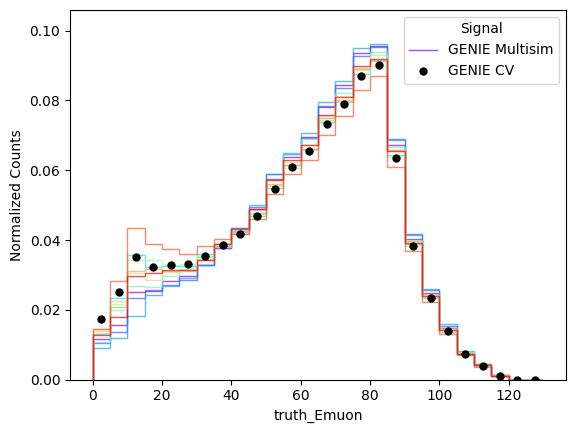

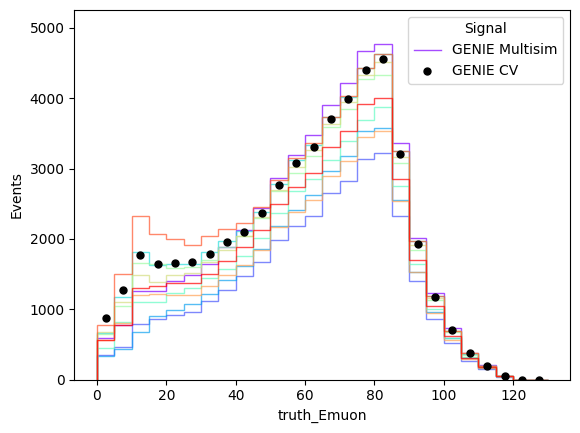

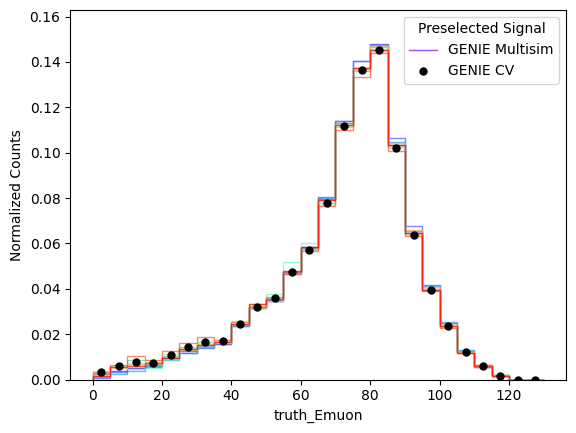

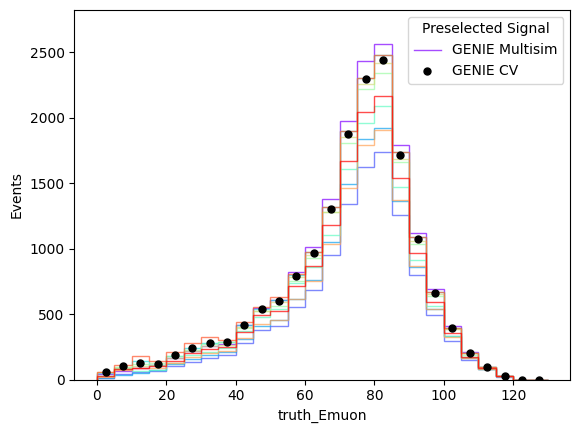

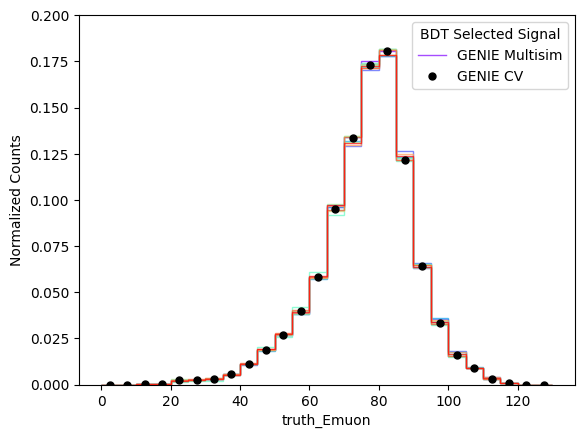

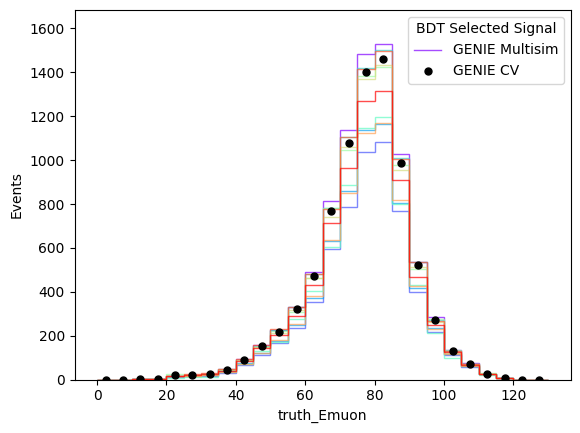

In [22]:
var = 'truth_Emuon'
xmin = 0
xmax = 130
nbins = 26
check_var(var,xmin,xmax,nbins,check_presel=False)
check_var(var,xmin,xmax,nbins,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_bdtsel=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False)


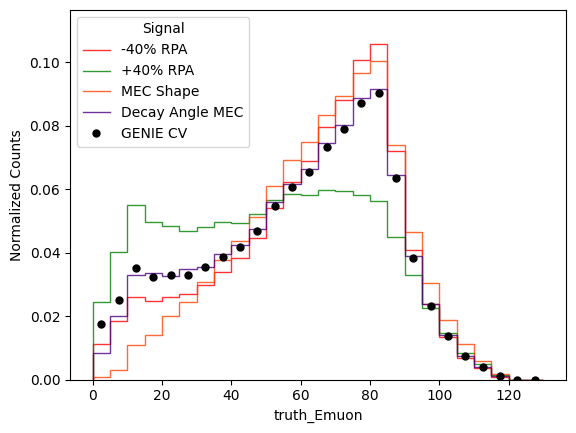

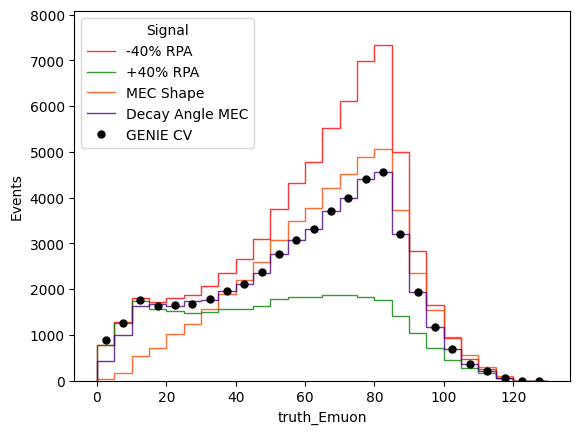

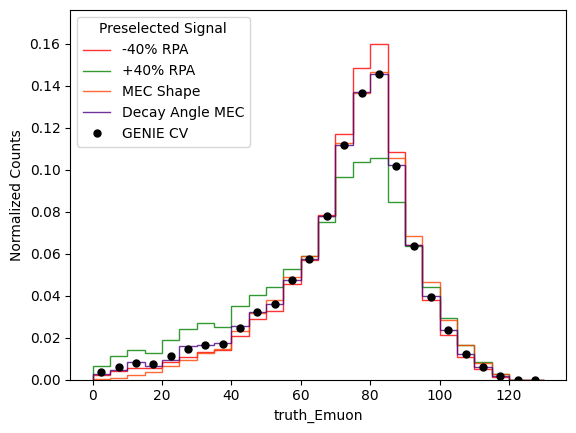

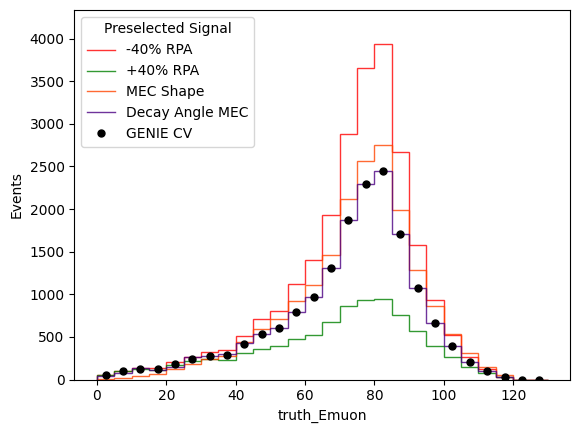

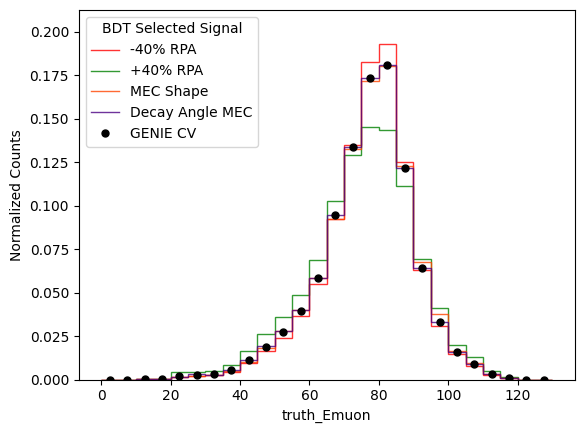

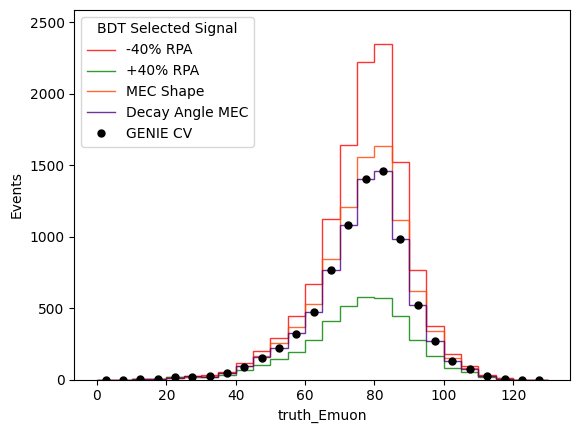

In [23]:
var = 'truth_Emuon'
xmin = 0
xmax = 130
nbins = 26
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False)





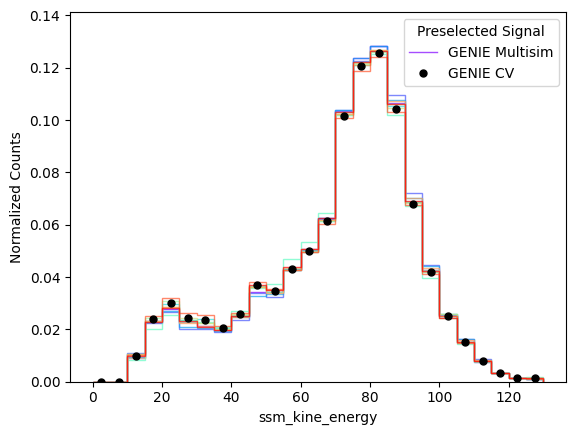

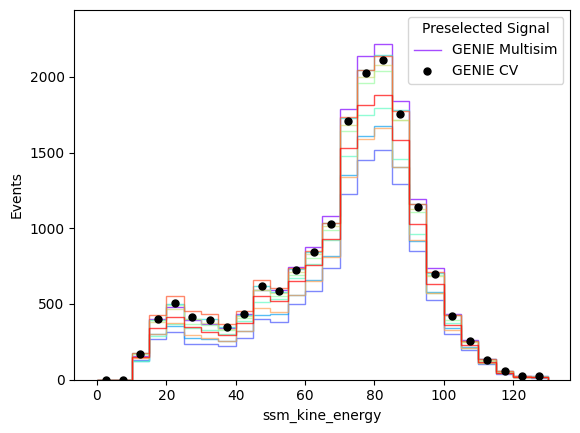

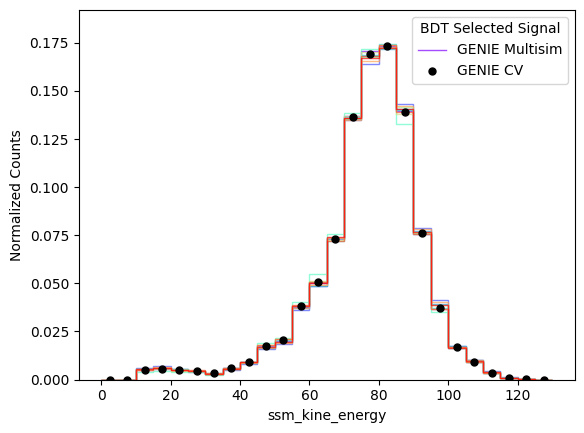

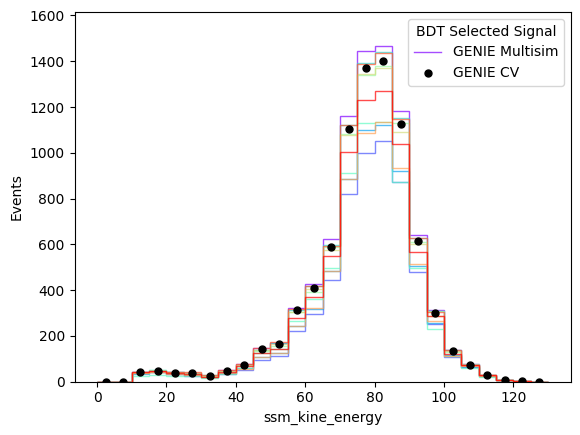

In [24]:
var = 'ssm_kine_energy'
xmin = 0
xmax = 130
nbins = 26
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_bdtsel=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False)


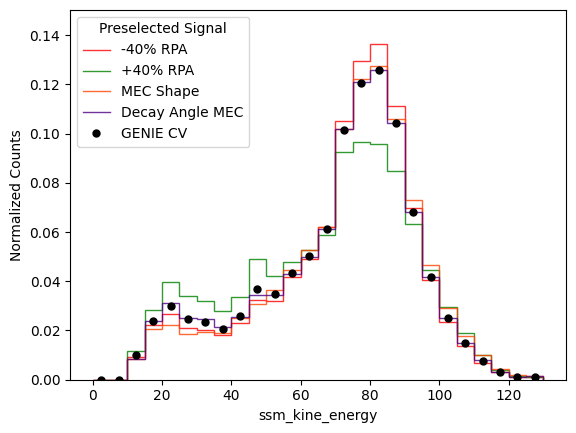

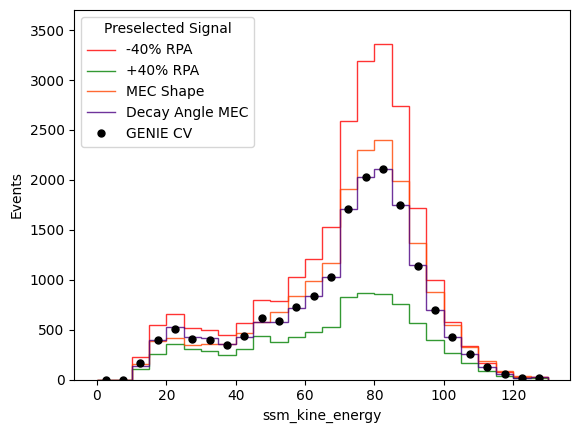

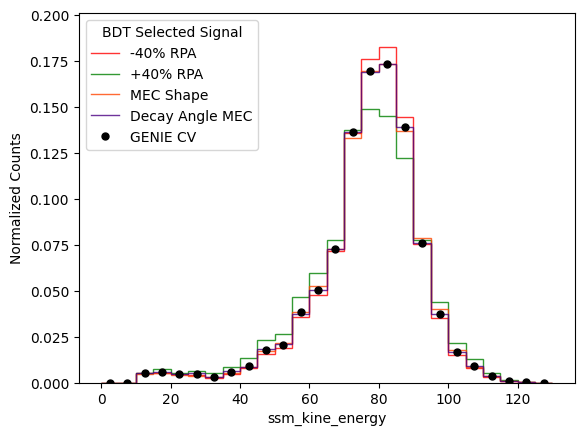

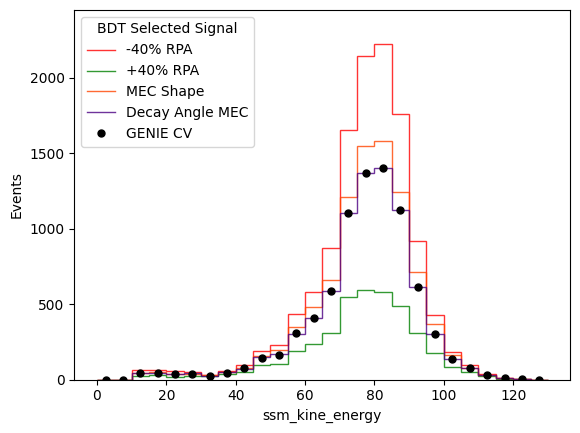

In [25]:
var = 'ssm_kine_energy'
xmin = 0
xmax = 130
nbins = 26
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False)





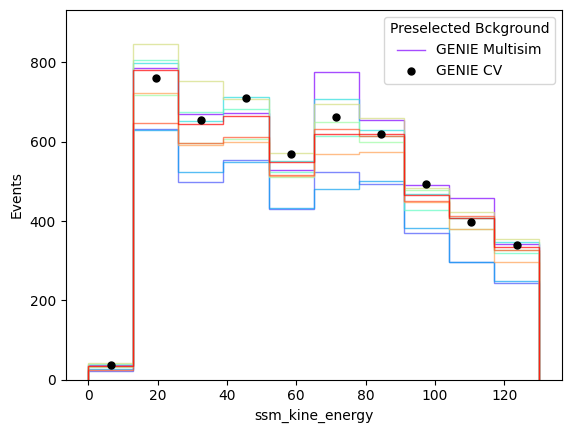

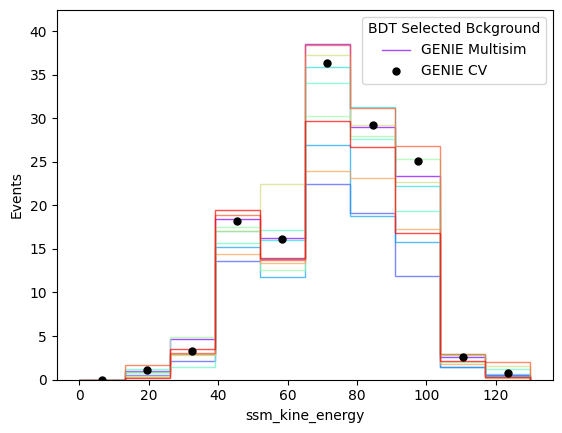

In [26]:
var = 'ssm_kine_energy'
xmin = 0
xmax = 130
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)

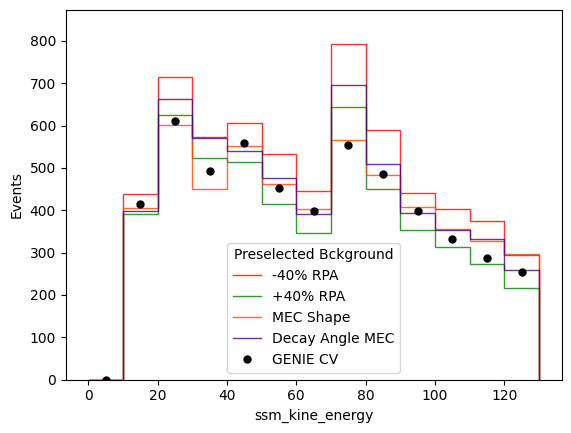

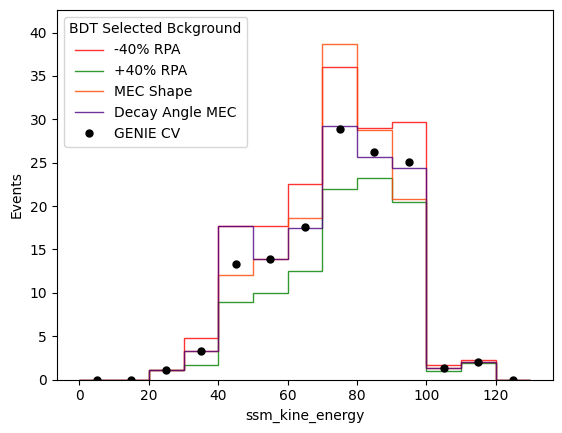

In [27]:
var = 'ssm_kine_energy'
xmin = 0
xmax = 130
nbins = 13
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)



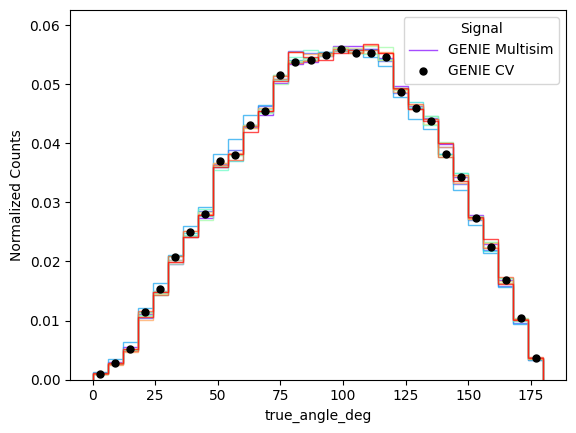

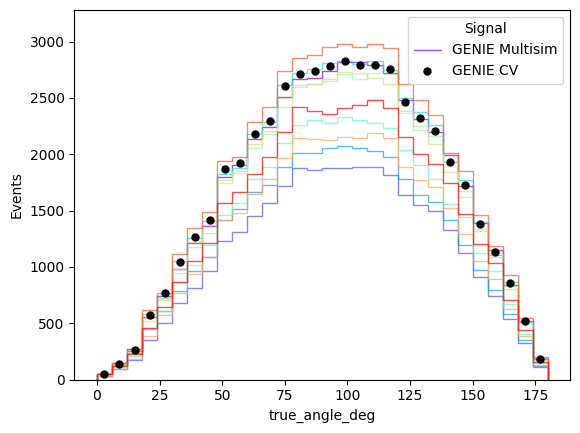

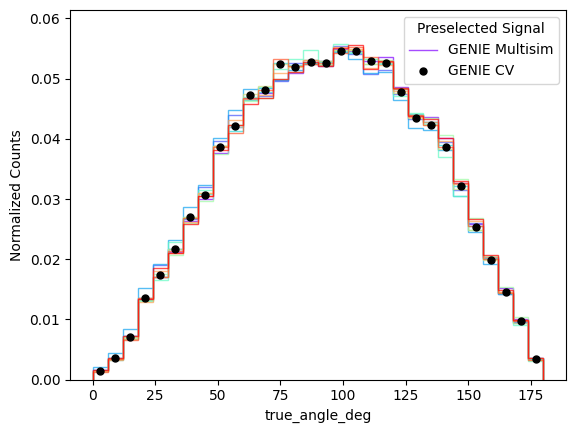

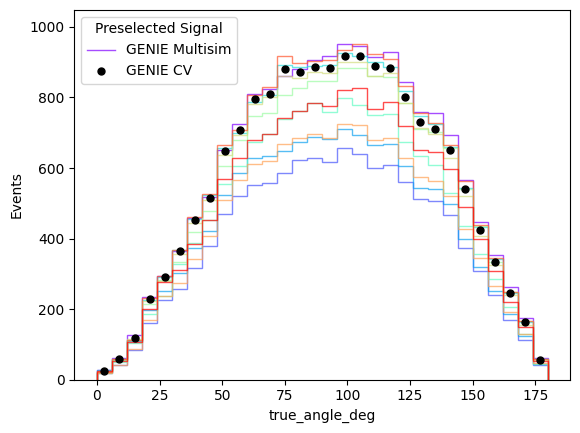

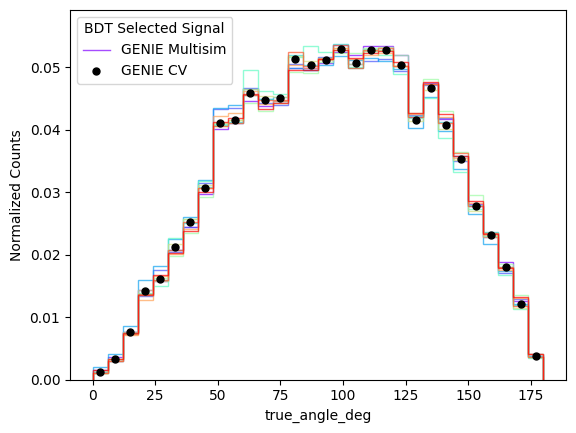

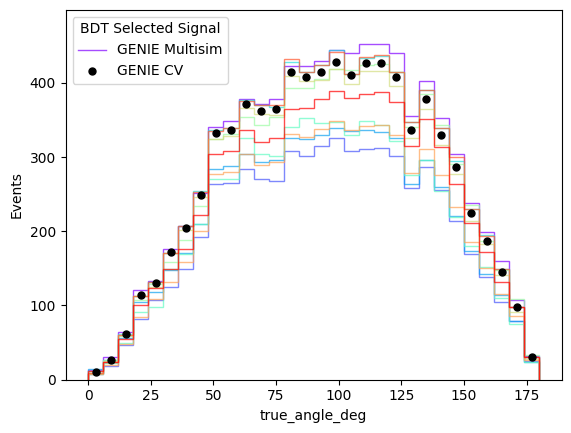

In [28]:
var = 'true_angle_deg'
xmin = 0
xmax = 180
nbins = 30
check_var(var,xmin,xmax,nbins,check_presel=False)
check_var(var,xmin,xmax,nbins,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_bdtsel=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False)

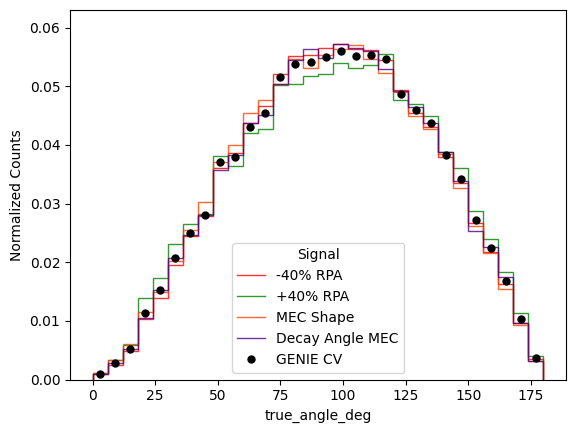

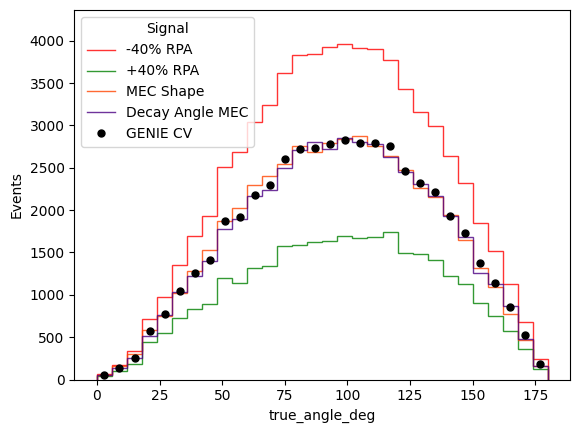

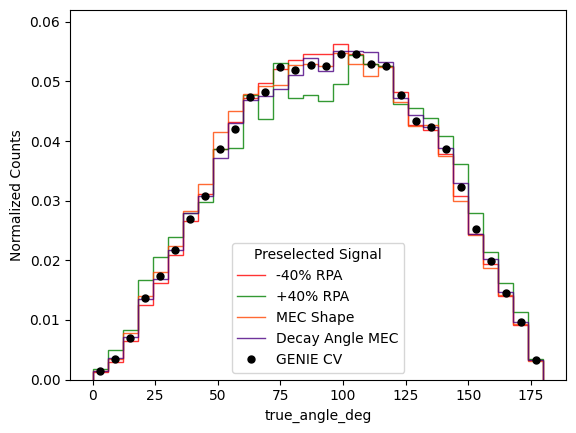

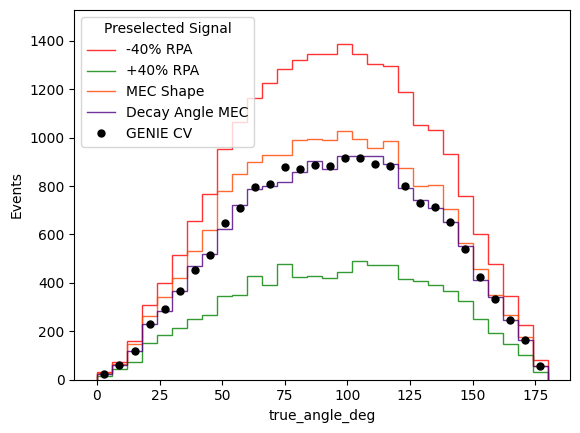

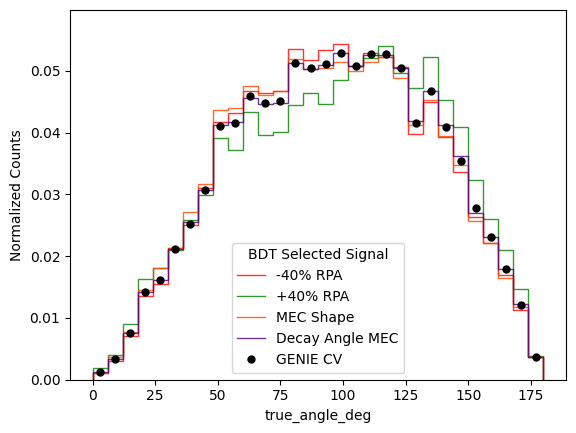

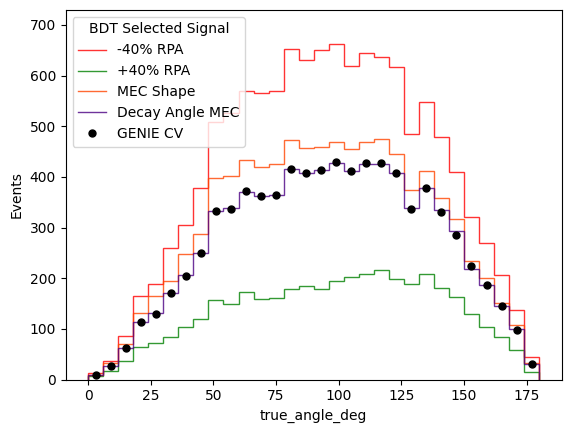

In [29]:
var = 'true_angle_deg'
xmin = 0
xmax = 180
nbins = 30
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False)



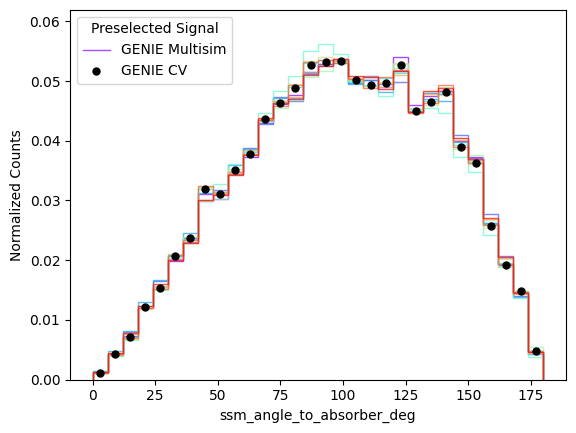

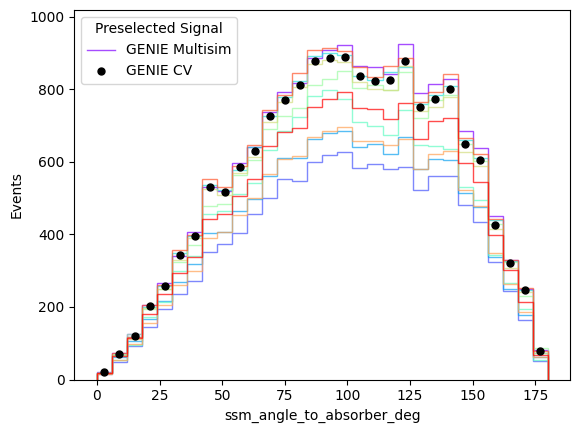

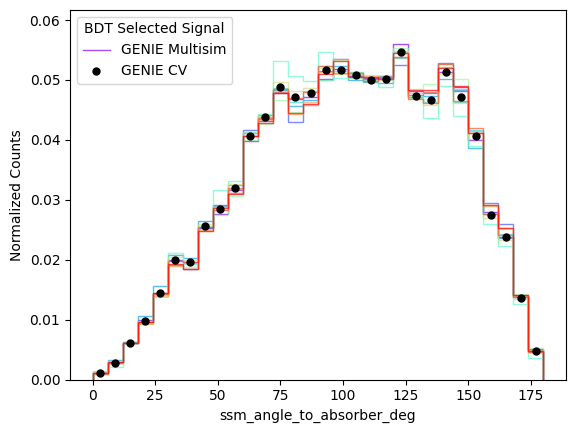

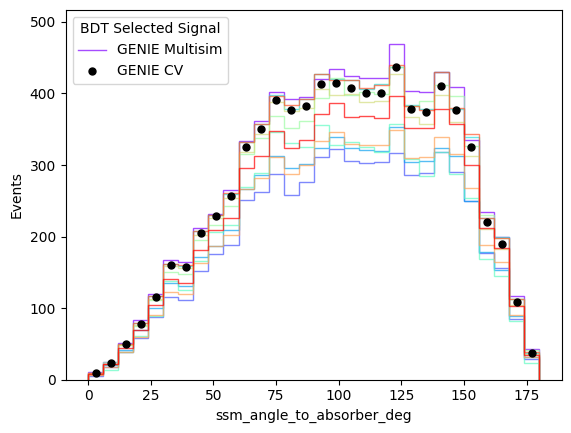

In [30]:
var = 'ssm_angle_to_absorber_deg'
xmin = 0
xmax = 180
nbins = 30
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_bdtsel=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False)

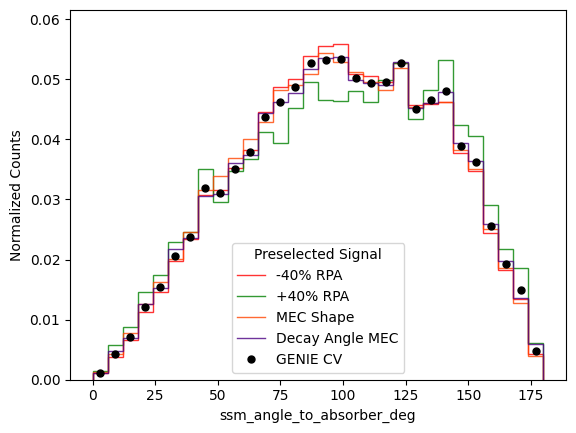

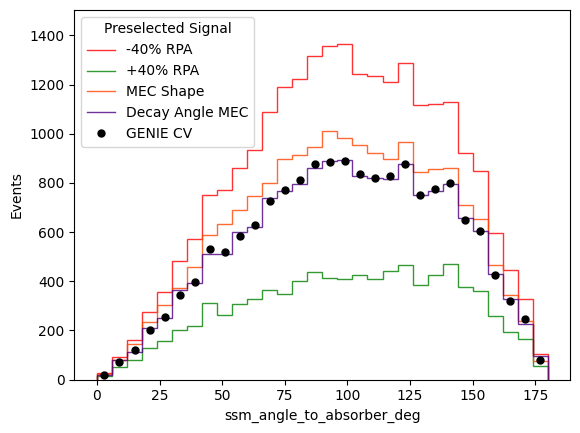

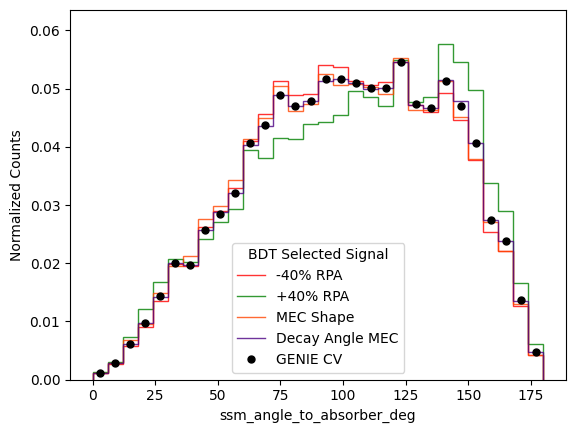

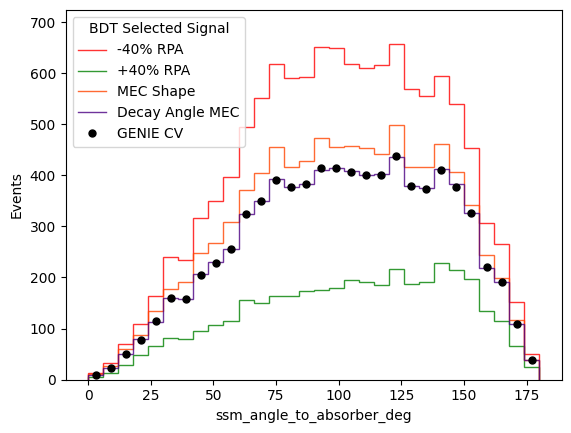

In [31]:
var = 'ssm_angle_to_absorber_deg'
xmin = 0
xmax = 180
nbins = 30
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False)


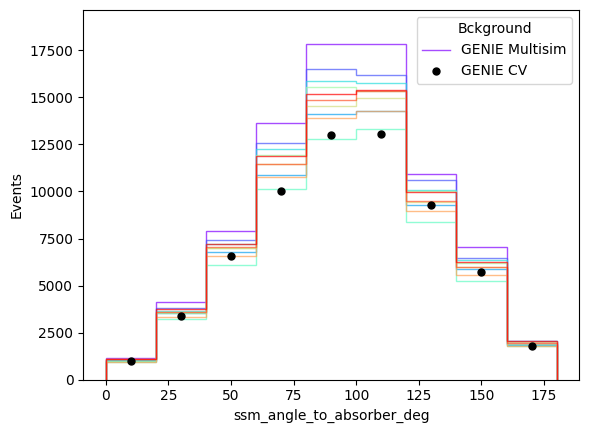

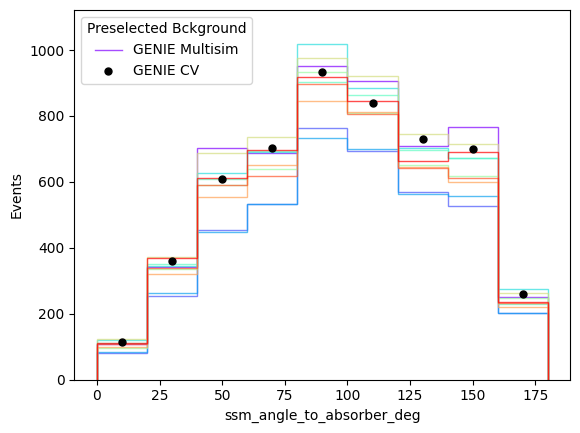

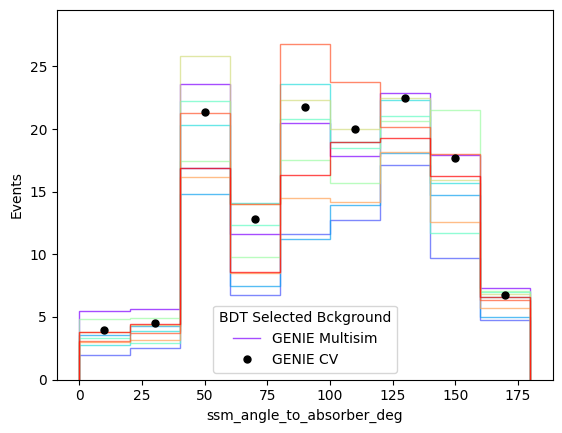

In [32]:
var = 'ssm_angle_to_absorber_deg'
xmin = 0
xmax = 180
nbins = 9
check_var(var,xmin,xmax,nbins,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)

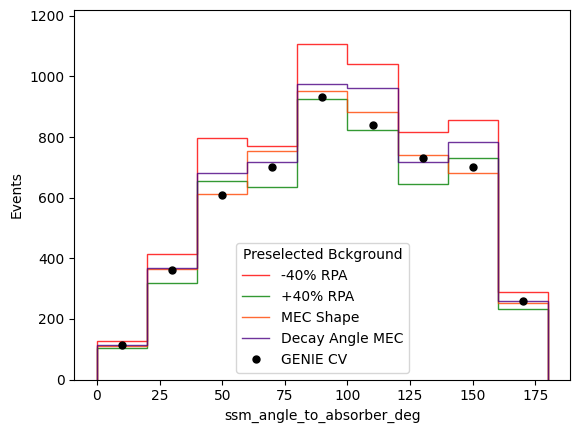

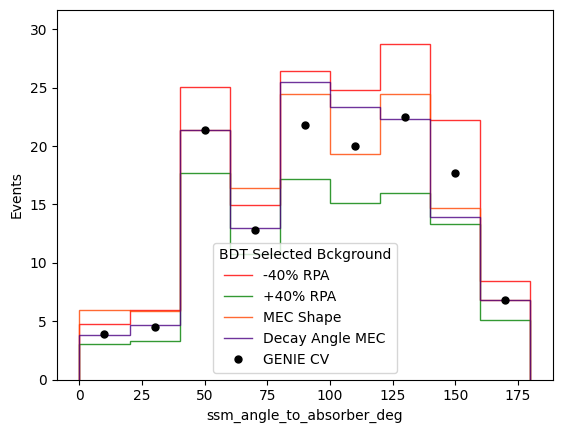

In [33]:
var = 'ssm_angle_to_absorber_deg'
xmin = 0
xmax = 180
nbins = 9
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)



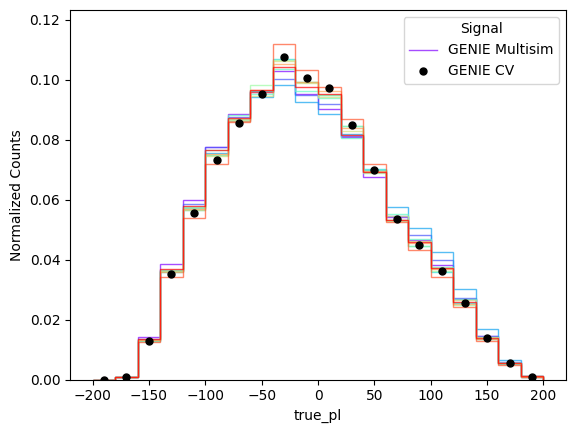

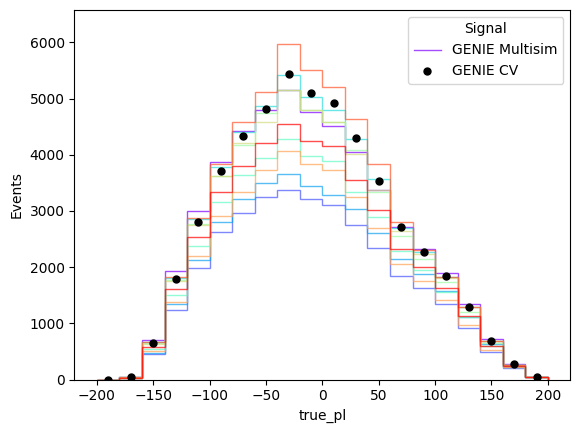

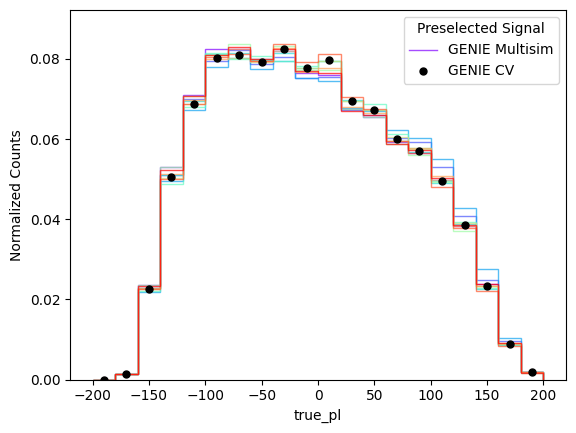

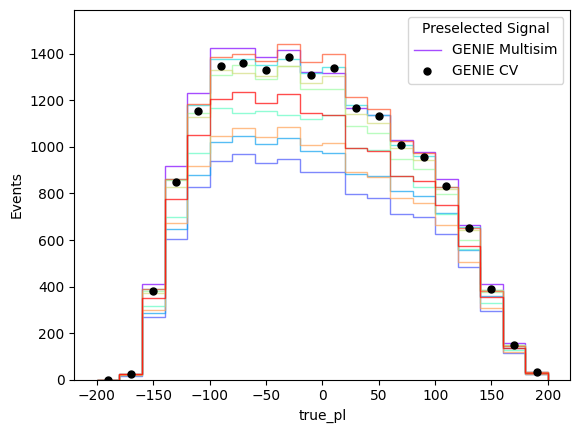

In [34]:
var = 'true_pl'
xmin = -200
xmax = 200
nbins = 20
check_var(var,xmin,xmax,nbins,check_presel=False)
check_var(var,xmin,xmax,nbins,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

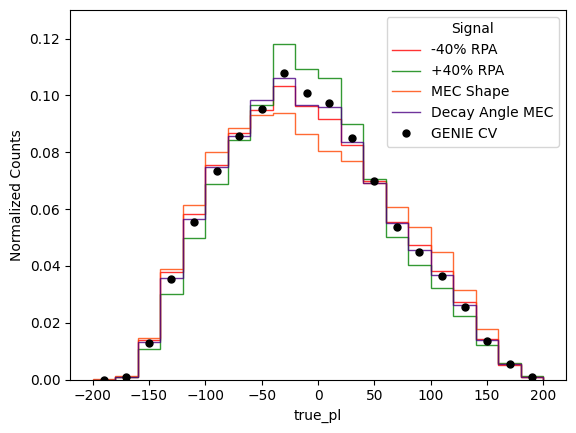

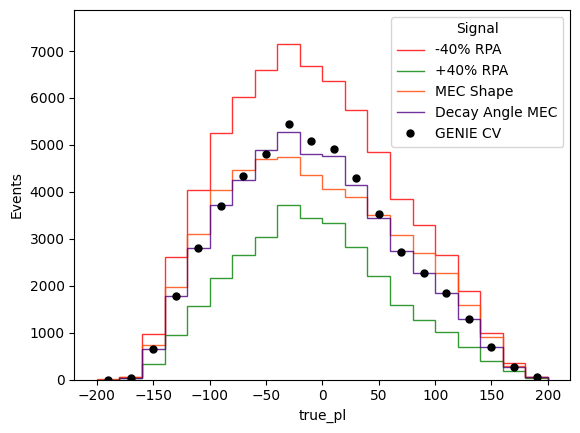

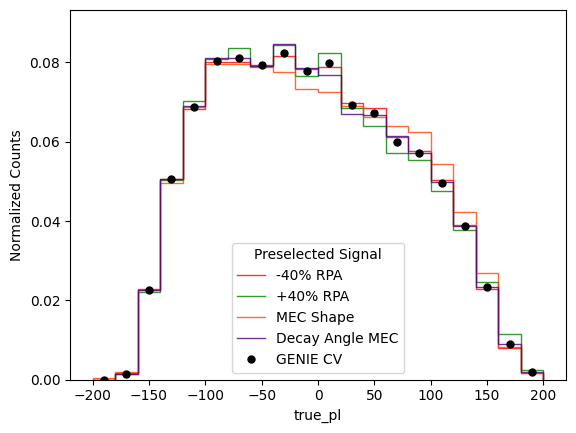

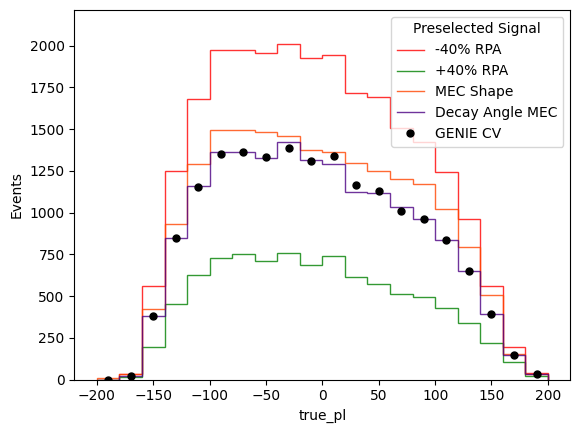

In [35]:
var = 'true_pl'
xmin = -200
xmax = 200
nbins = 20
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


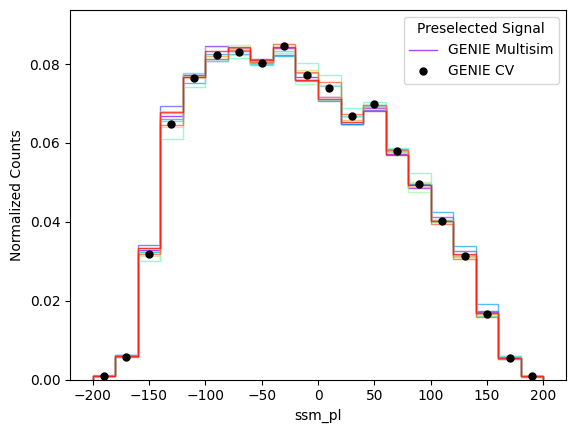

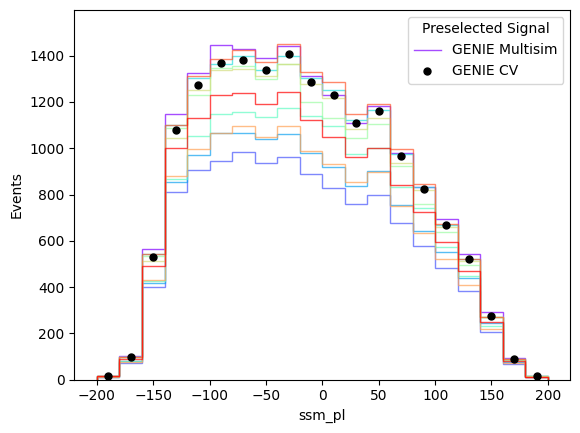

In [36]:
var = 'ssm_pl'
xmin = -200
xmax = 200
nbins = 20
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

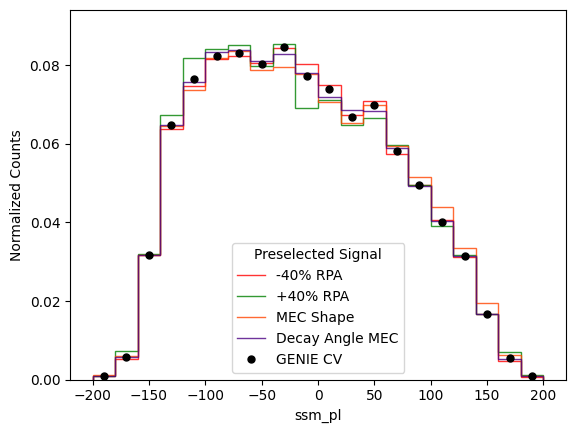

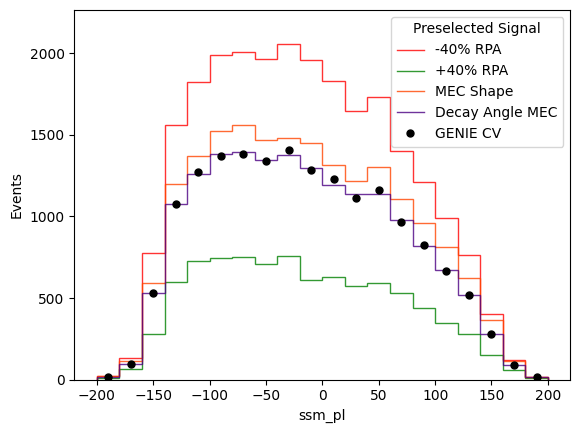

In [37]:
var = 'ssm_pl'
xmin = -200
xmax = 200
nbins = 20
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


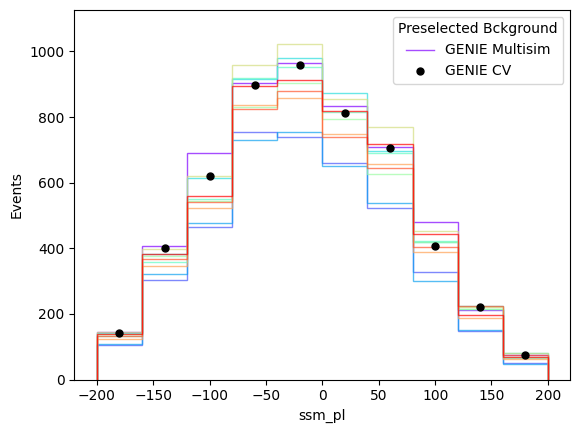

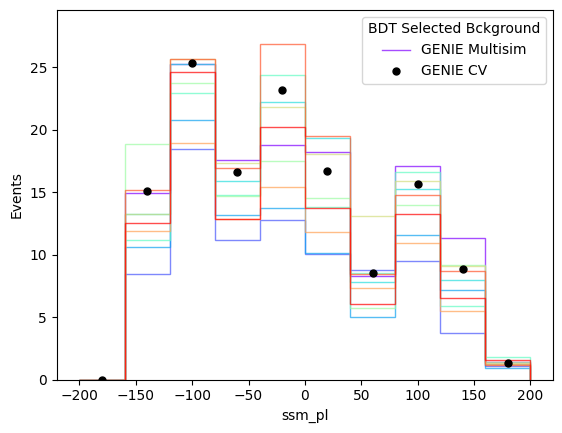

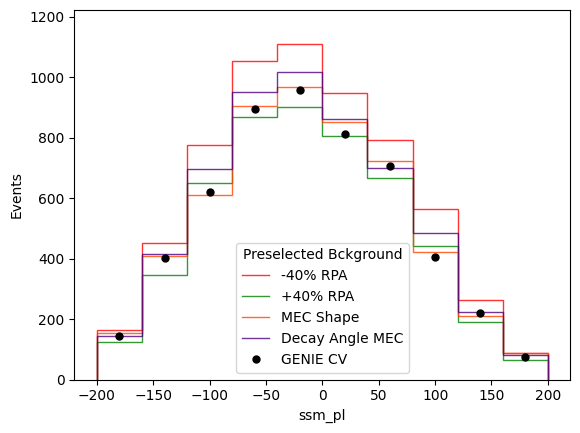

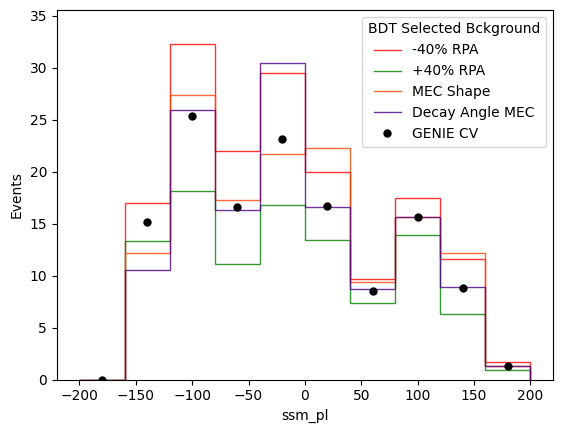

In [38]:
var = 'ssm_pl'
xmin = -200
xmax = 200
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


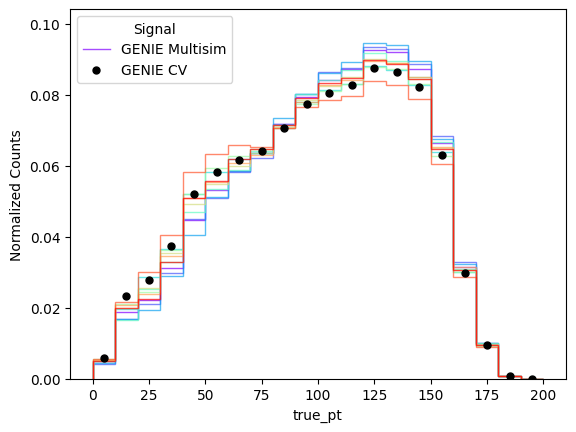

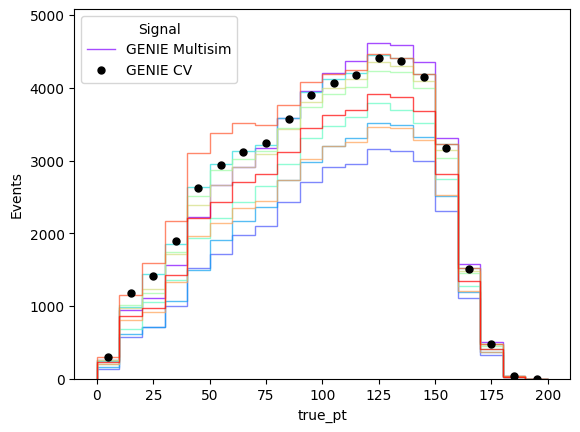

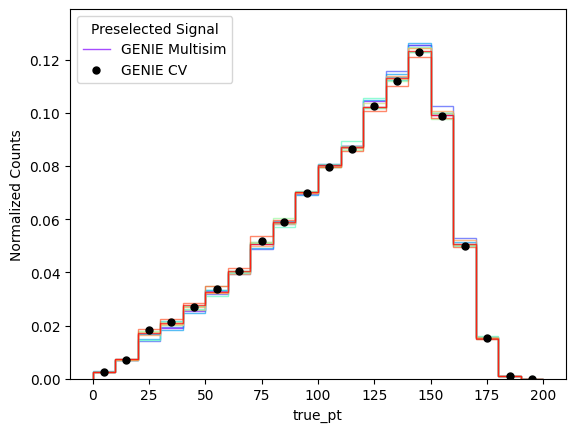

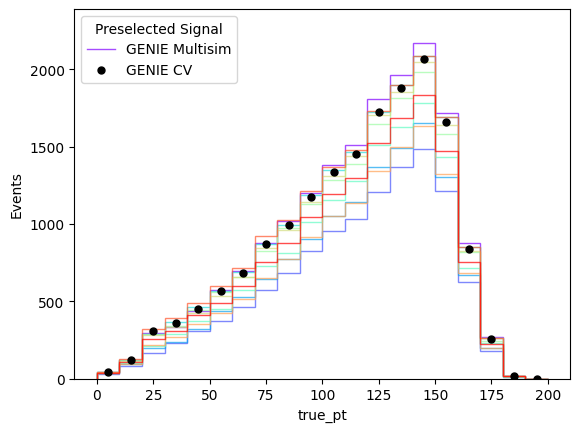

In [39]:
var = 'true_pt'
xmin = 0
xmax = 200
nbins = 20
check_var(var,xmin,xmax,nbins,check_presel=False)
check_var(var,xmin,xmax,nbins,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

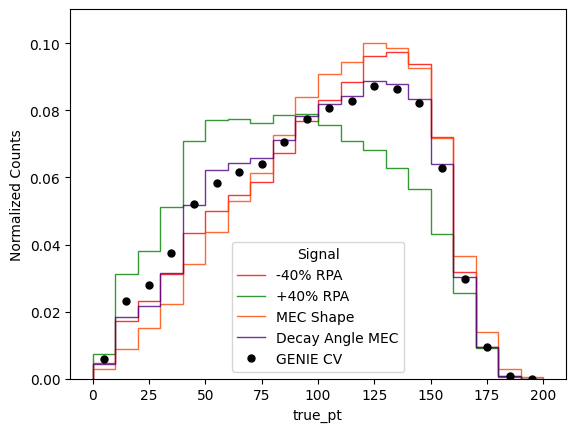

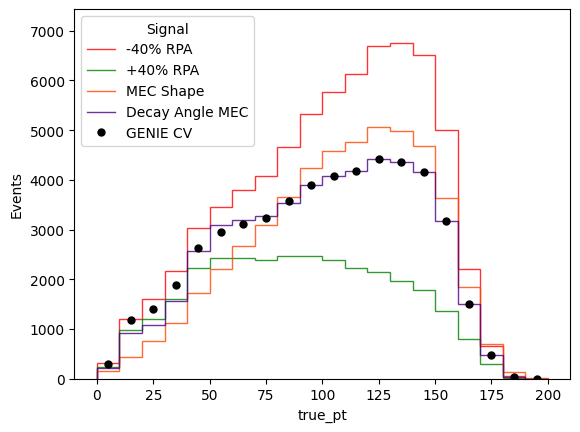

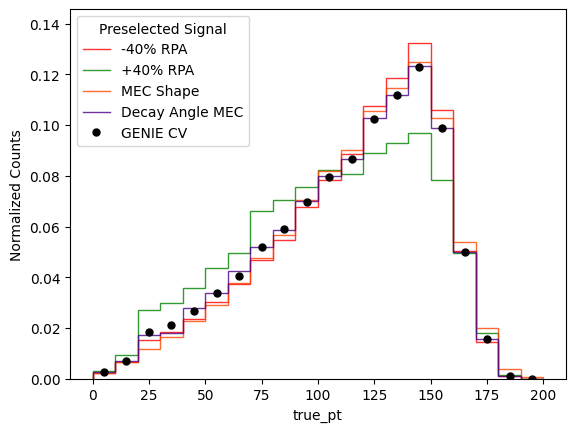

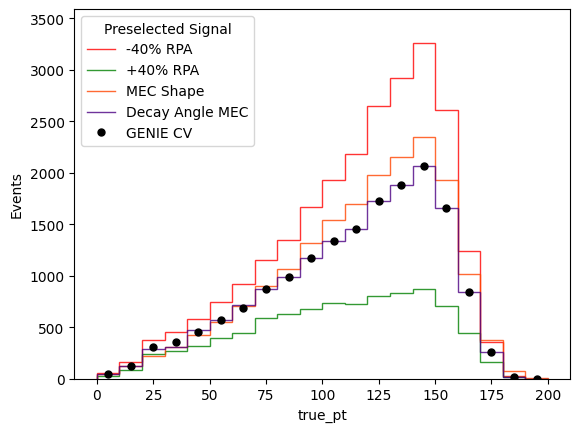

In [40]:
var = 'true_pt'
xmin = 0
xmax = 200
nbins = 20
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


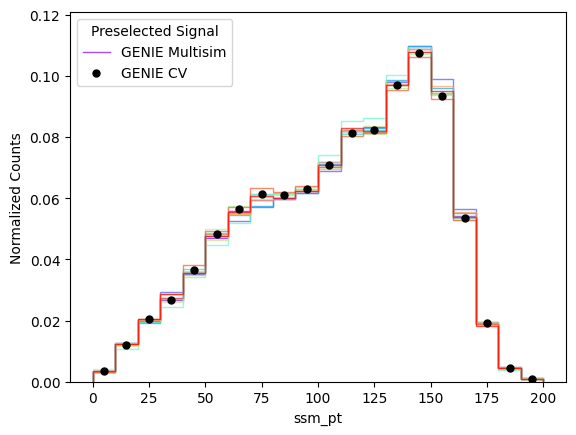

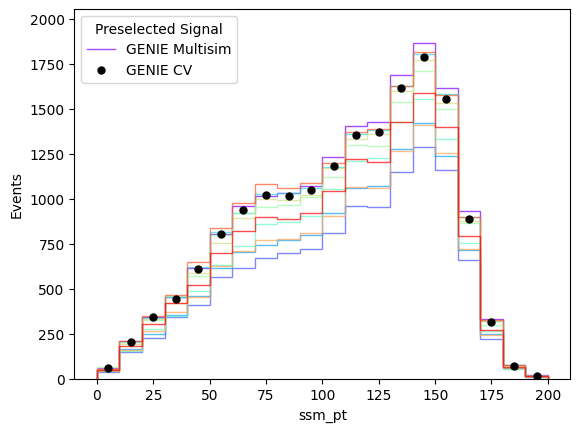

In [41]:
var = 'ssm_pt'
xmin = 0
xmax = 200
nbins = 20

check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

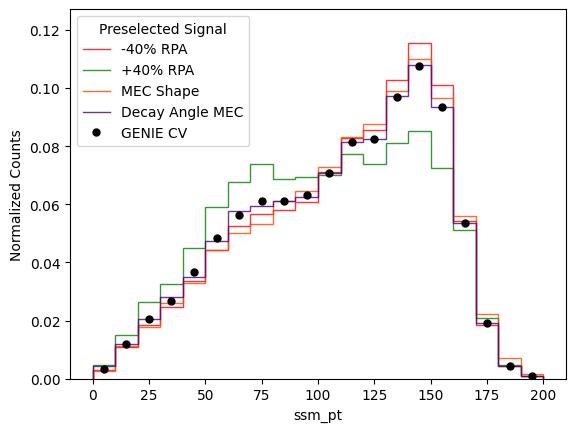

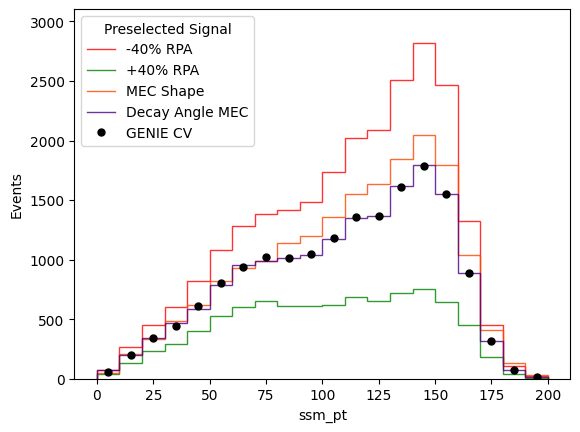

In [42]:
var = 'ssm_pt'
xmin = 0
xmax = 200
nbins = 20
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


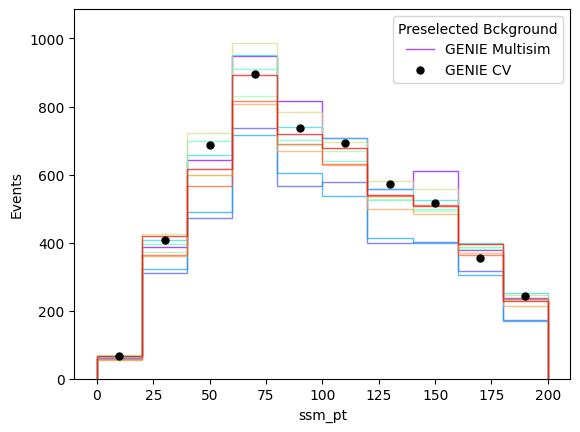

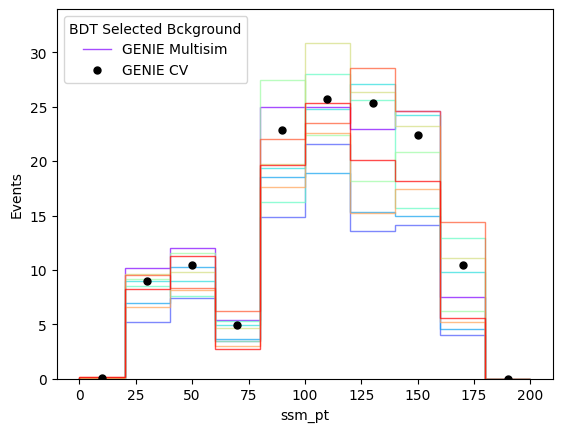

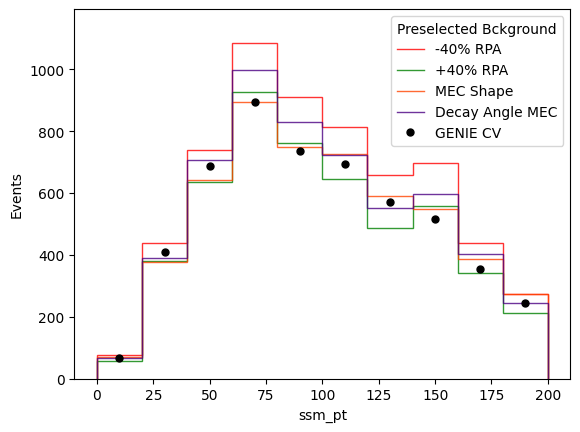

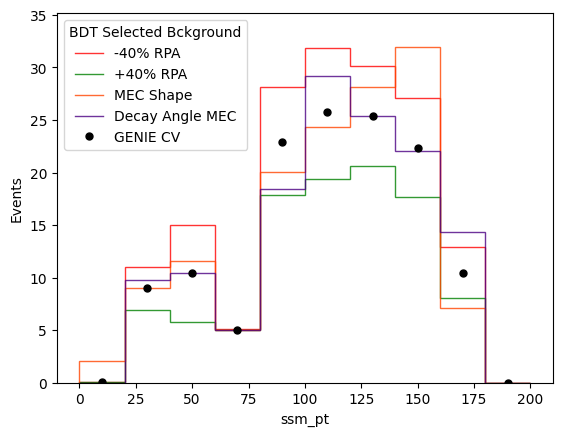

In [97]:
var = 'ssm_pt'
xmin = 0
xmax = 200
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


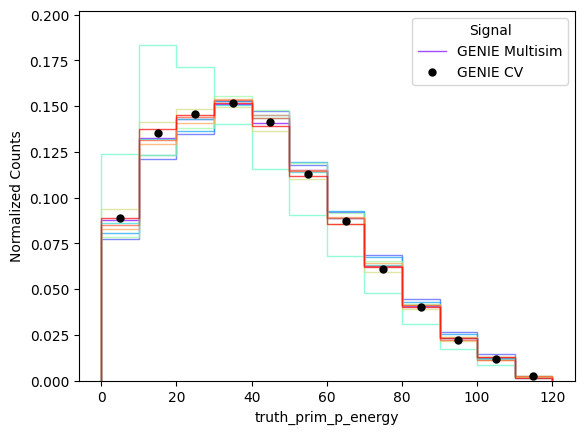

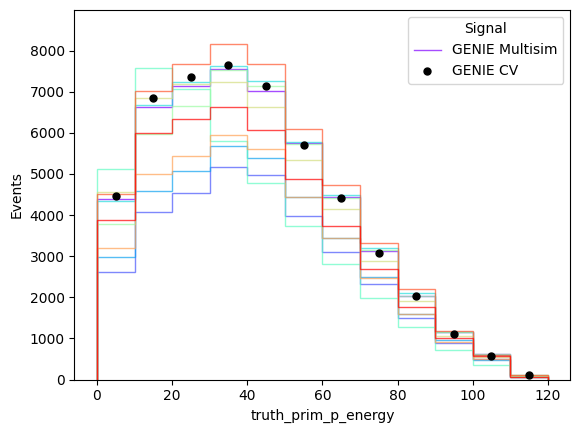

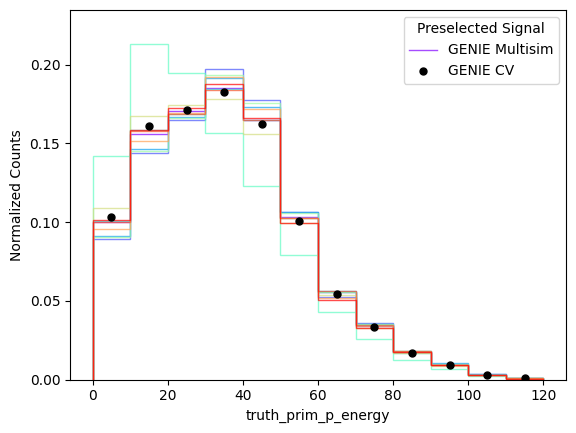

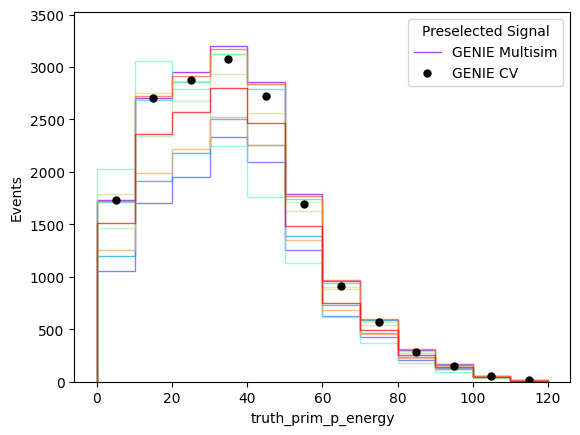

In [44]:
var = 'truth_prim_p_energy'
xmin = 0
xmax = 120
nbins = 12
check_var(var,xmin,xmax,nbins,check_presel=False)
check_var(var,xmin,xmax,nbins,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

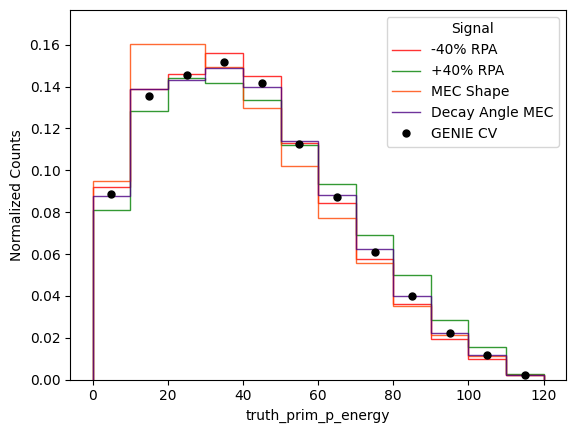

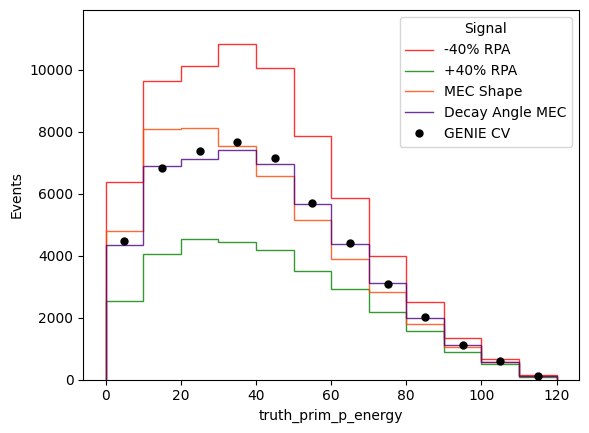

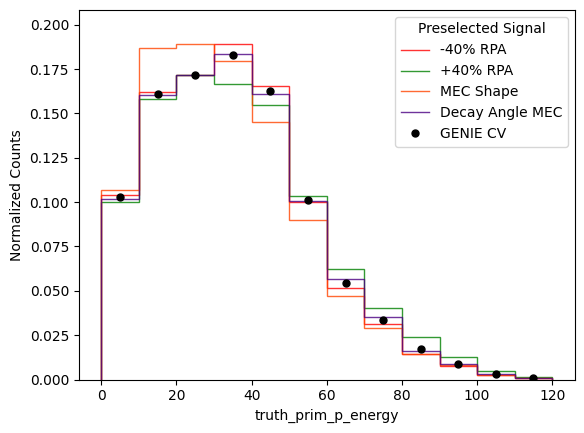

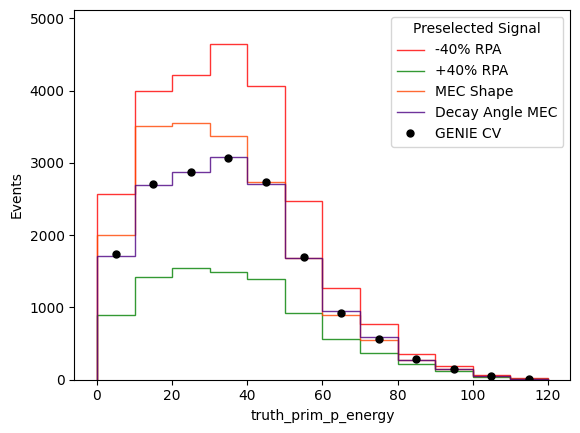

In [45]:
var = 'truth_prim_p_energy'
xmin = 0
xmax = 120
nbins = 12
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


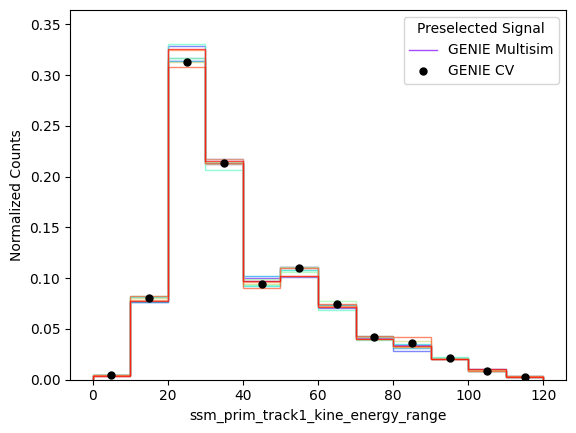

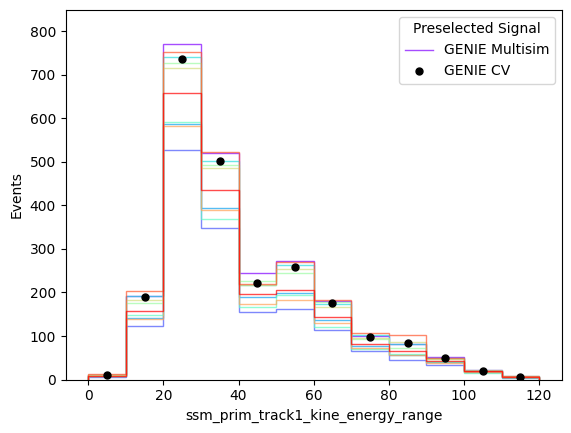

In [46]:
var = 'ssm_prim_track1_kine_energy_range'
xmin = 0
xmax = 120
nbins = 12

check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

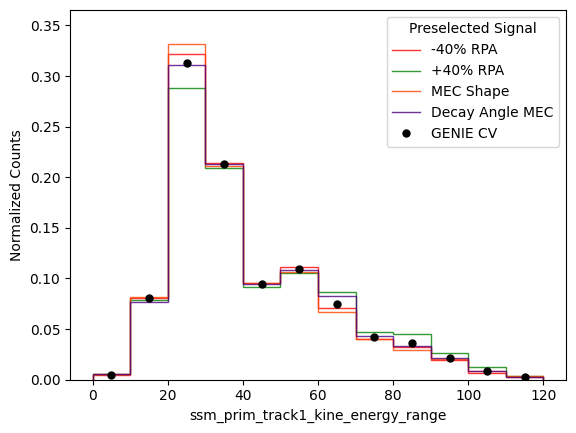

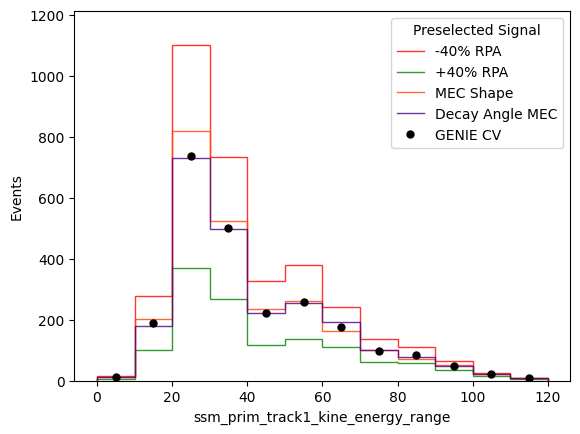

In [47]:
var = 'ssm_prim_track1_kine_energy_range'
xmin = 0
xmax = 120
nbins = 12
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


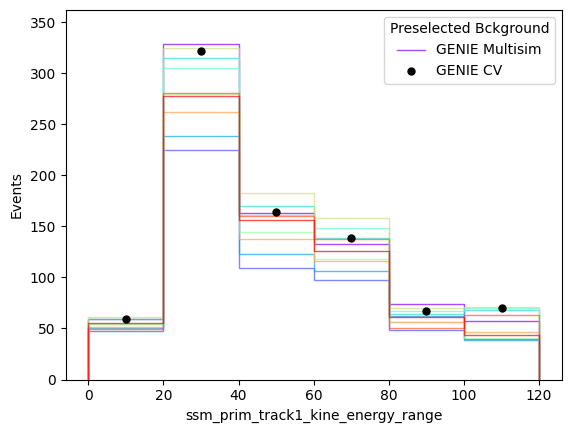

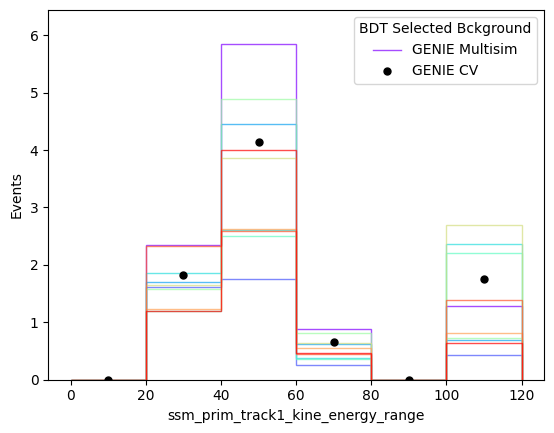

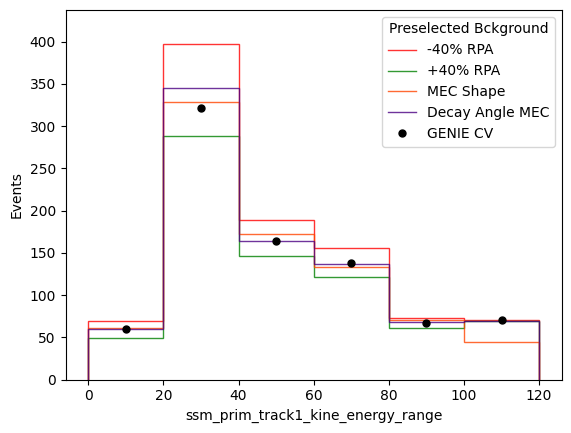

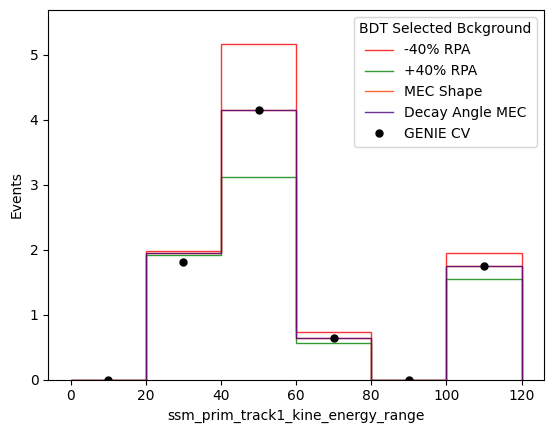

In [48]:
var = 'ssm_prim_track1_kine_energy_range'
xmin = 0
xmax = 120
nbins = 6
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


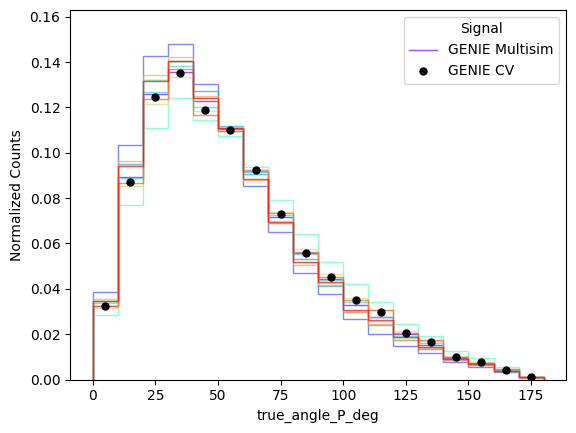

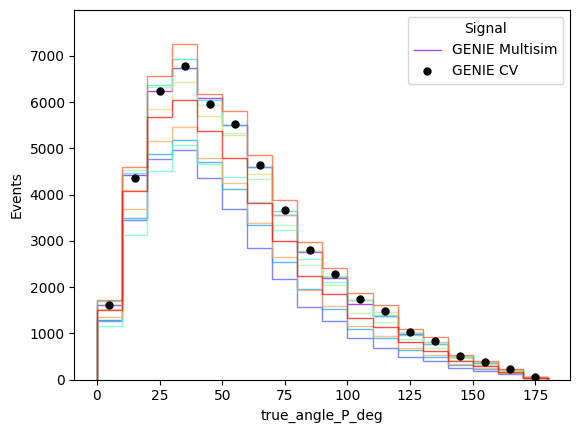

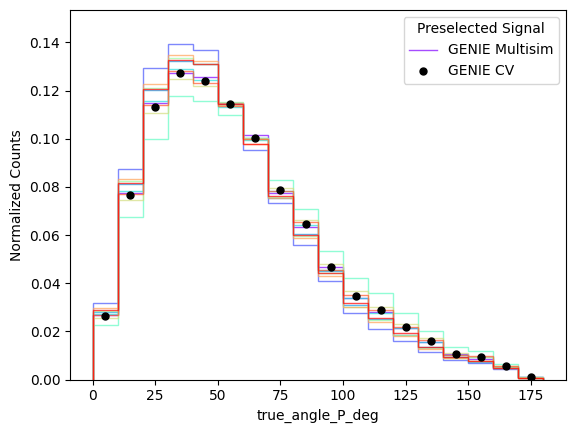

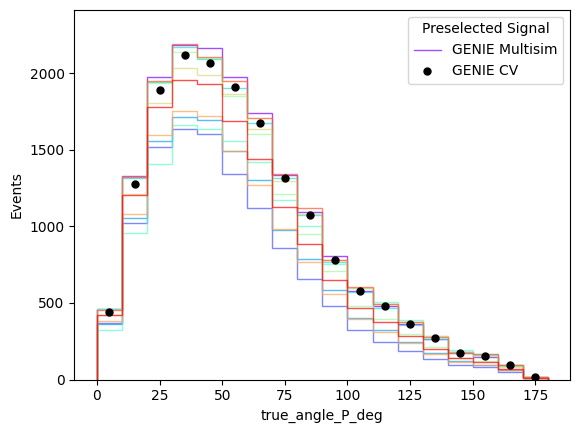

In [49]:
var = 'true_angle_P_deg'
xmin = 0
xmax = 180
nbins = 18
check_var(var,xmin,xmax,nbins,check_presel=False)
check_var(var,xmin,xmax,nbins,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

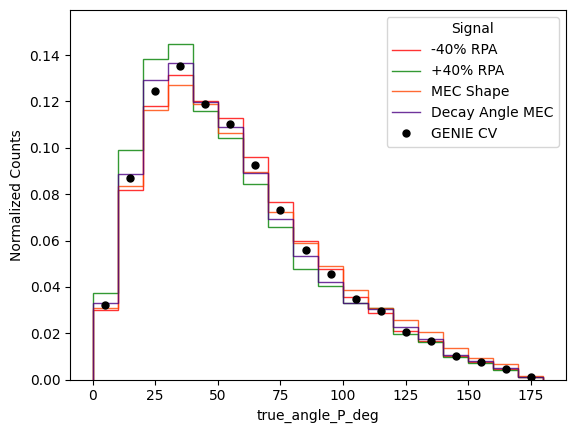

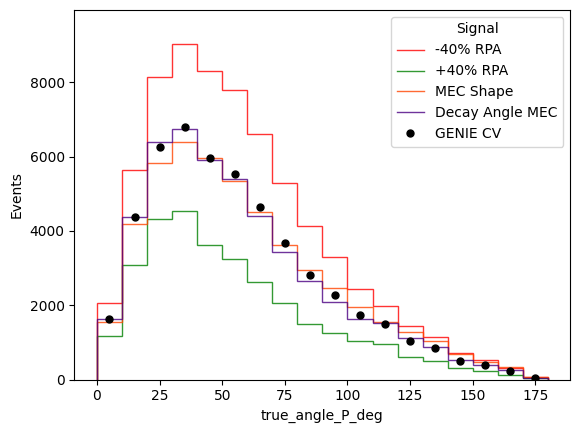

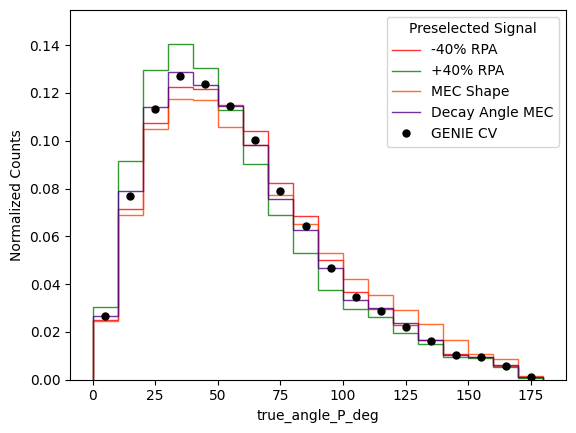

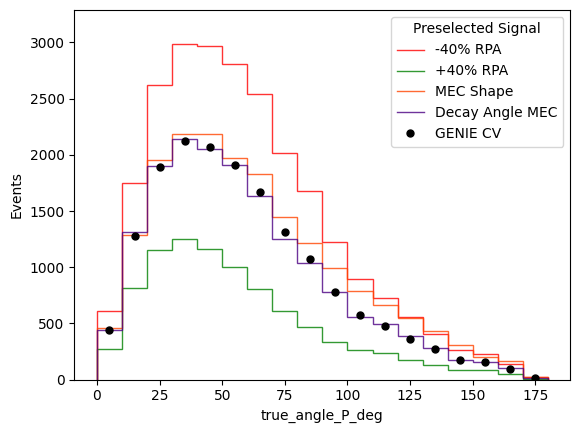

In [50]:
var = 'true_angle_P_deg'
xmin = 0
xmax = 180
nbins = 18
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


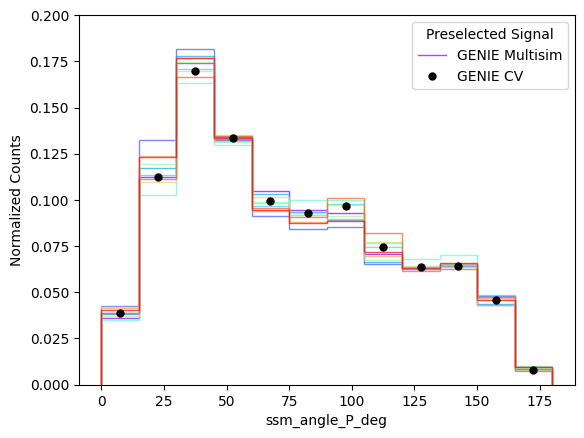

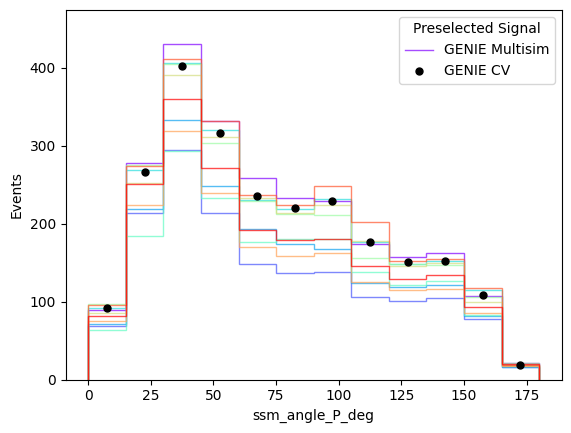

In [51]:
var = 'ssm_angle_P_deg'
xmin = 0
xmax = 180
nbins = 12
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

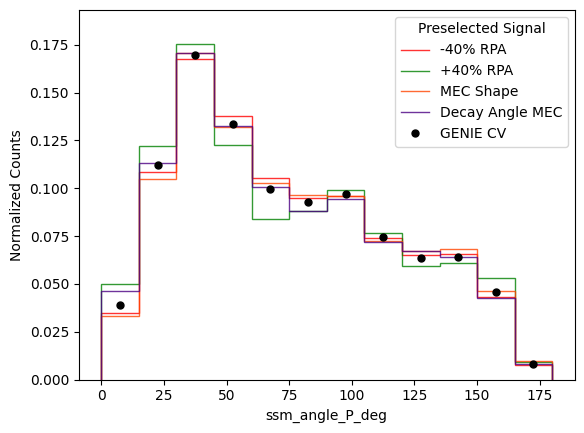

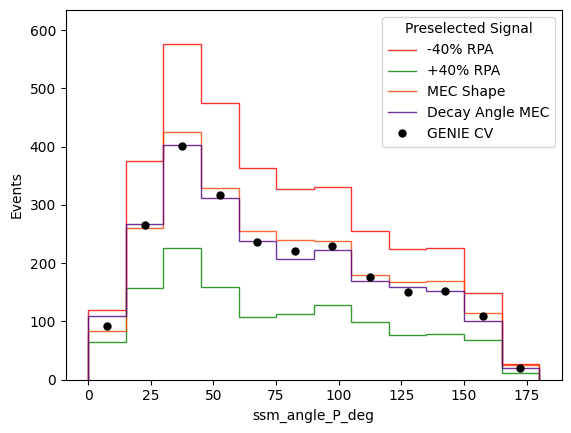

In [52]:
var = 'ssm_angle_P_deg'
xmin = 0
xmax = 180
nbins = 12

check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


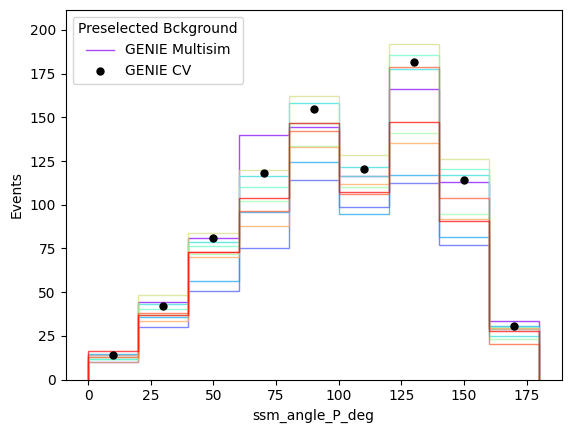

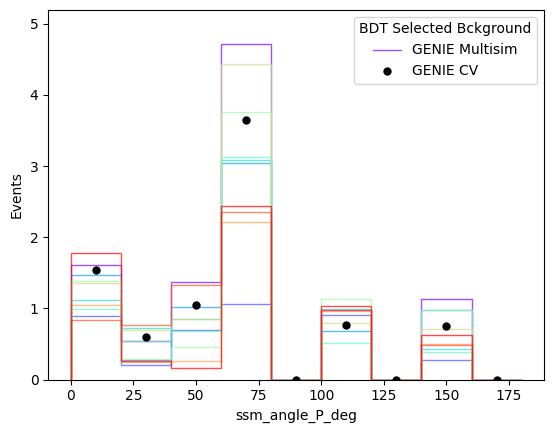

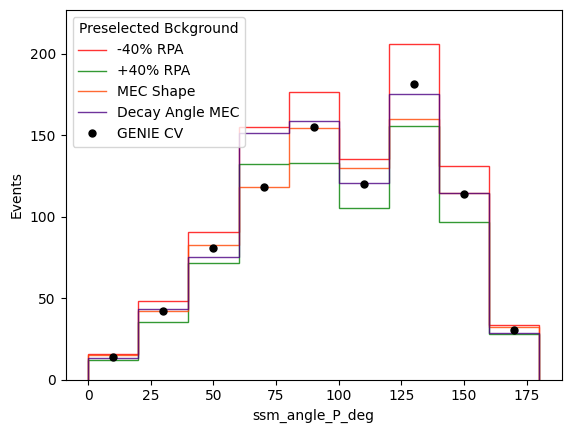

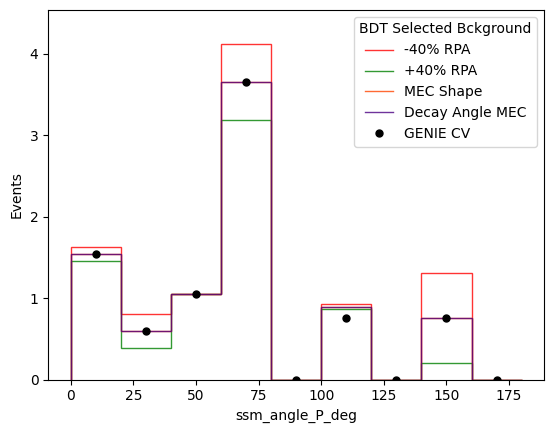

In [53]:
var = 'ssm_angle_P_deg'
xmin = 0
xmax = 180
nbins = 9
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


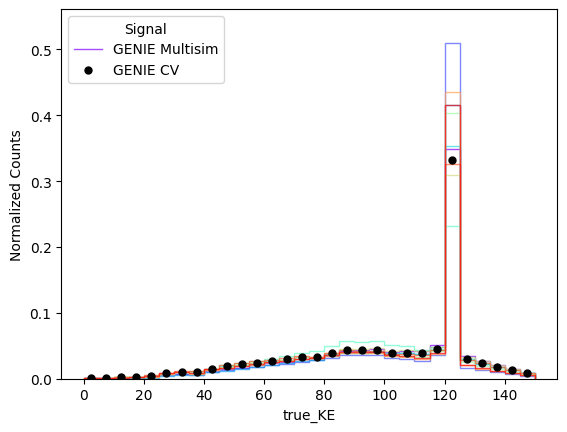

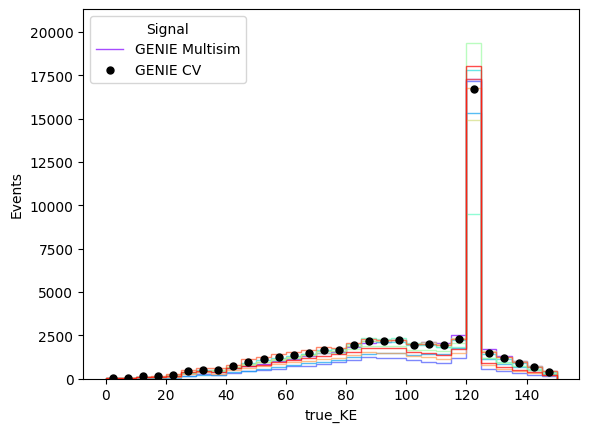

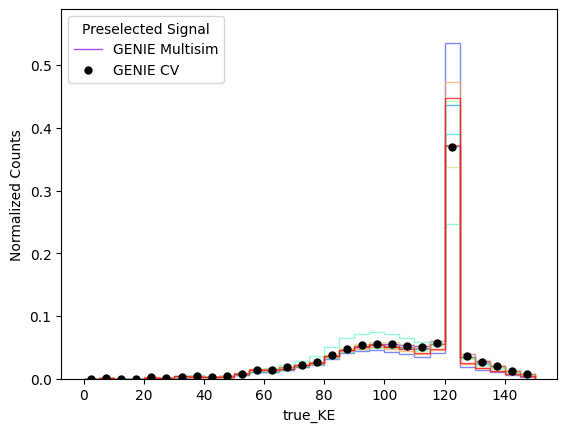

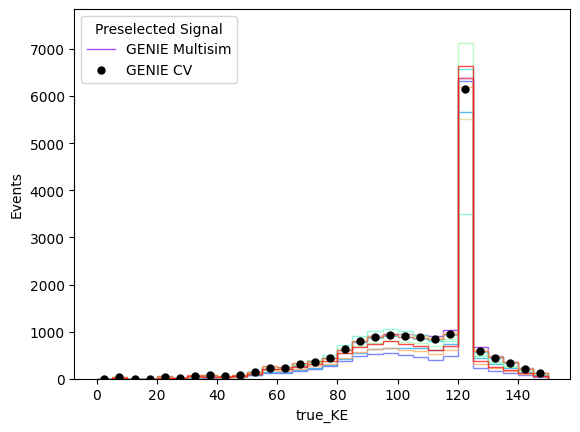

In [54]:
var = 'true_KE'
xmin = 0
xmax = 150
nbins = 30
check_var(var,xmin,xmax,nbins,check_presel=False)
check_var(var,xmin,xmax,nbins,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

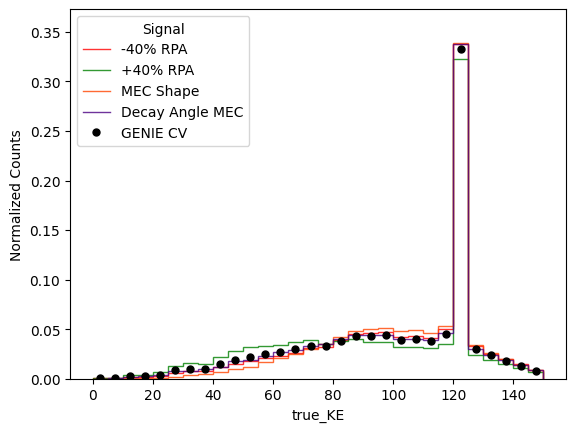

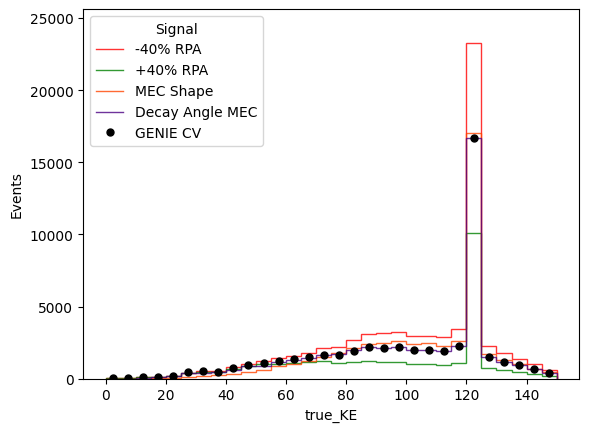

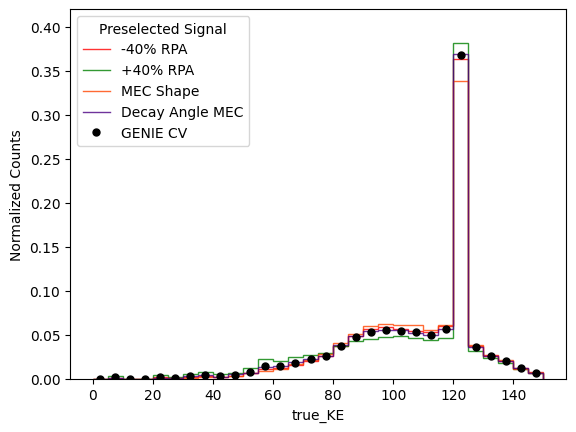

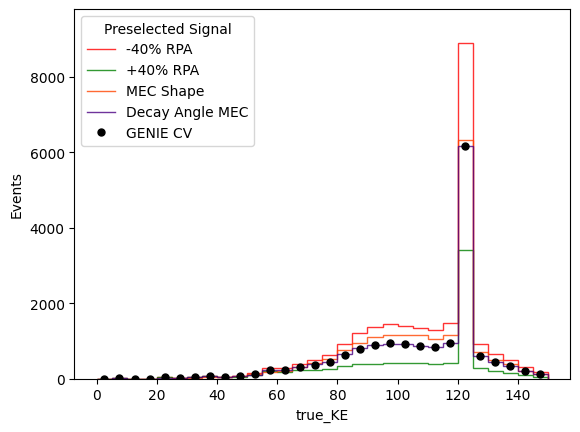

In [55]:
var = 'true_KE'
xmin = 0
xmax = 150
nbins = 30
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


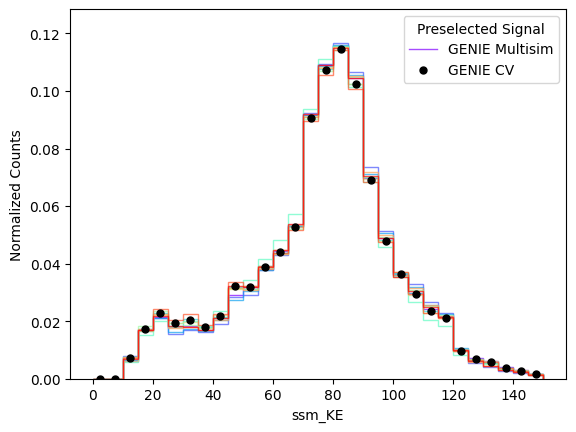

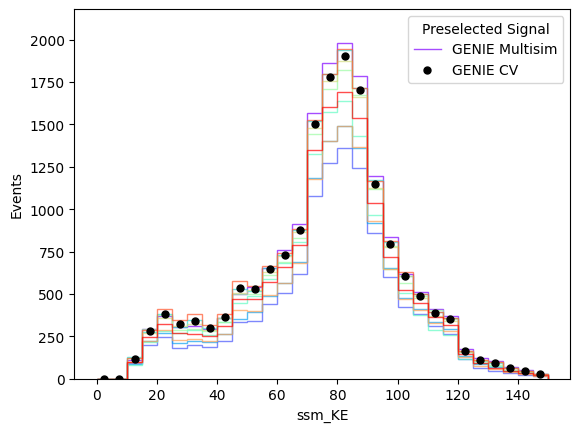

In [56]:
var = 'ssm_KE'
xmin = 0
xmax = 150
nbins = 30

check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

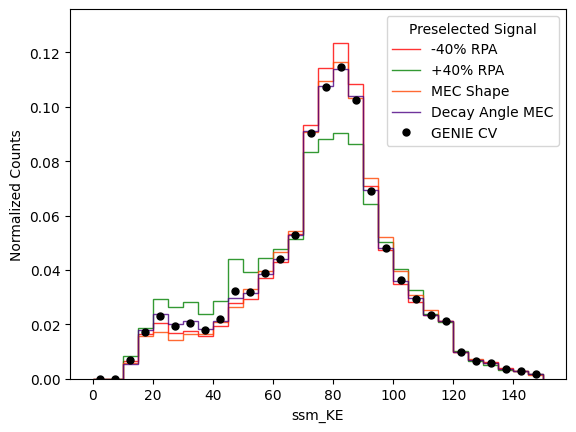

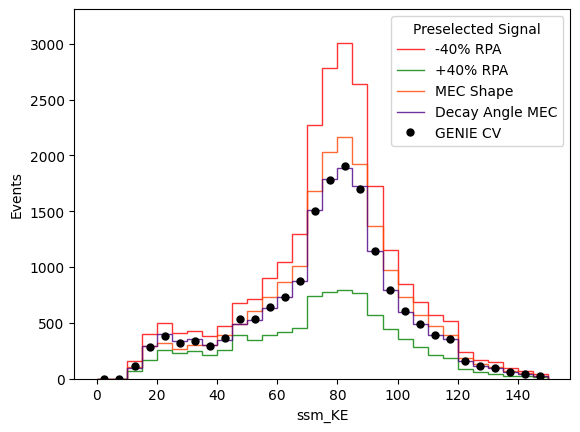

In [57]:
var = 'ssm_KE'
xmin = 0
xmax = 150
nbins = 30
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


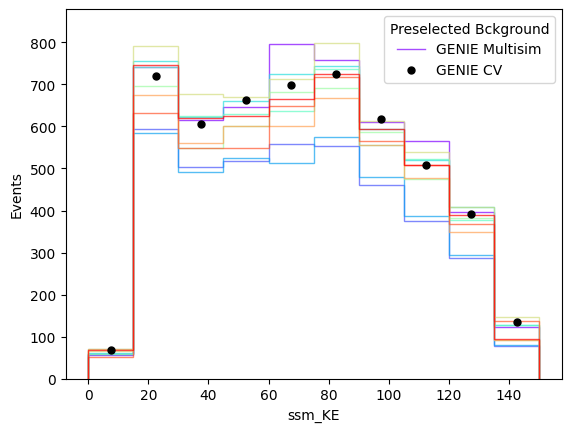

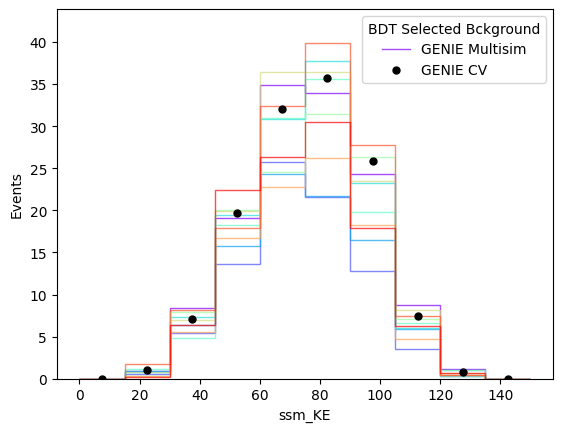

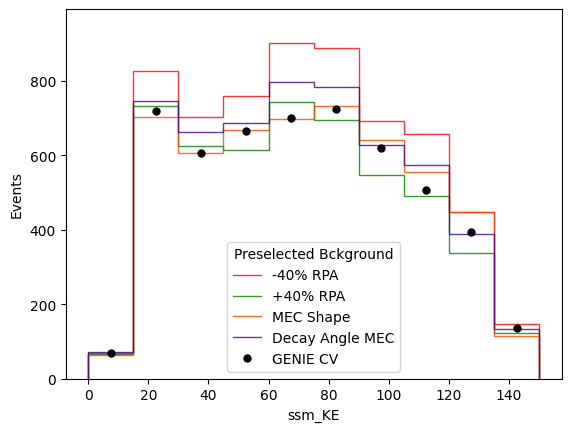

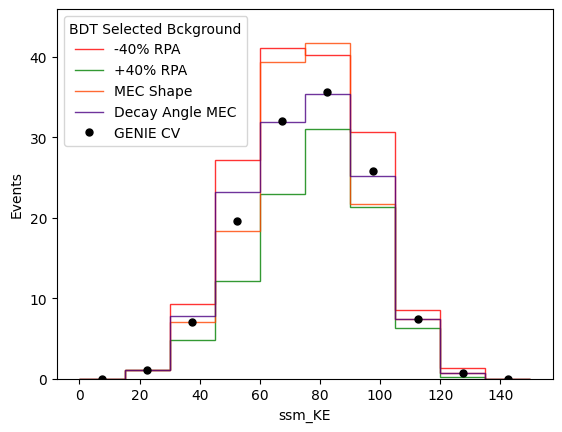

In [58]:
var = 'ssm_KE'
xmin = 0
xmax = 150
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


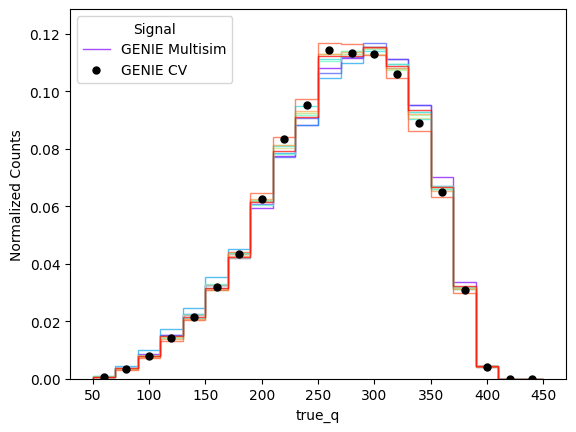

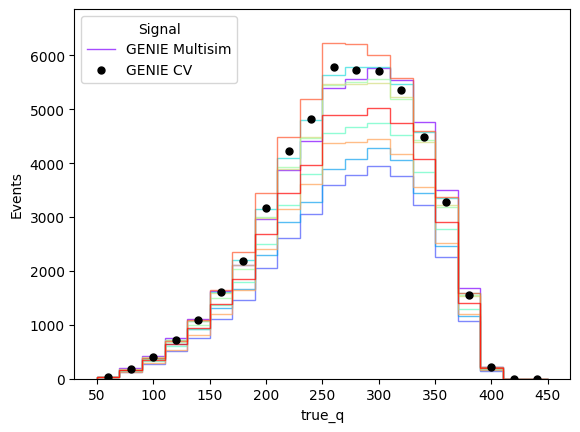

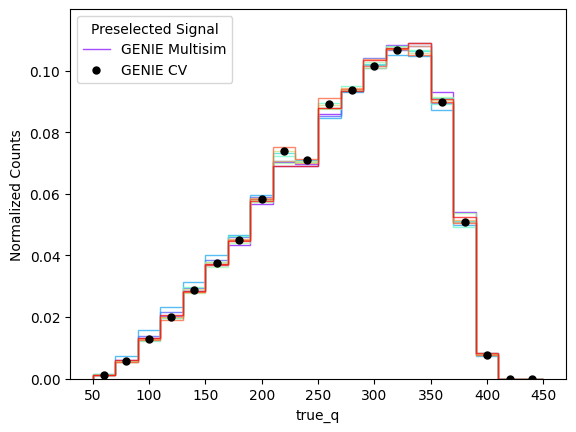

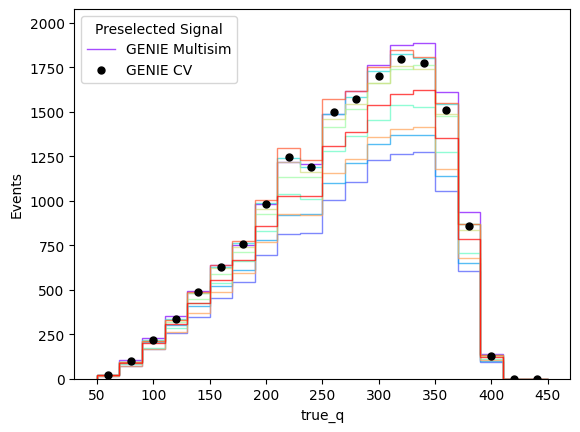

In [59]:
var = 'true_q'
xmin = 50
xmax = 450
nbins = 20
check_var(var,xmin,xmax,nbins,check_presel=False)
check_var(var,xmin,xmax,nbins,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

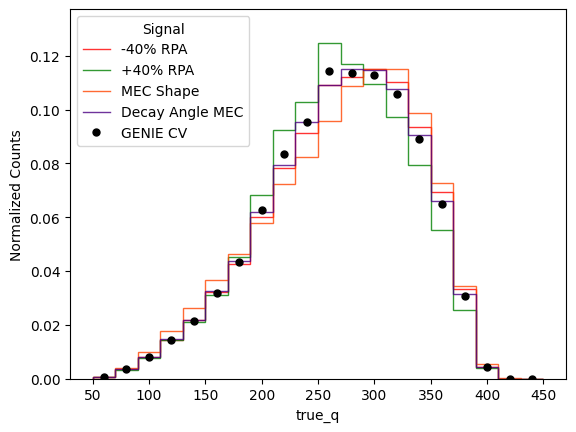

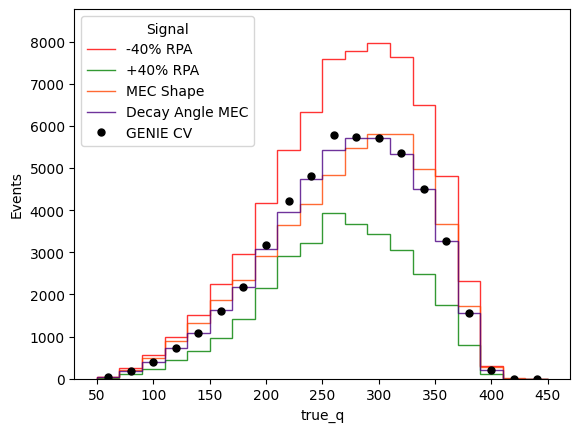

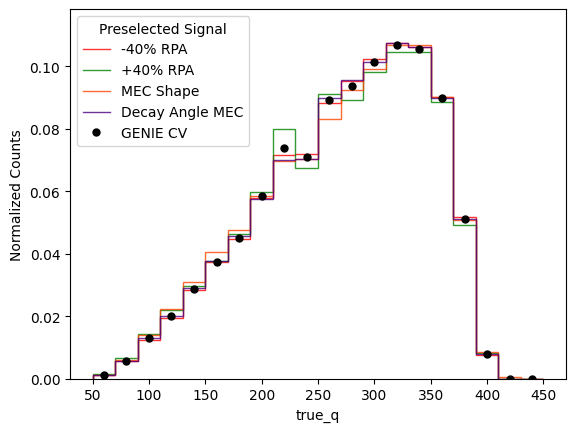

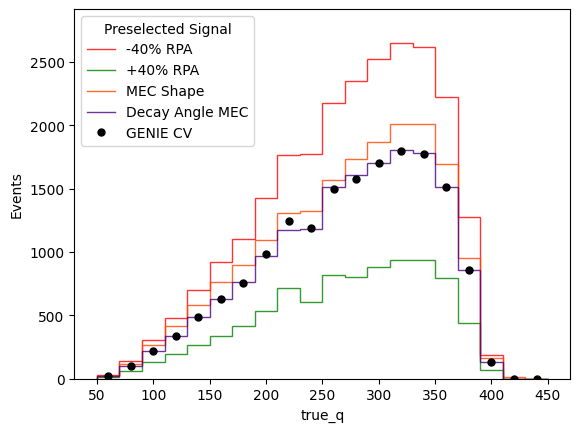

In [60]:
var = 'true_q'
xmin = 50
xmax = 450
nbins = 20
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


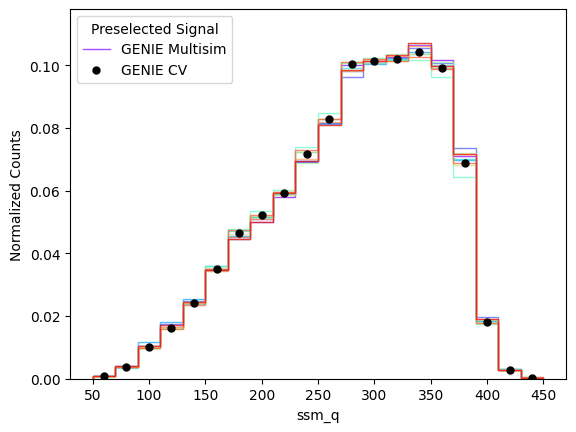

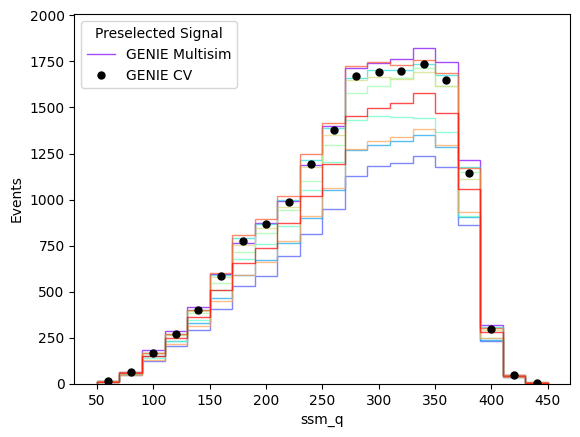

In [61]:
var = 'ssm_q'
xmin = 50
xmax = 450
nbins = 20

check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

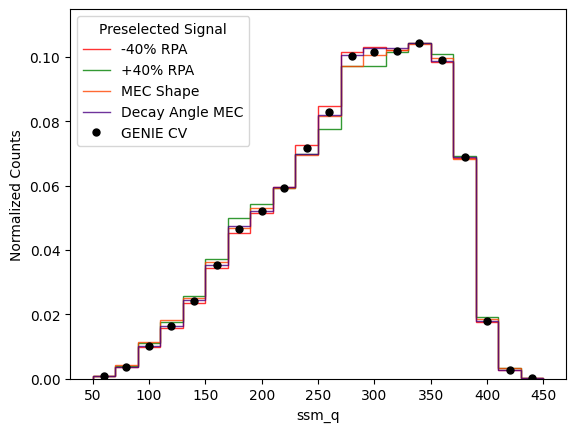

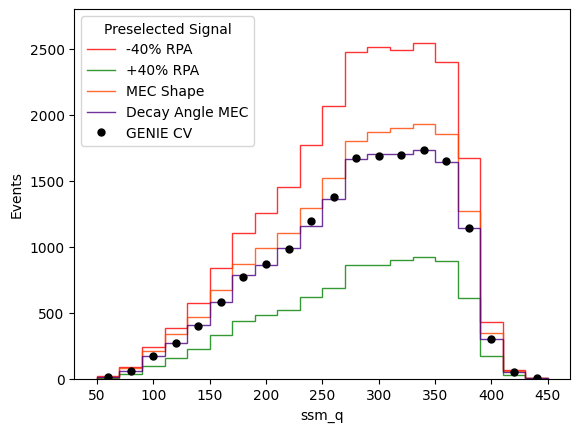

In [62]:
var = 'ssm_q'
xmin = 50
xmax = 450
nbins = 20
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


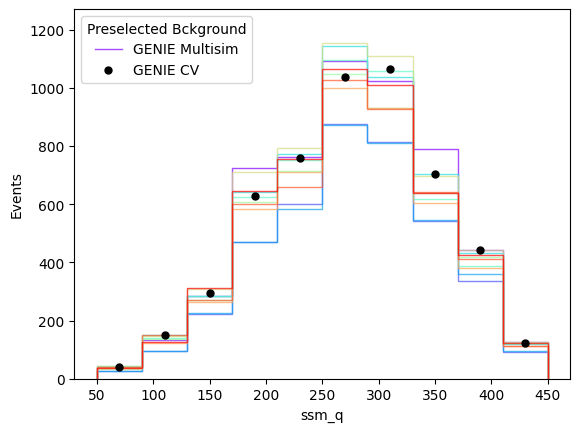

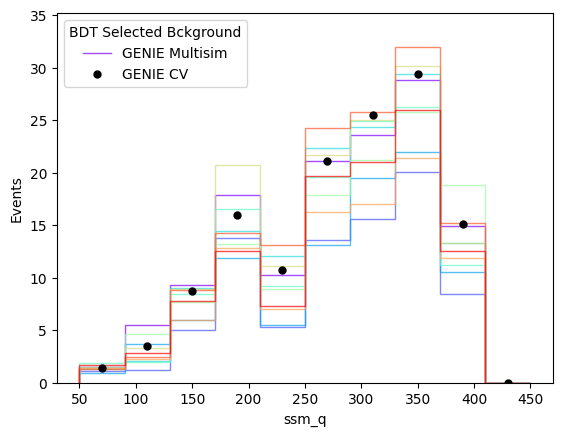

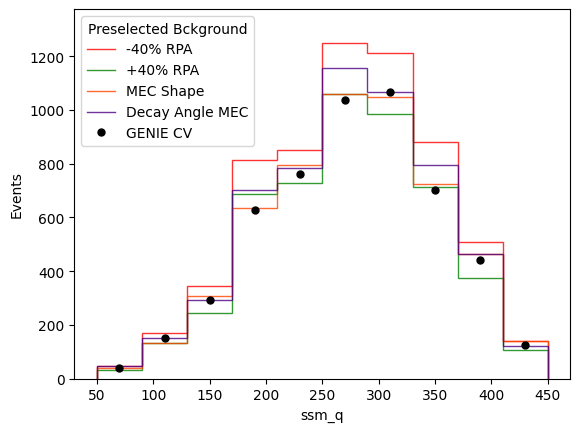

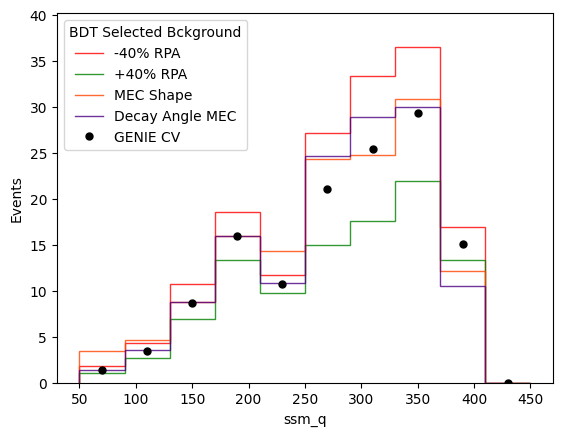

In [98]:
var = 'ssm_q'
xmin = 50
xmax = 450
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


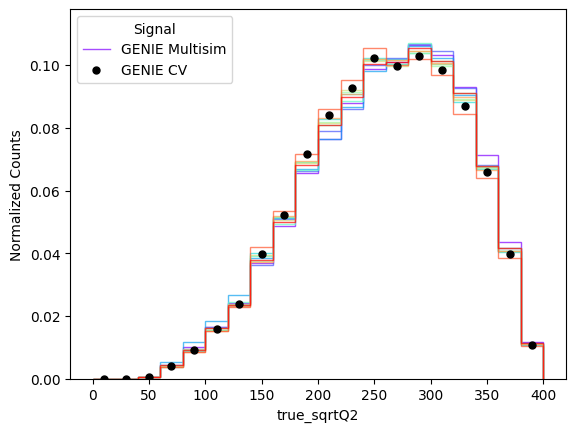

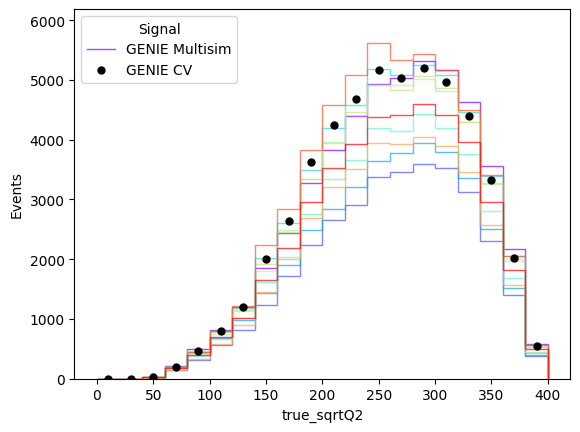

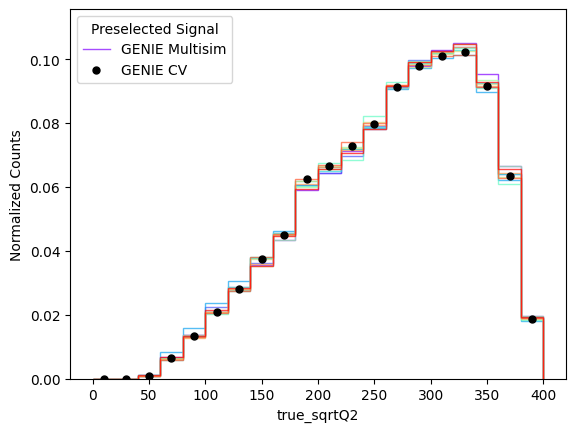

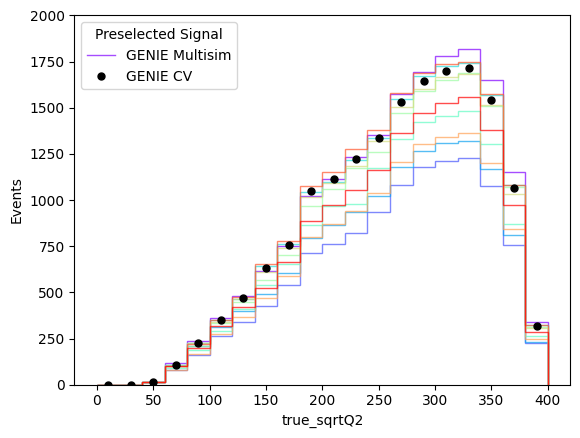

In [63]:
var = 'true_sqrtQ2'
xmin = 0
xmax = 400
nbins = 20
check_var(var,xmin,xmax,nbins,check_presel=False)
check_var(var,xmin,xmax,nbins,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

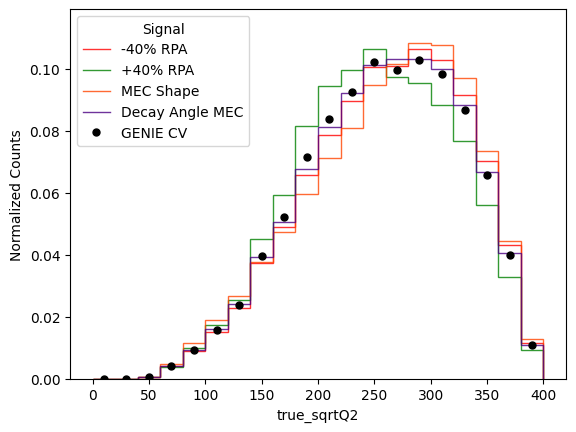

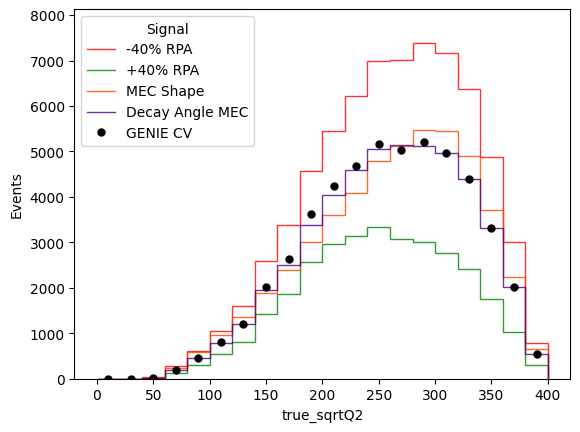

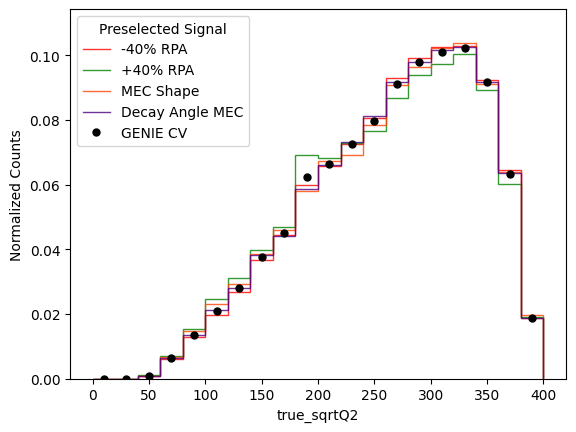

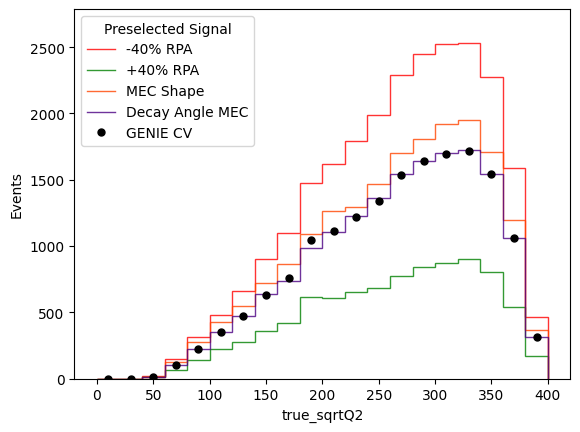

In [65]:
var = 'true_sqrtQ2'
xmin = 0
xmax = 400
nbins = 20
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=False,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


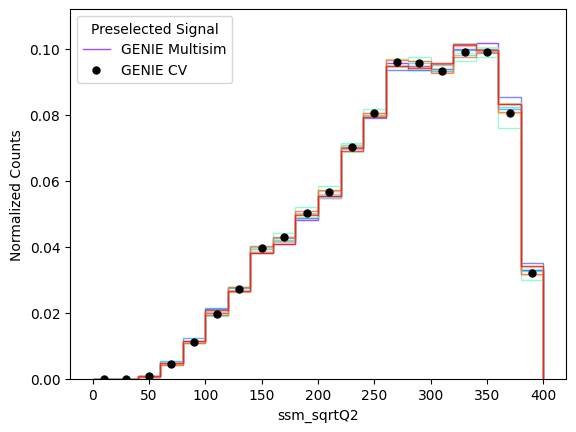

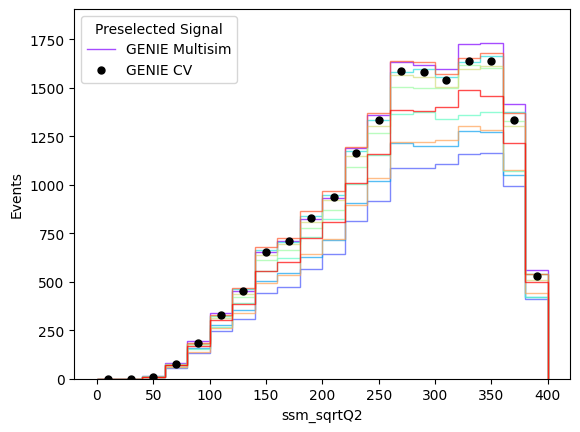

In [66]:
var = 'ssm_sqrtQ2'
xmin = 0
xmax = 400
nbins = 20

check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)

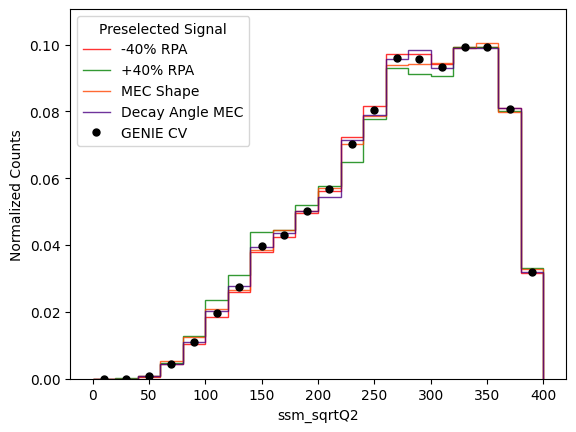

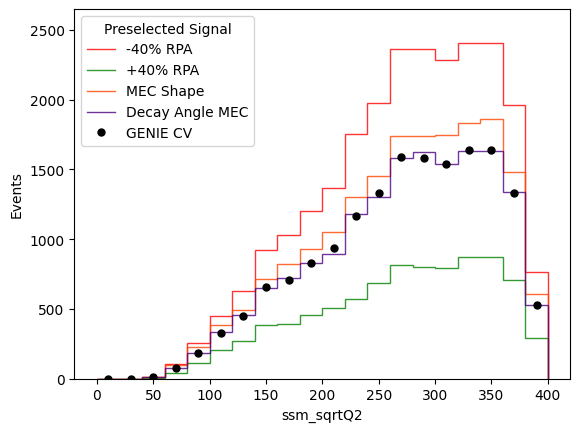

In [67]:
var = 'ssm_sqrtQ2'
xmin = 0
xmax = 400
nbins = 20
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


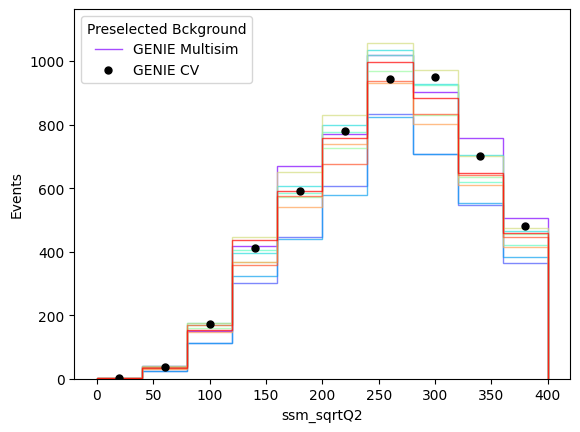

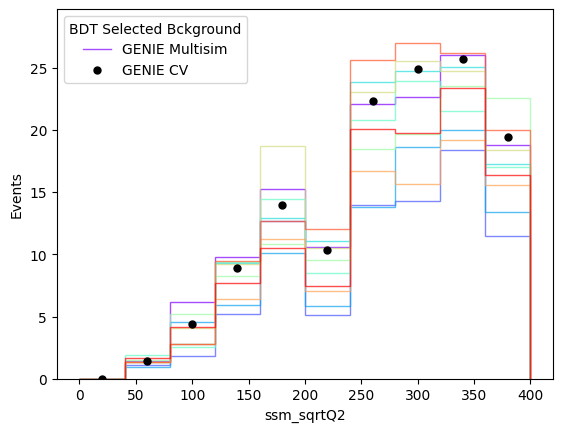

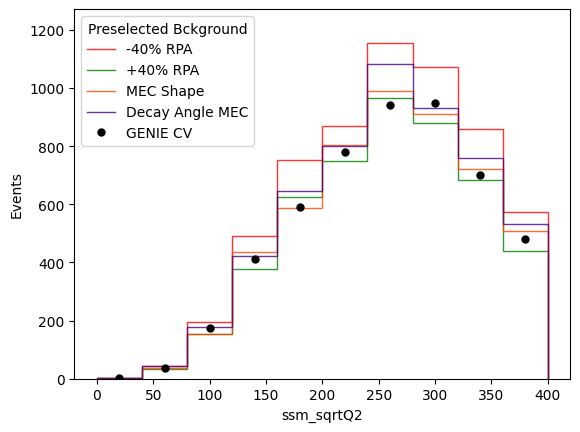

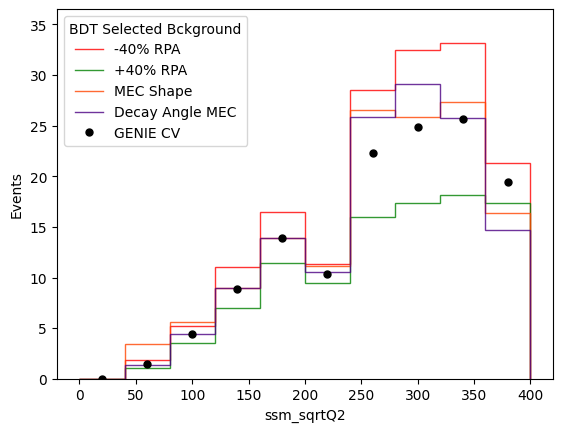

In [68]:
var = 'ssm_sqrtQ2'
xmin = 0
xmax = 400
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


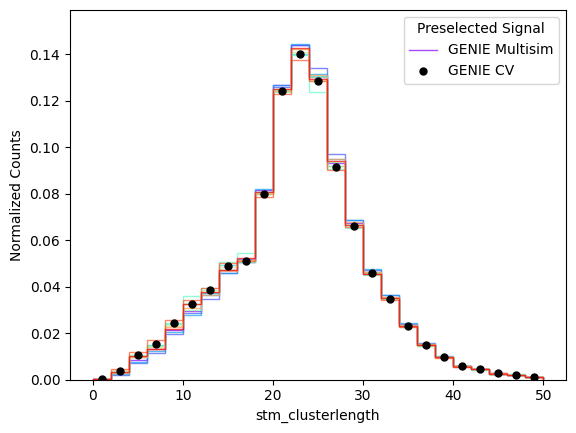

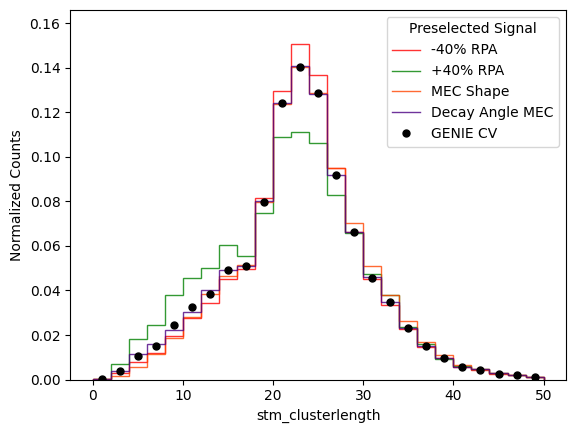

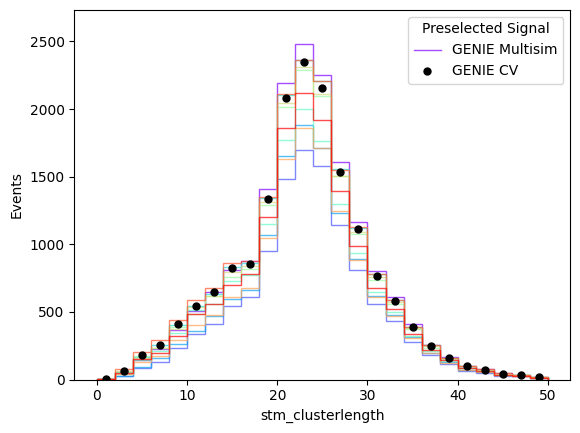

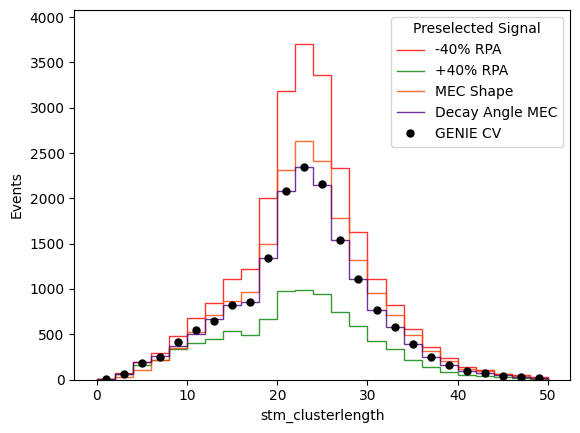

In [69]:
var = 'stm_clusterlength'
xmin = 0
xmax = 50
nbins = 25

check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)



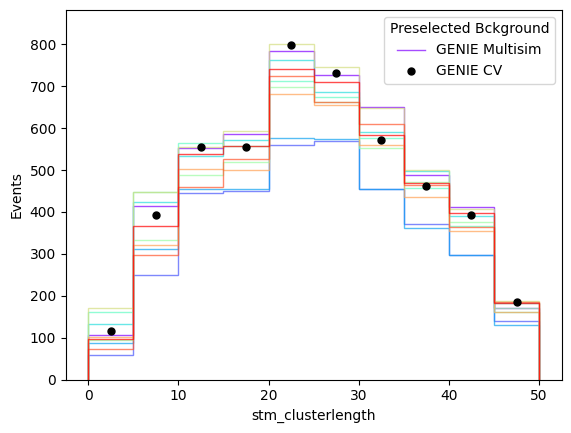

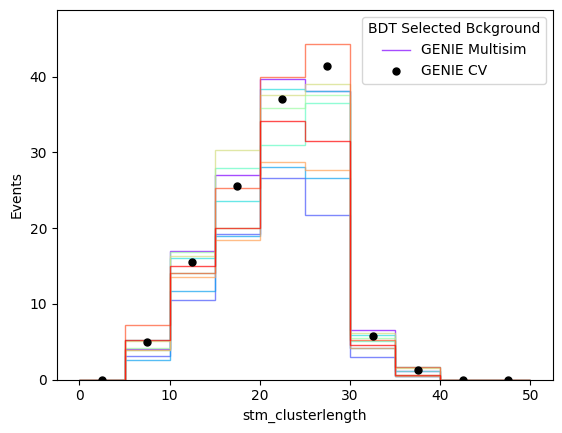

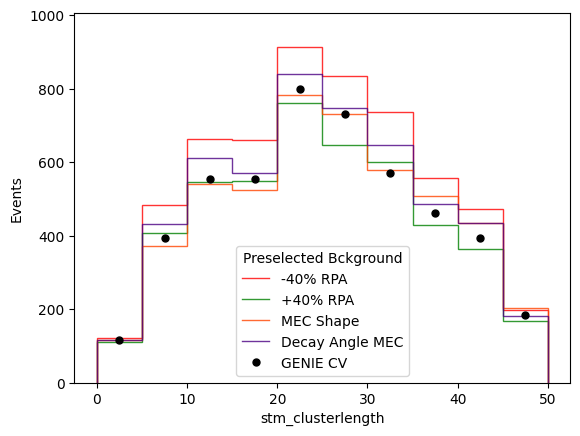

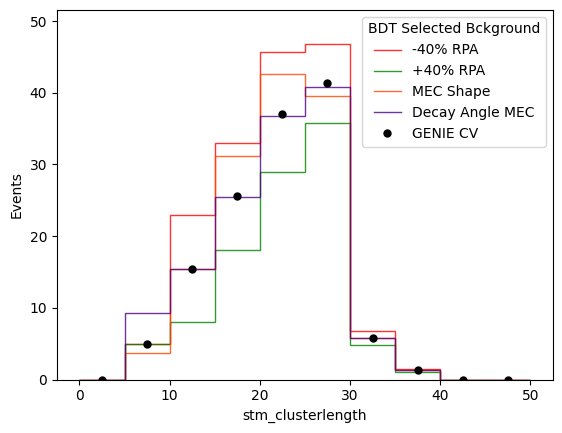

In [70]:
var = 'stm_clusterlength'
xmin = 0
xmax = 50
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


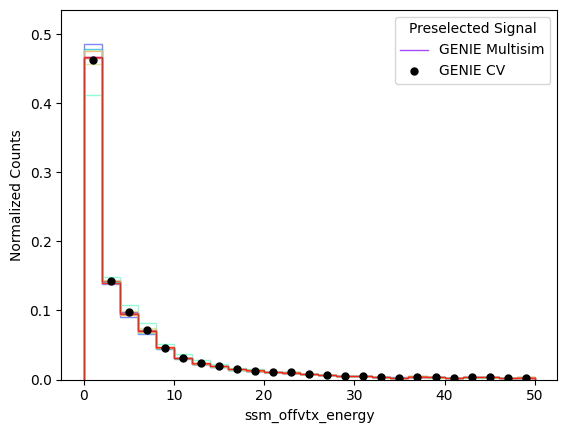

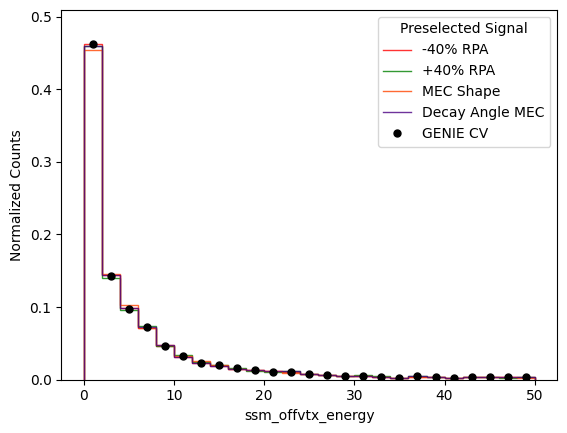

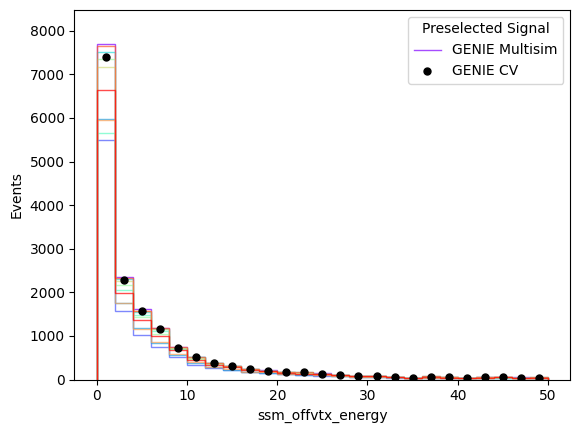

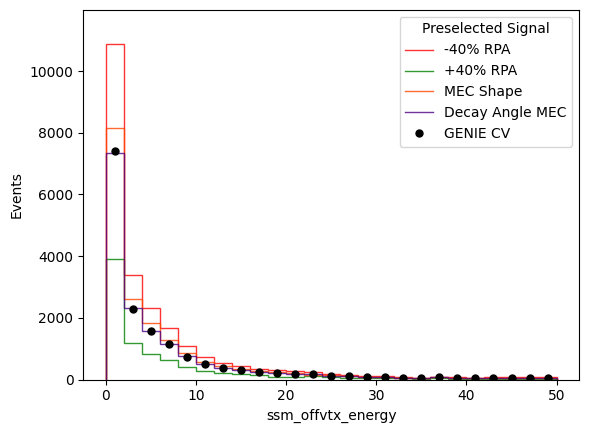

In [71]:
var = 'ssm_offvtx_energy'
xmin = 0
xmax = 50
nbins = 25

check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


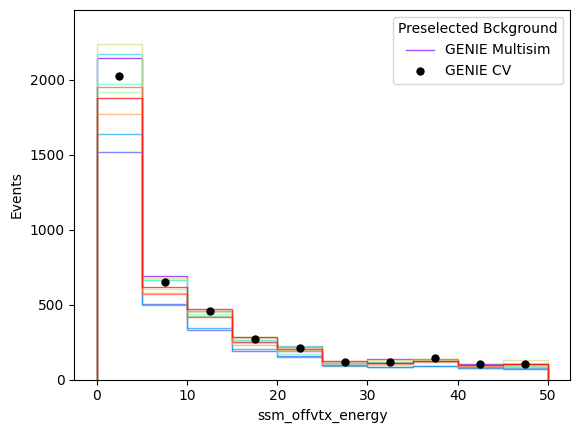

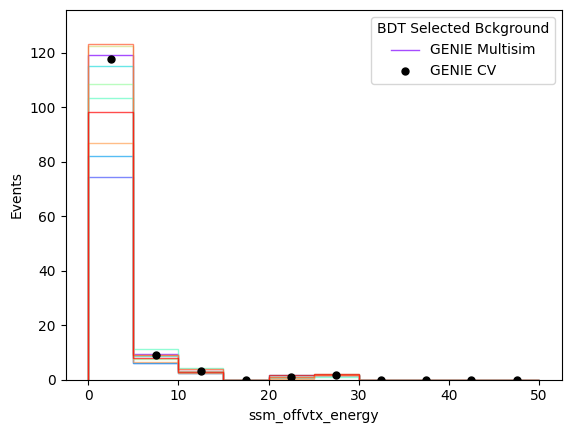

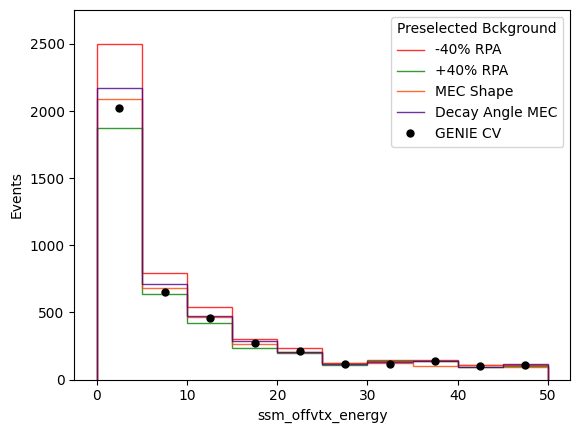

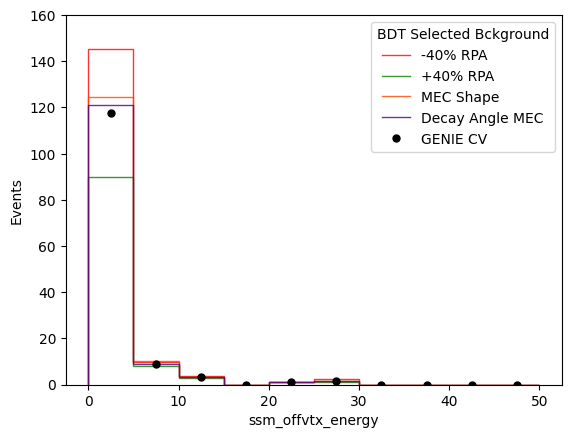

In [72]:
var = 'ssm_offvtx_energy'
xmin = 0
xmax = 50
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


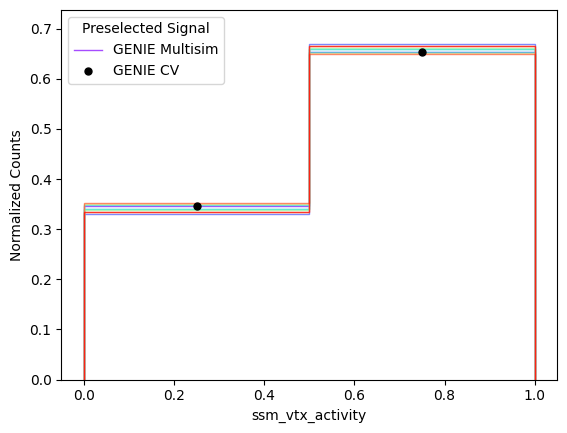

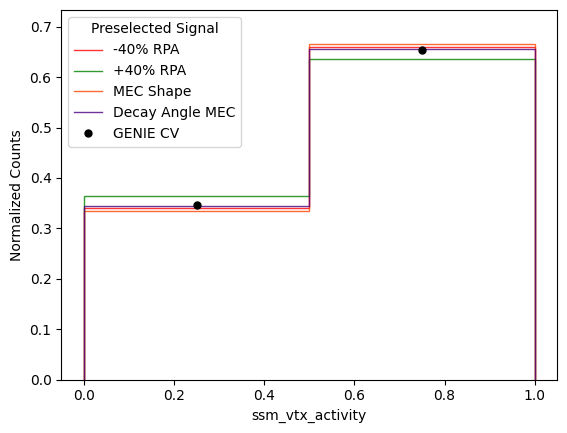

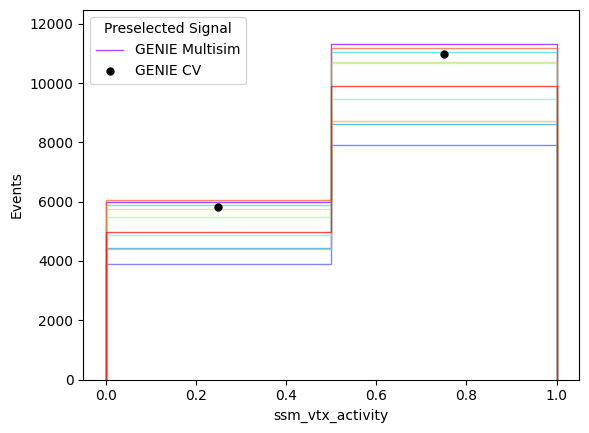

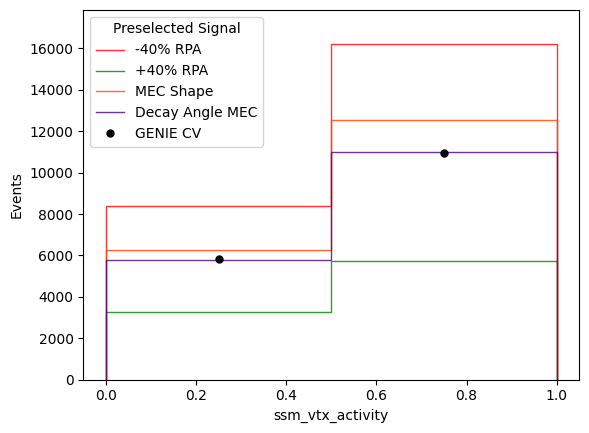

In [73]:
var = 'ssm_vtx_activity'
xmin = 0
xmax = 1
nbins = 2
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


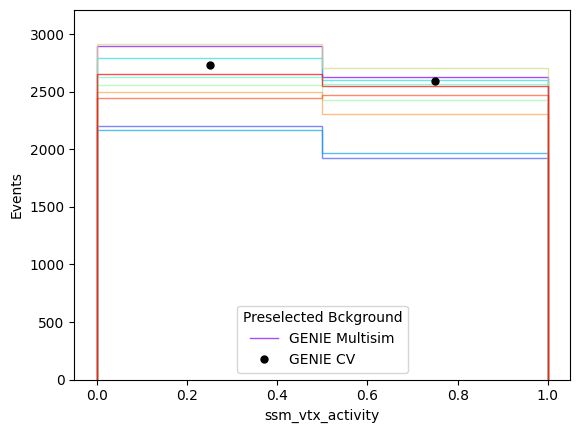

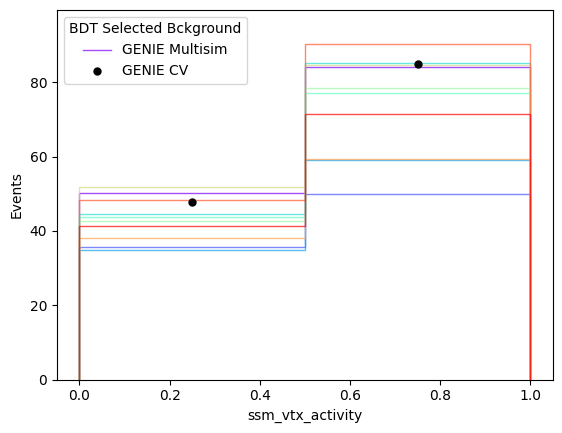

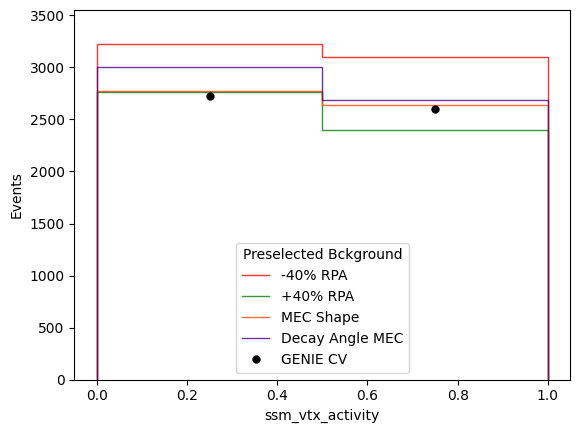

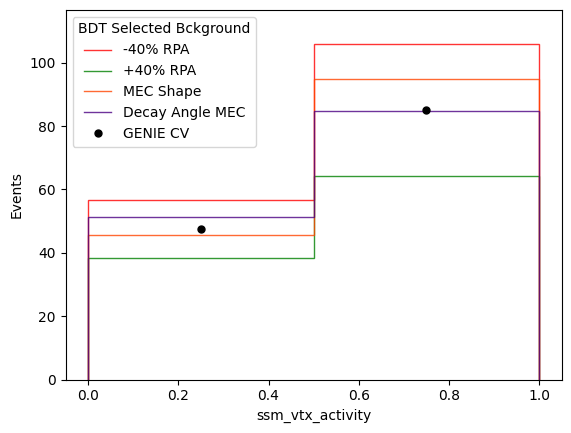

In [74]:
var = 'ssm_vtx_activity'
xmin = 0
xmax = 1
nbins = 2
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


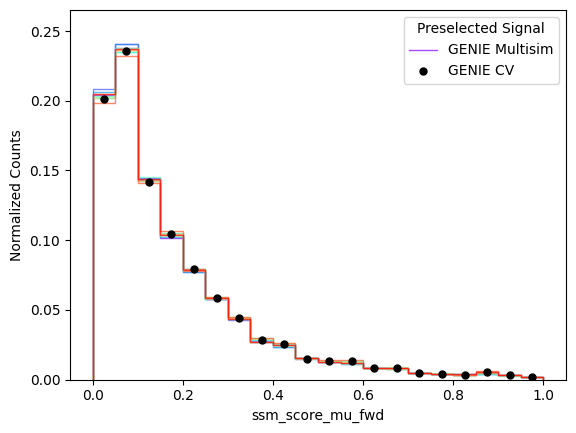

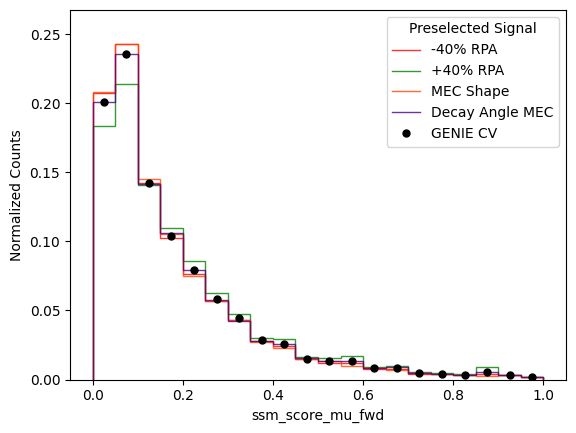

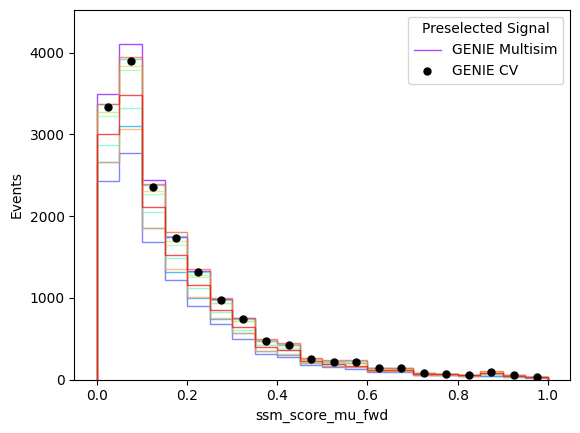

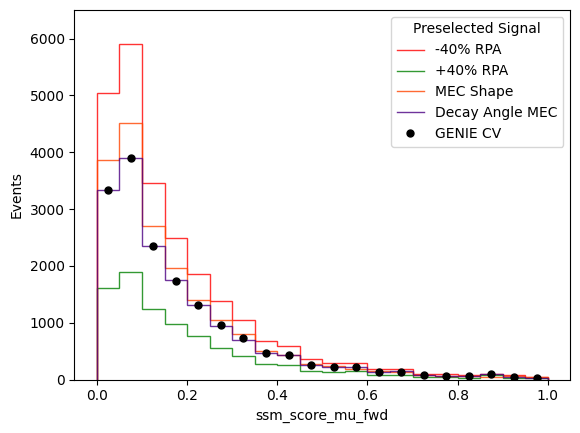

In [75]:
var = 'ssm_score_mu_fwd'
xmin = 0
xmax = 1
nbins = 20
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


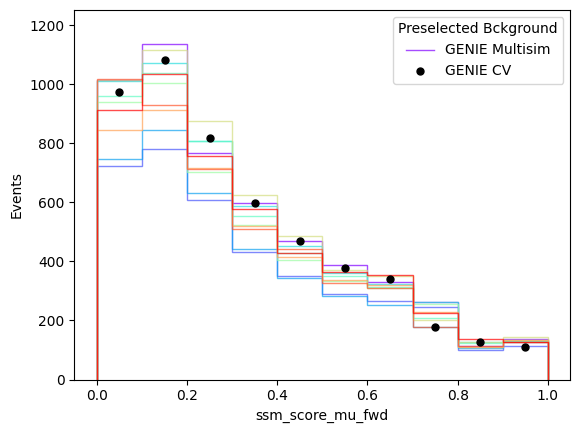

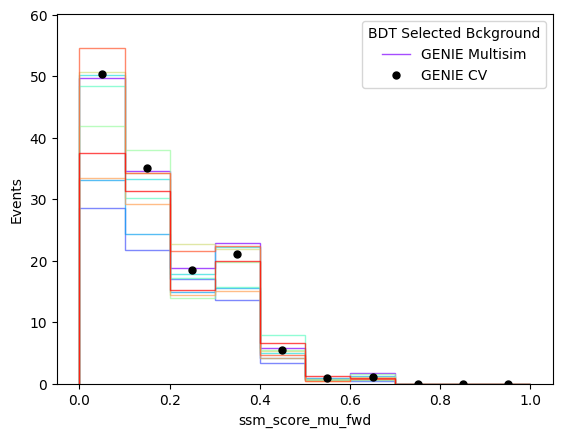

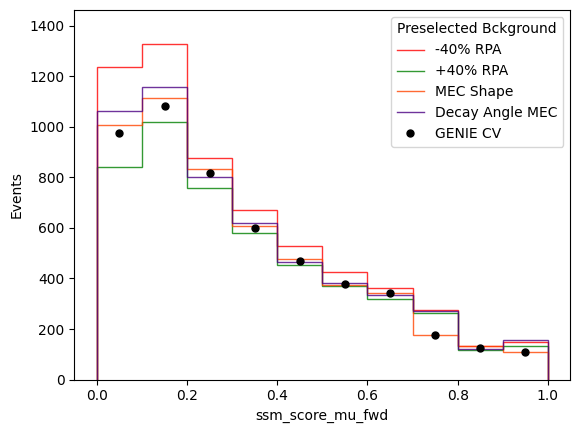

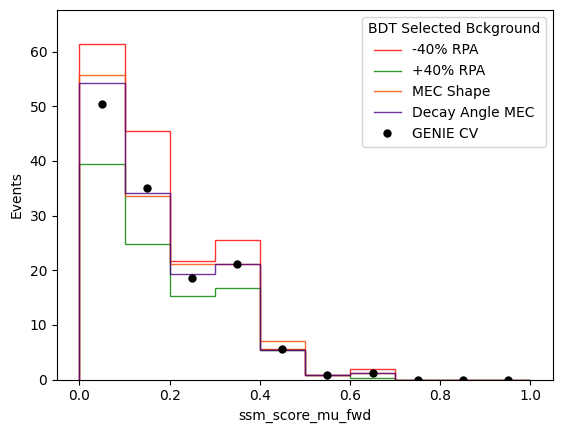

In [76]:
var = 'ssm_score_mu_fwd'
xmin = 0
xmax = 1
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


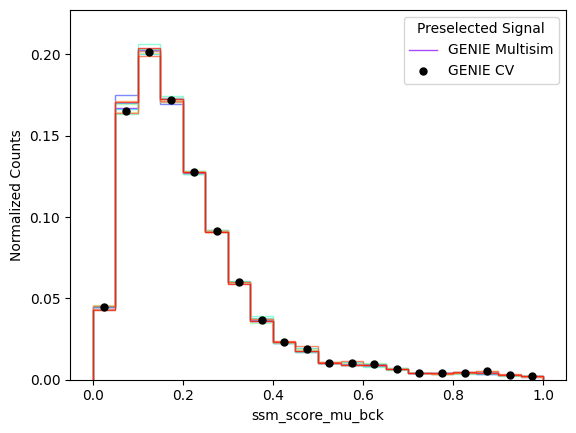

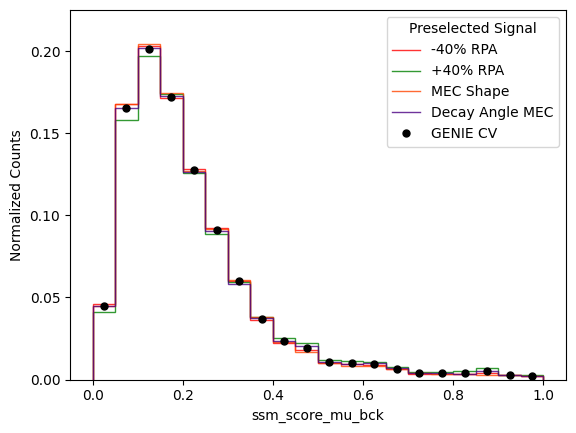

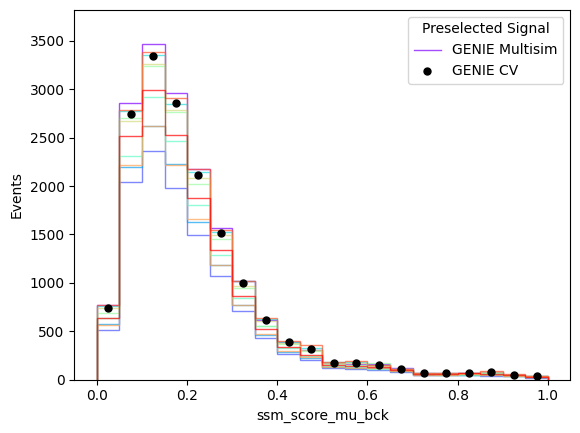

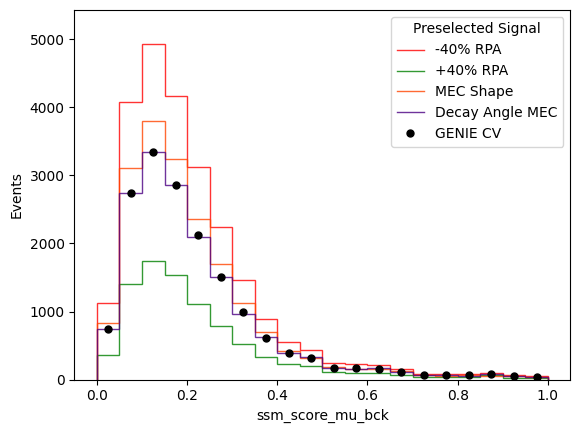

In [77]:
var = 'ssm_score_mu_bck'
xmin = 0
xmax = 1
nbins = 20
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


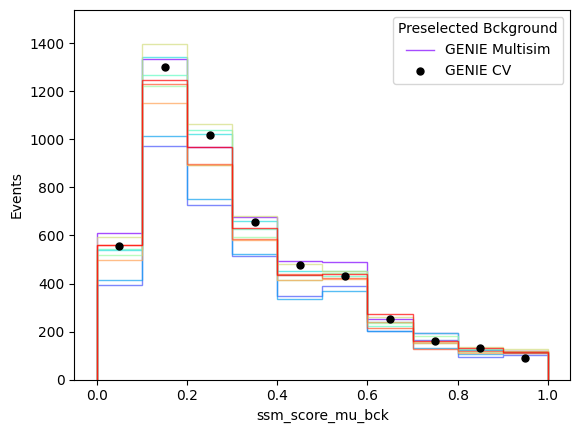

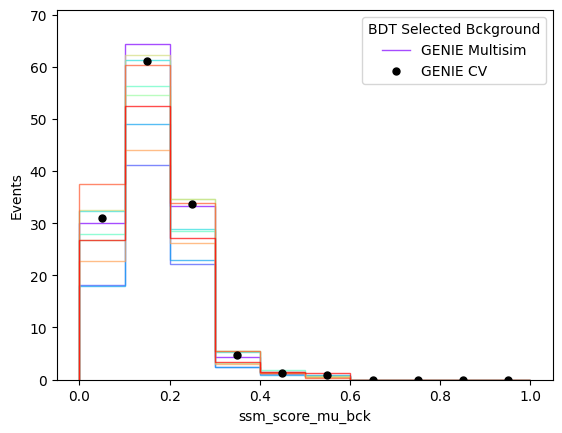

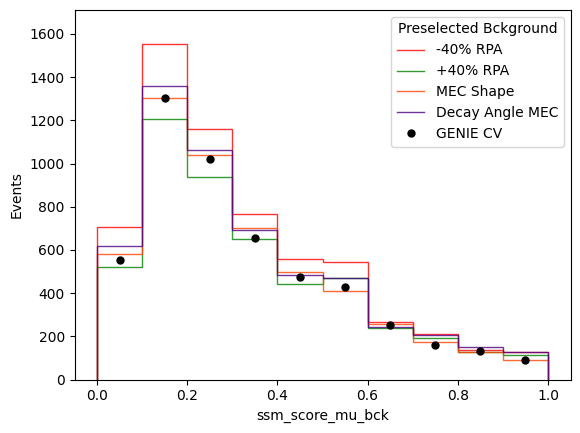

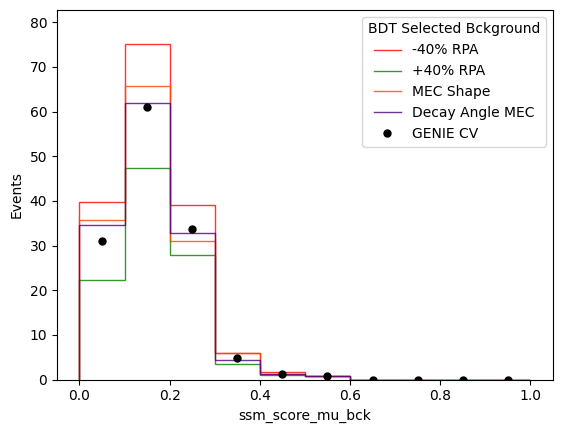

In [78]:
var = 'ssm_score_mu_bck'
xmin = 0
xmax = 1
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


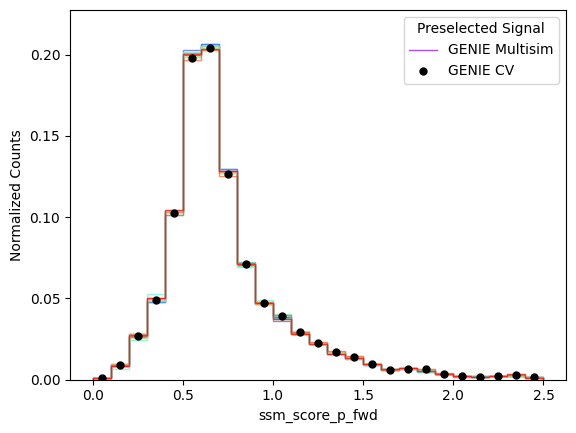

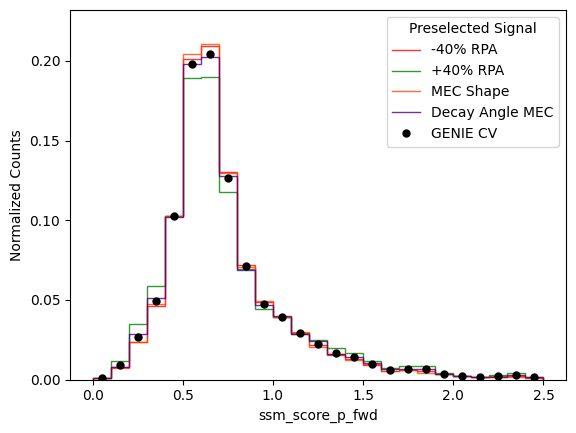

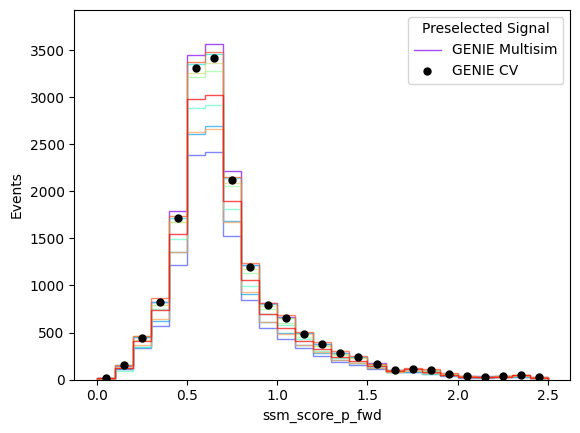

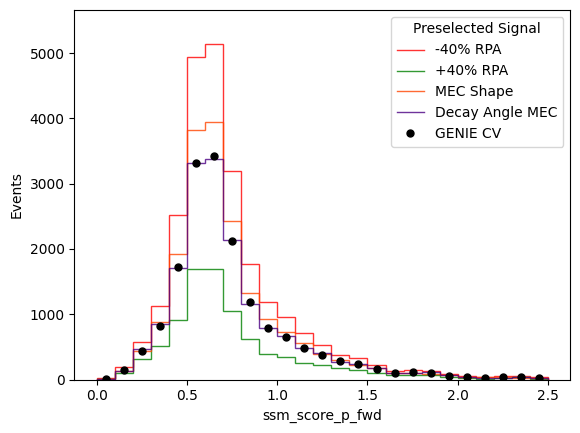

In [79]:
var = 'ssm_score_p_fwd'
xmin = 0
xmax = 2.5
nbins = 25
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


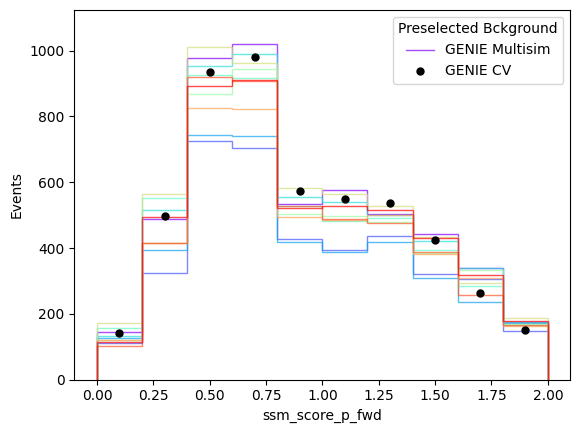

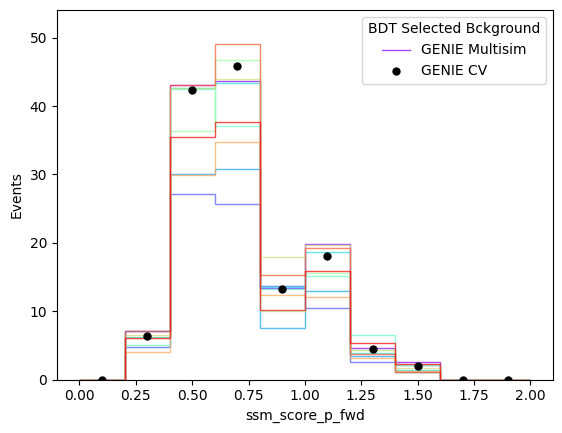

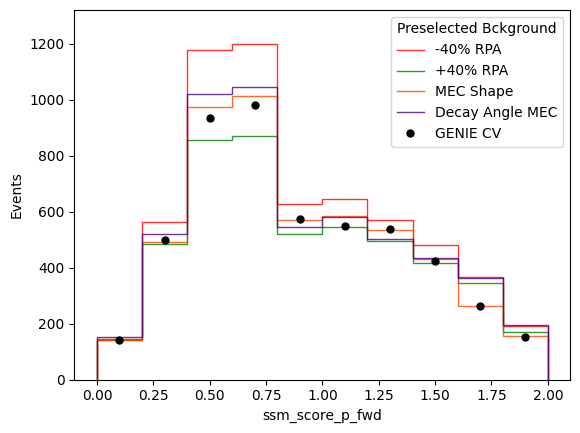

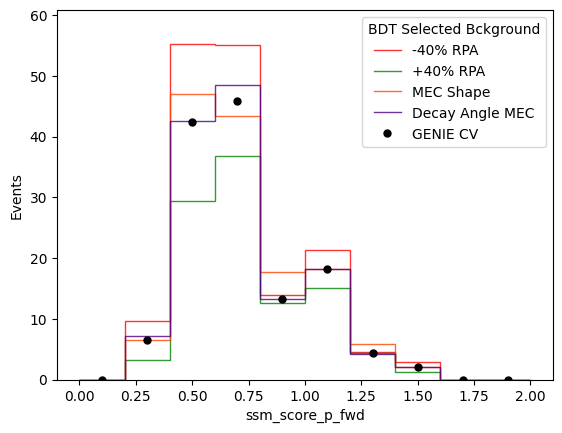

In [99]:
var = 'ssm_score_p_fwd'
xmin = 0
xmax = 2
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


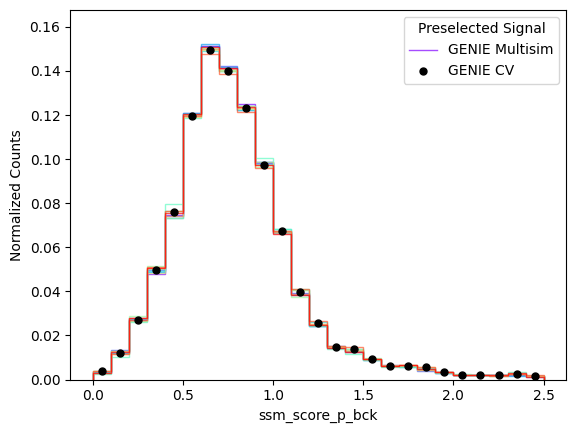

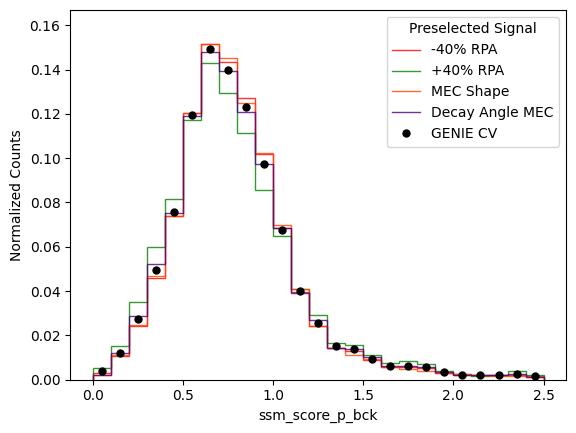

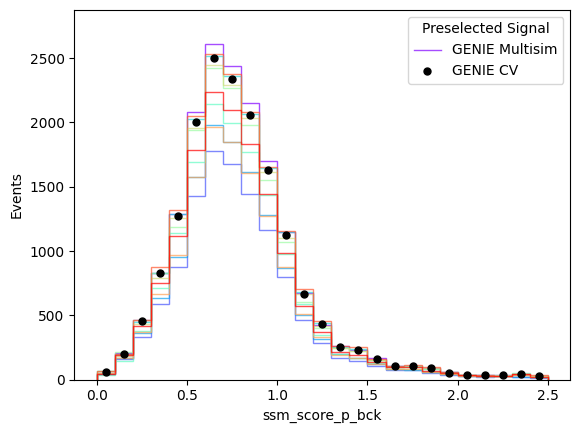

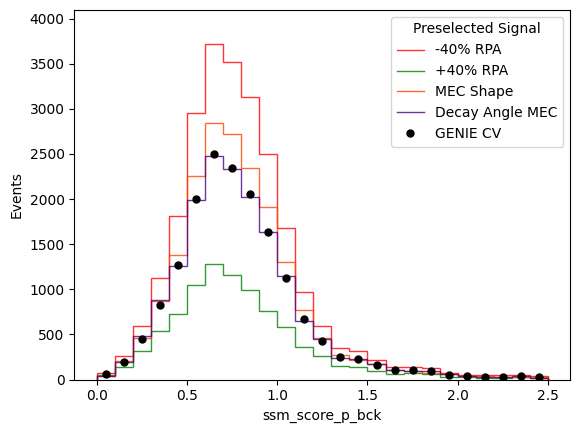

In [81]:
var = 'ssm_score_p_bck'
xmin = 0
xmax = 2.5
nbins = 25
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


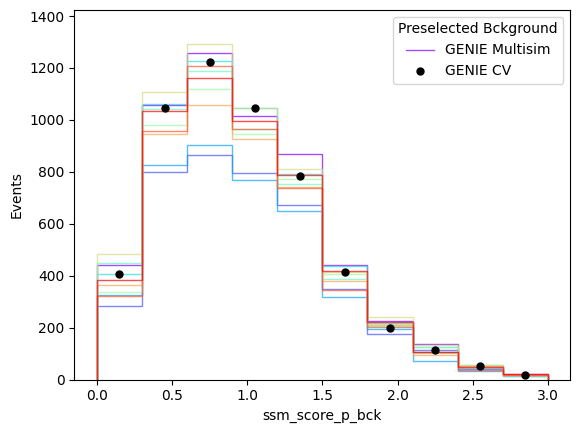

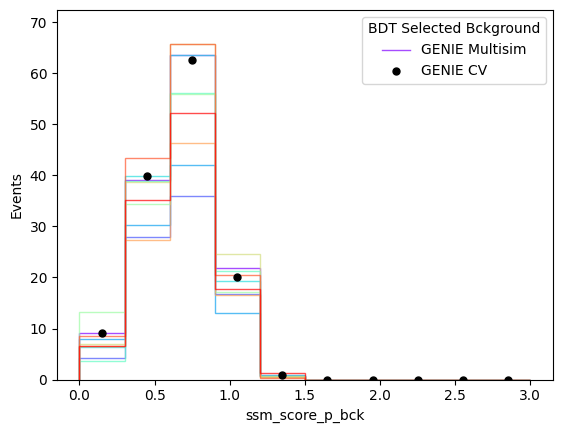

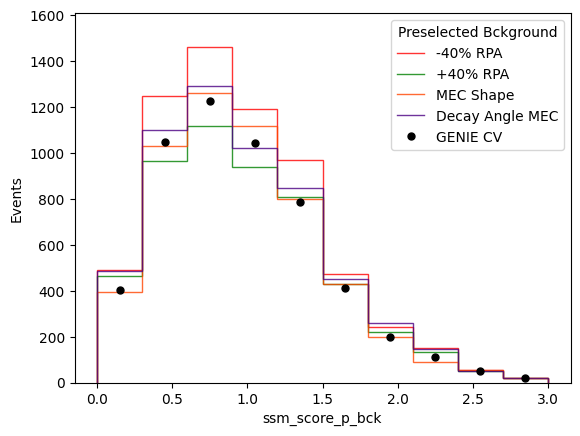

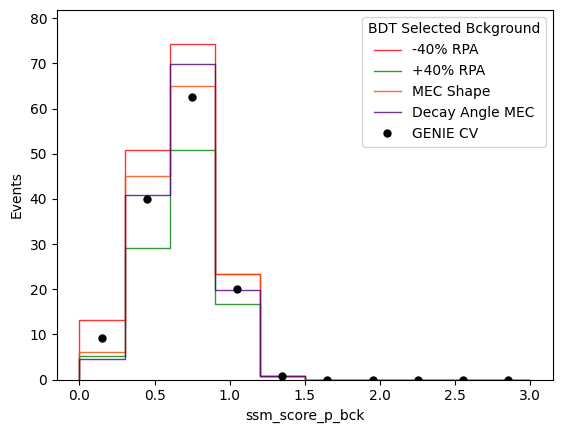

In [82]:
var = 'ssm_score_p_bck'
xmin = 0
xmax = 3
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


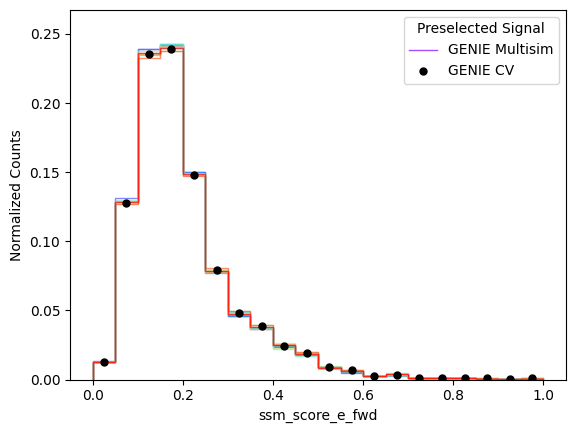

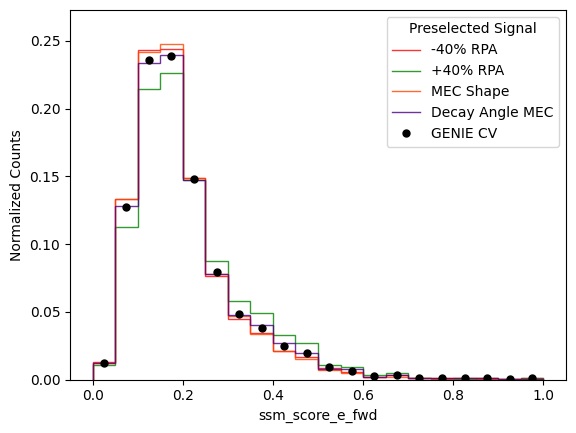

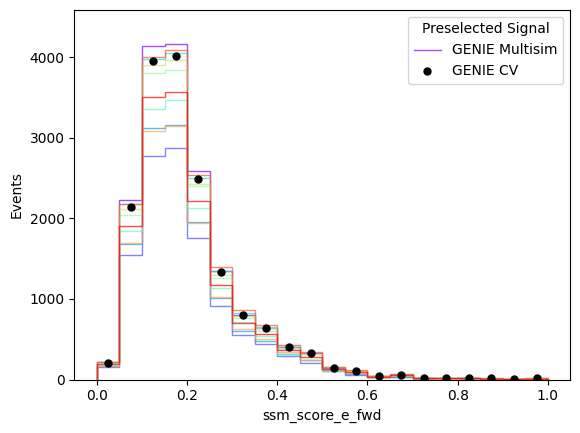

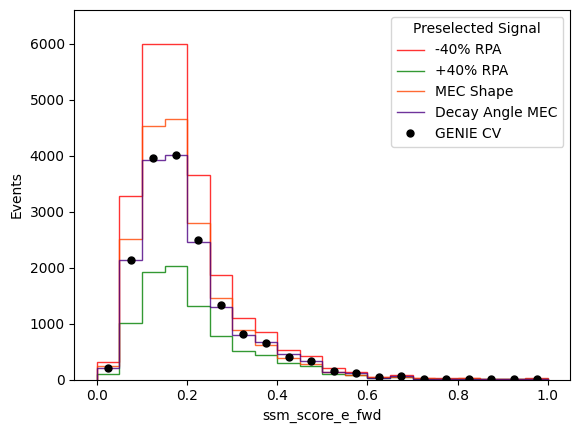

In [83]:
var = 'ssm_score_e_fwd'
xmin = 0
xmax = 1
nbins = 20
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


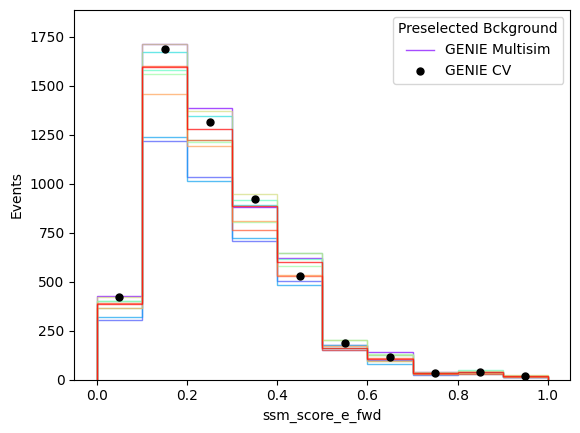

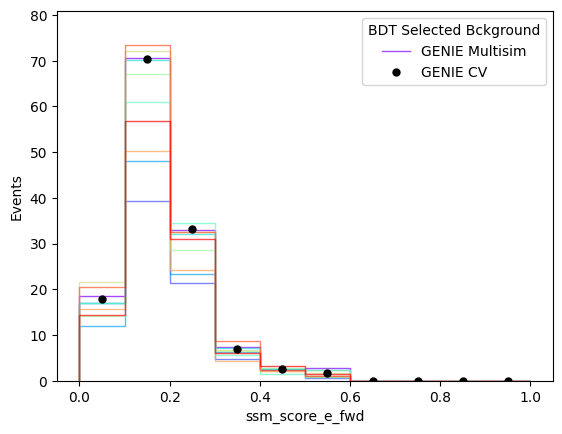

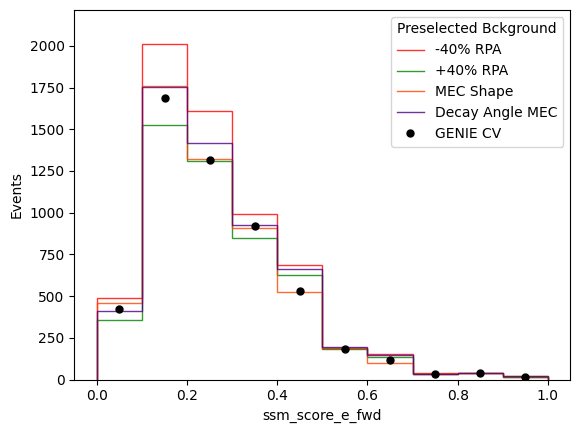

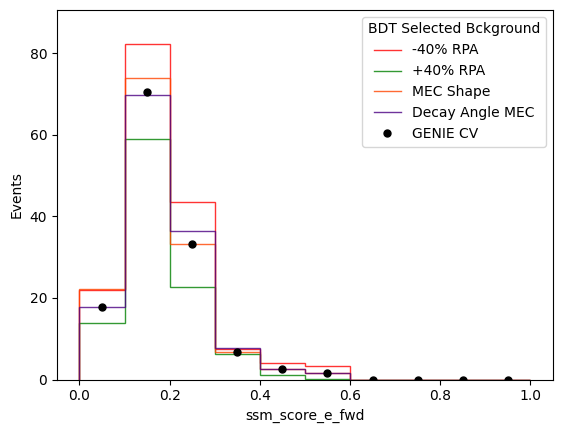

In [84]:
var = 'ssm_score_e_fwd'
xmin = 0
xmax = 1
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


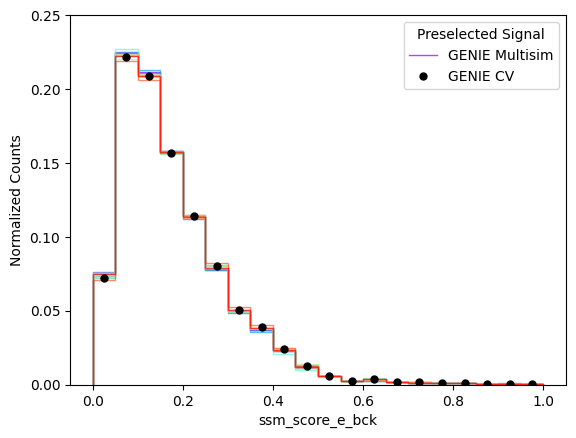

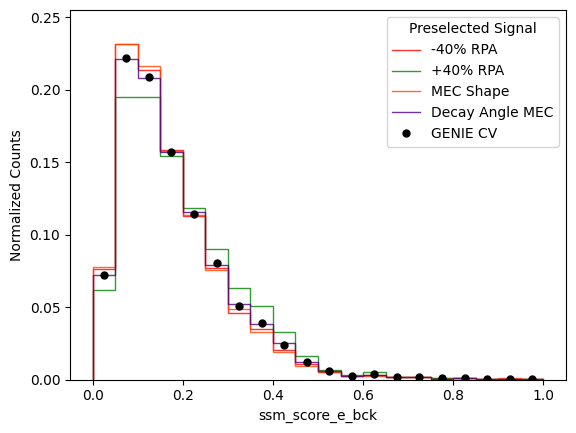

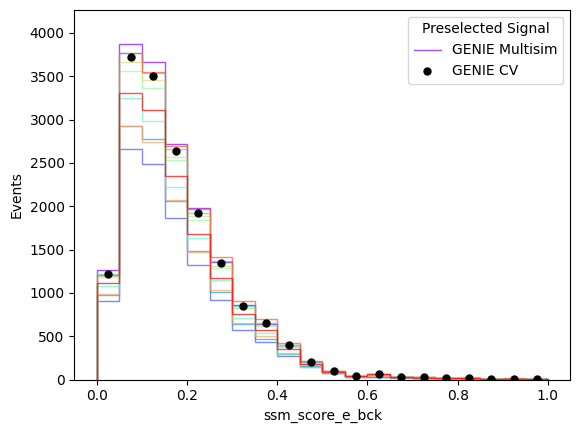

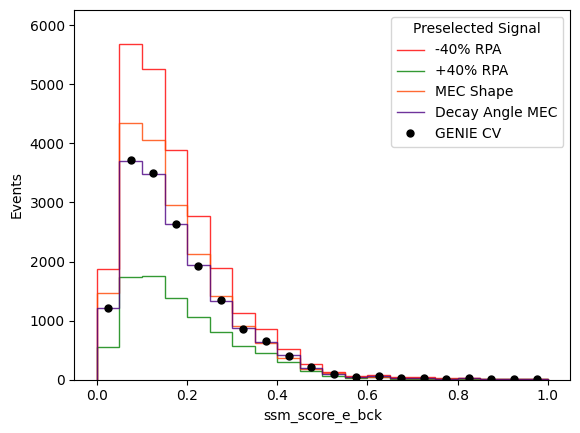

In [85]:
var = 'ssm_score_e_bck'
xmin = 0
xmax = 1
nbins = 20
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


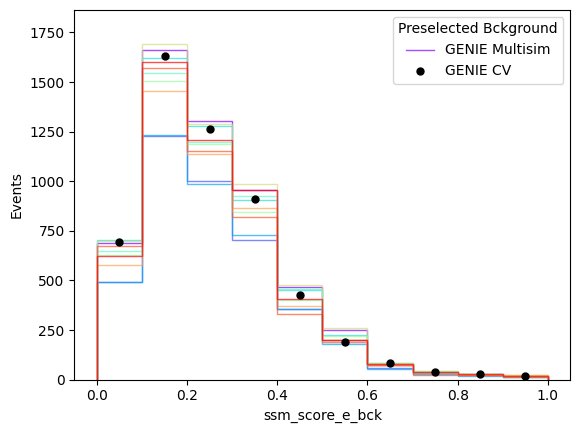

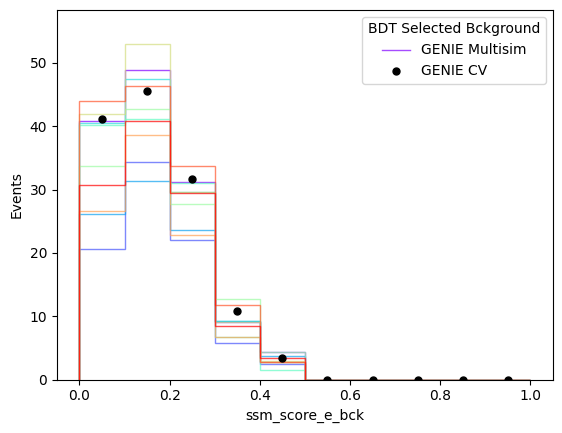

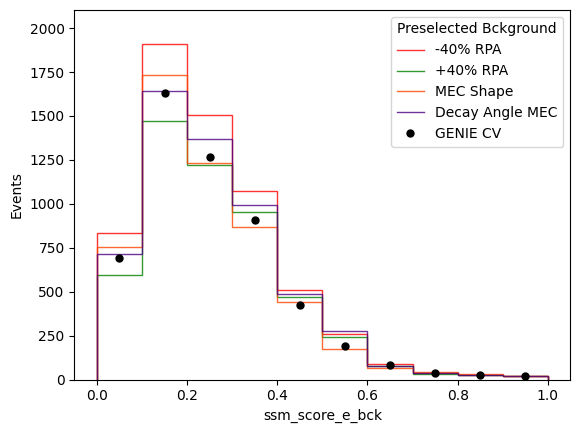

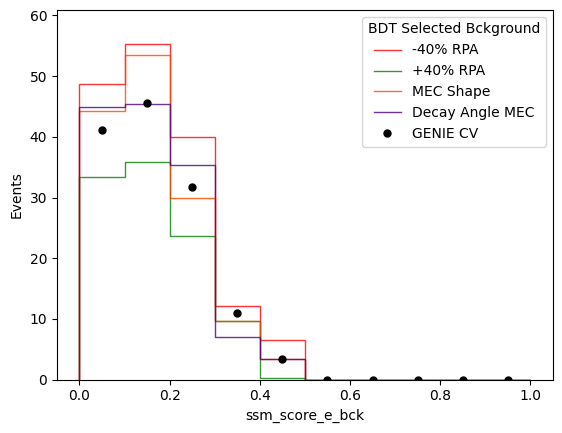

In [86]:

var = 'ssm_score_e_bck'
xmin = 0
xmax = 1
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


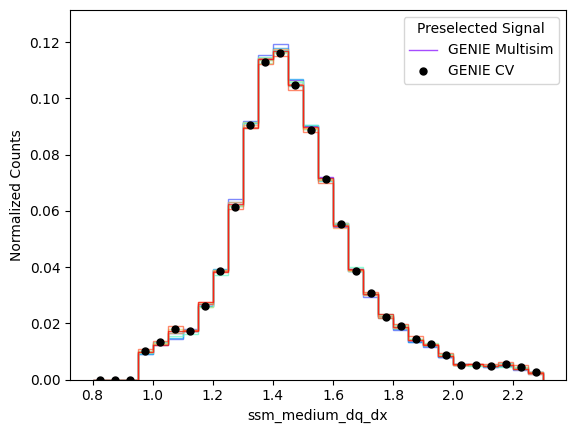

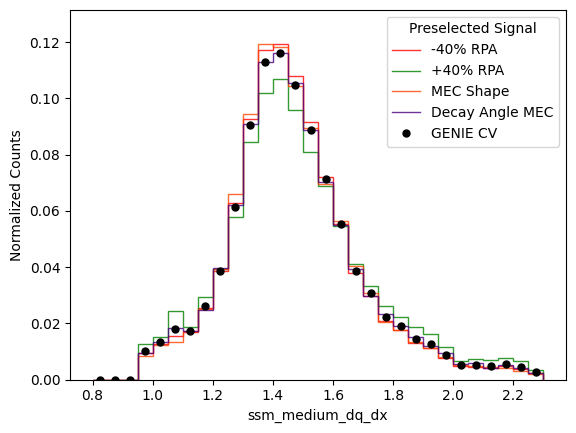

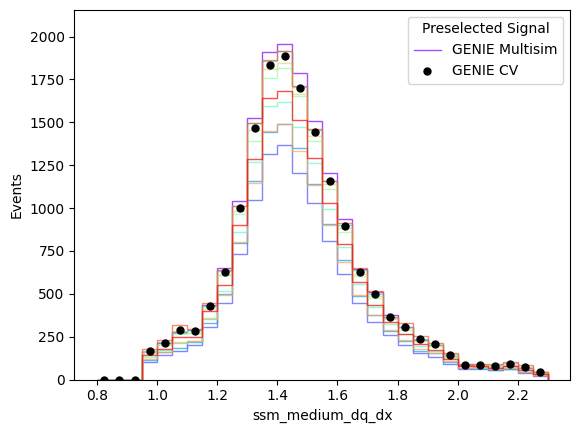

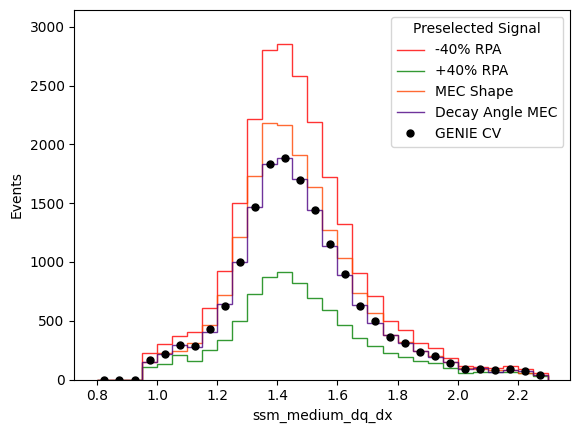

In [87]:
var = 'ssm_medium_dq_dx'
xmin = 0.8
xmax = 2.3
nbins = 30
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


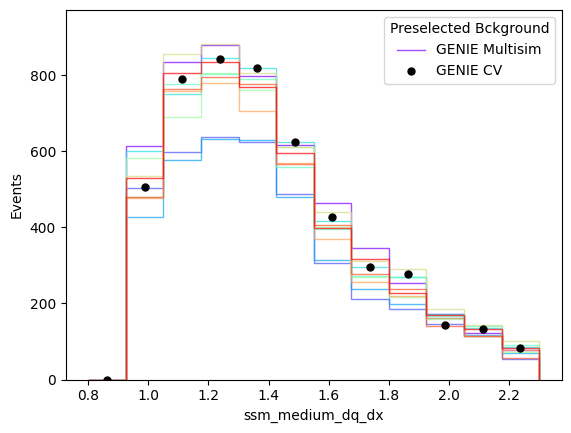

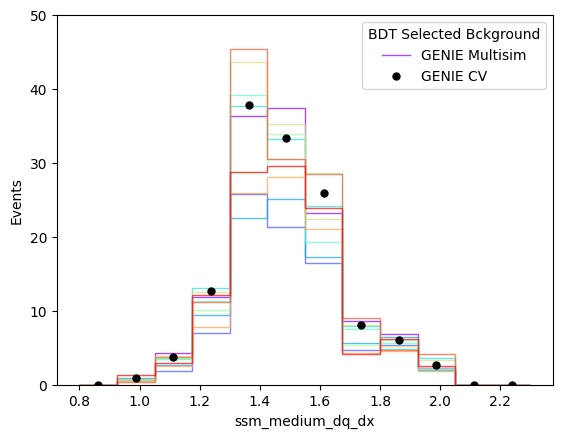

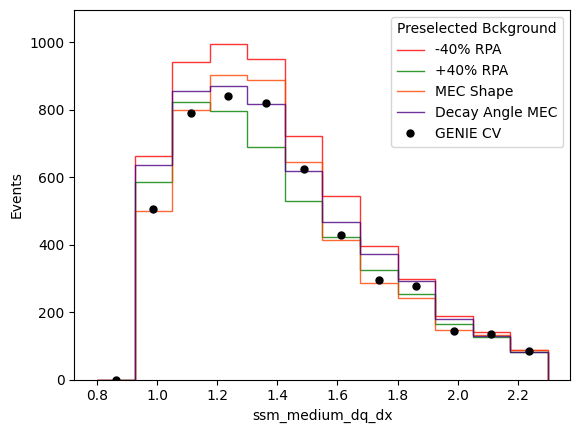

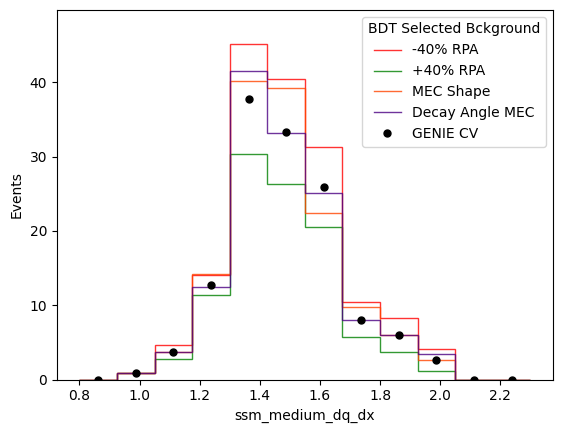

In [88]:
var = 'ssm_medium_dq_dx'
xmin = 0.8
xmax = 2.3
nbins = 12
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


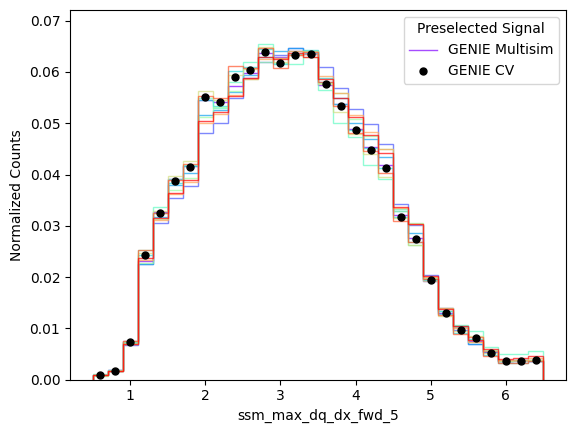

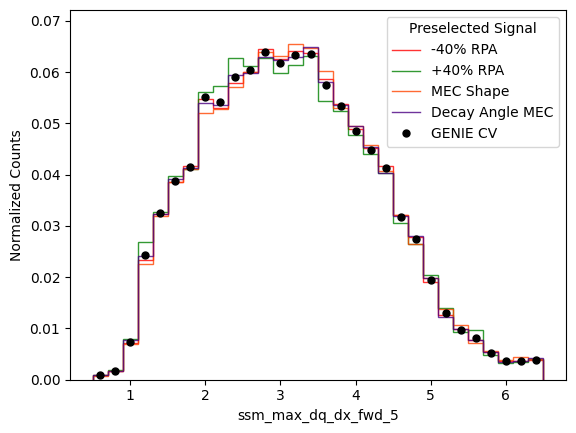

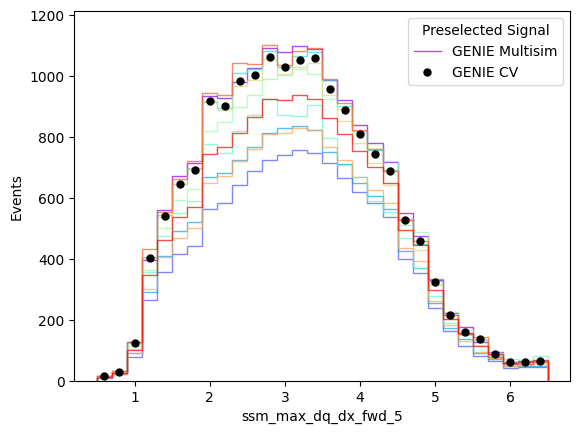

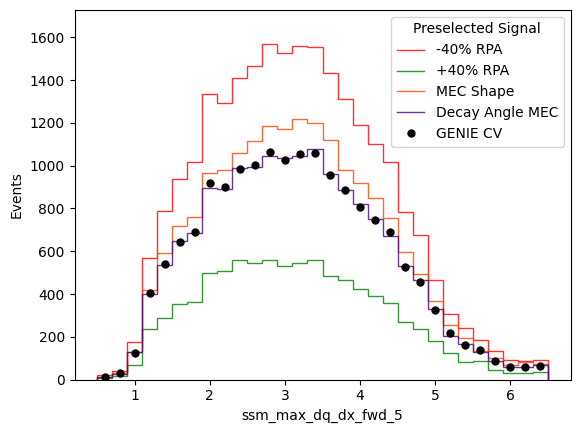

In [89]:
var = 'ssm_max_dq_dx_fwd_5'
xmin = 0.5
xmax = 6.5
nbins = 30
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


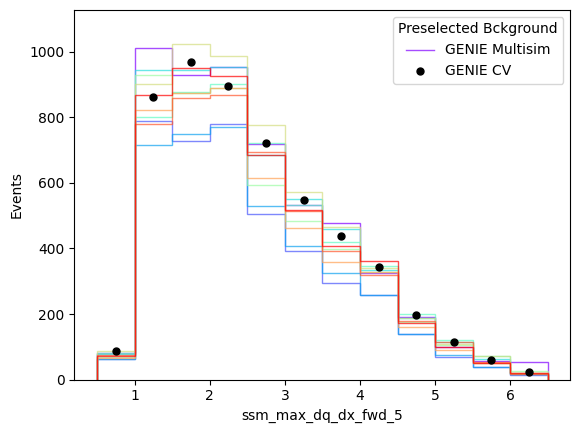

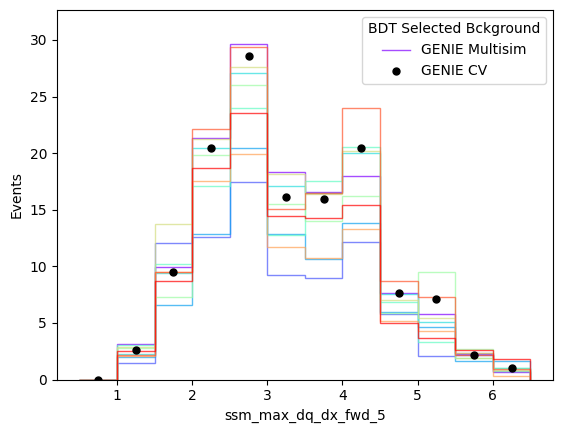

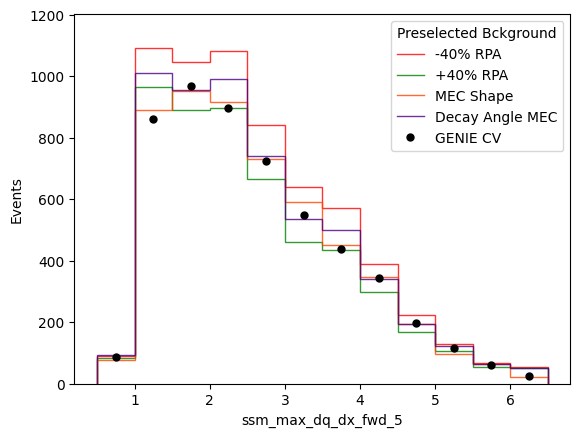

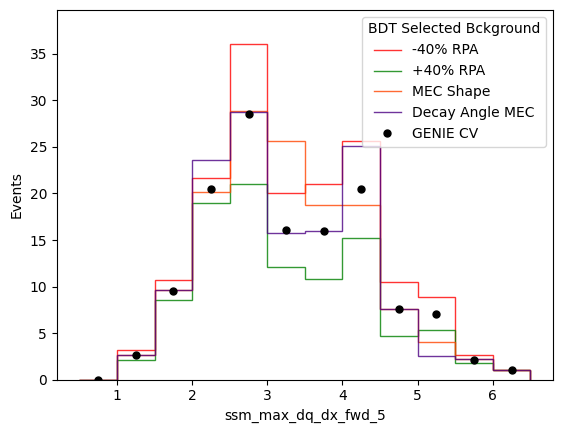

In [90]:
var = 'ssm_max_dq_dx_fwd_5'
xmin = 0.5
xmax = 6.5
nbins = 12
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


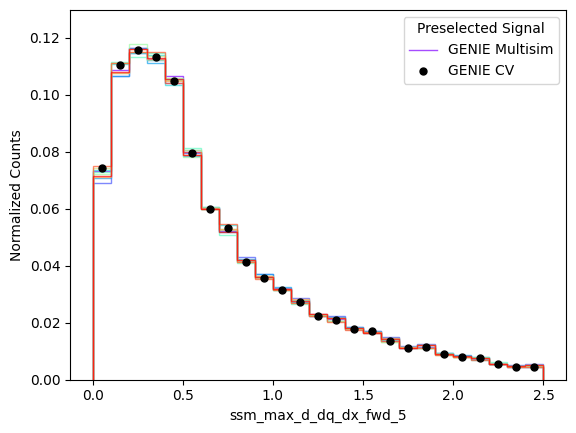

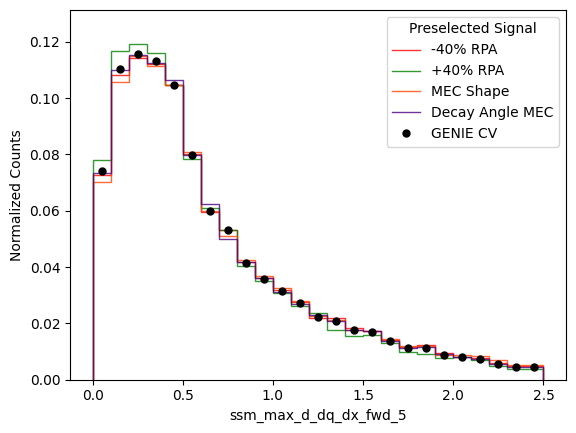

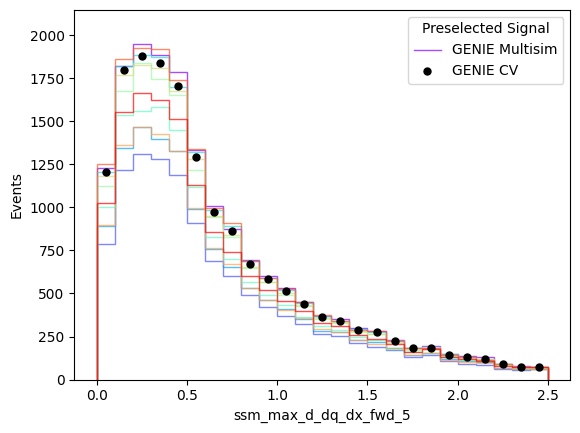

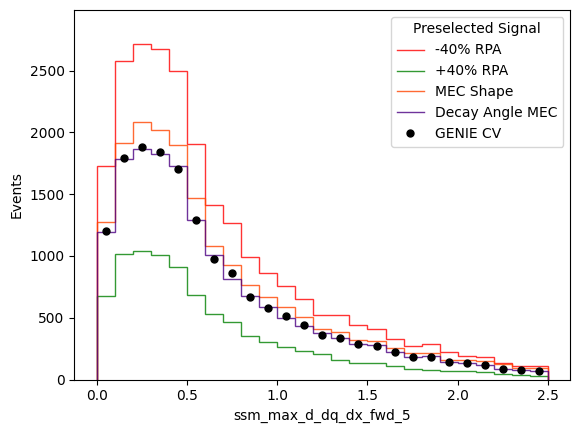

In [91]:
var = 'ssm_max_d_dq_dx_fwd_5'
xmin = 0
xmax = 2.5
nbins = 25
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


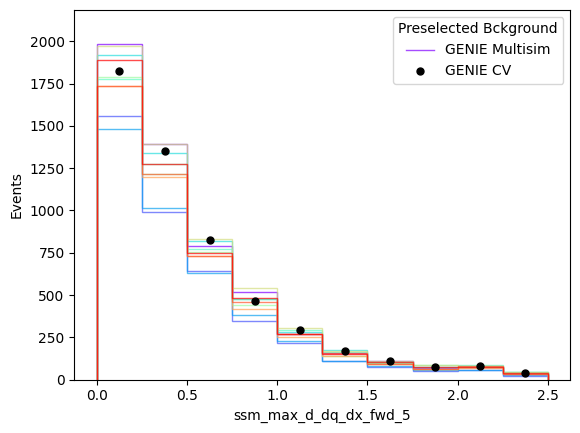

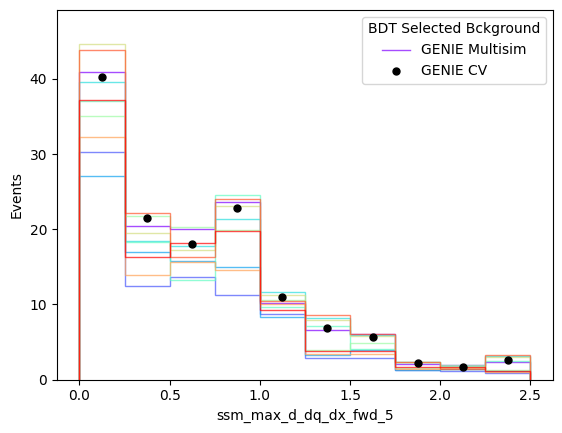

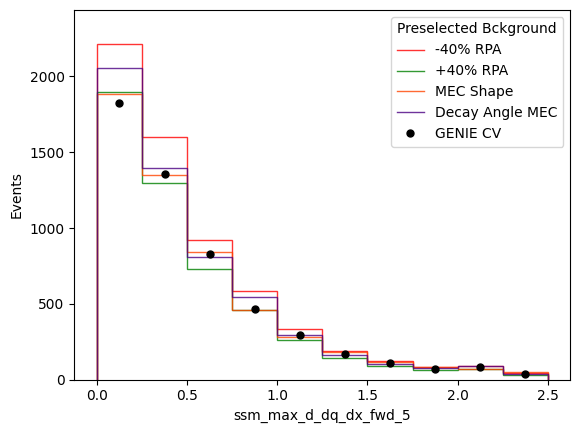

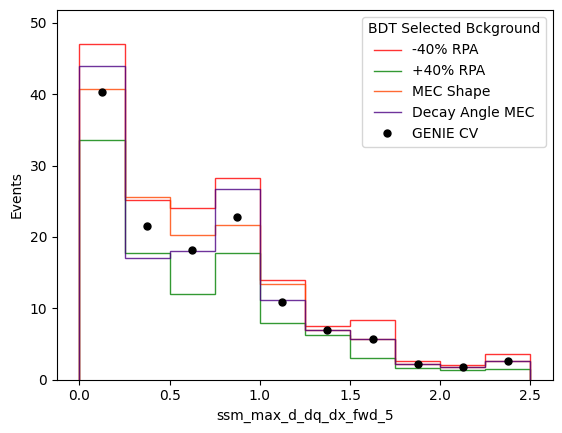

In [92]:
var = 'ssm_max_d_dq_dx_fwd_5'
xmin = 0
xmax = 2.5
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


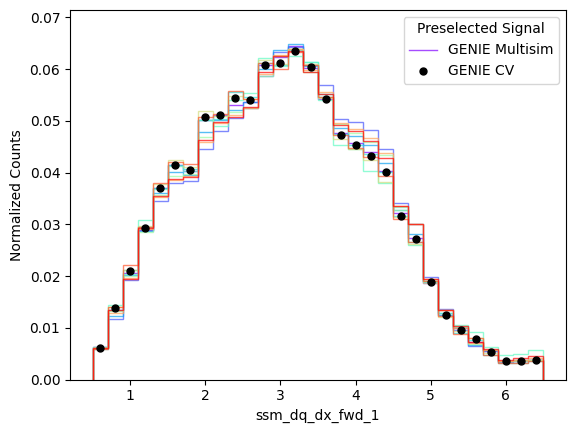

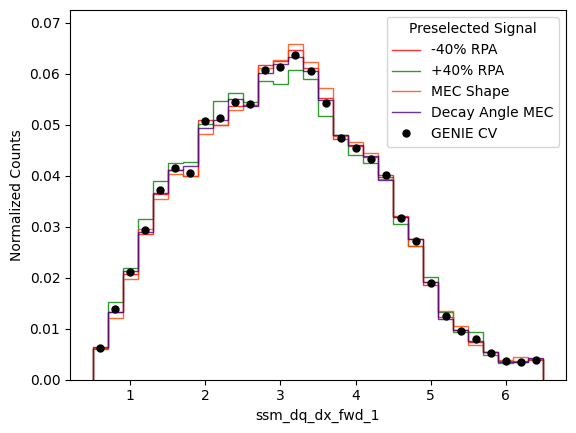

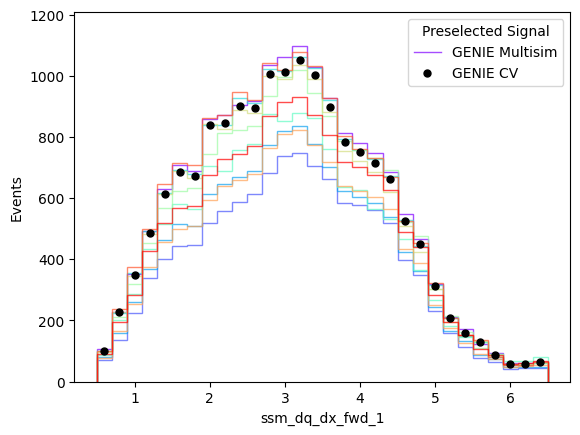

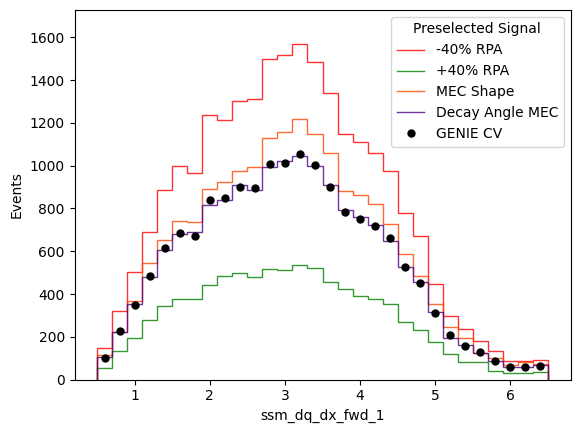

In [93]:
var = 'ssm_dq_dx_fwd_1'
xmin = 0.5
xmax = 6.5
nbins = 30
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


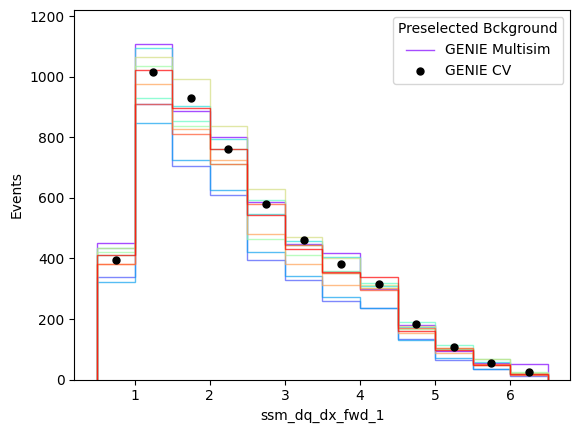

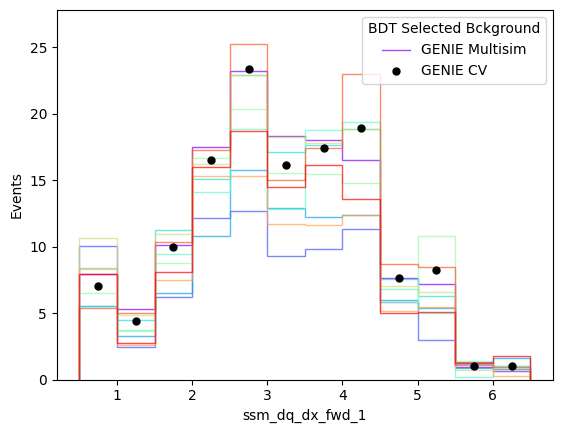

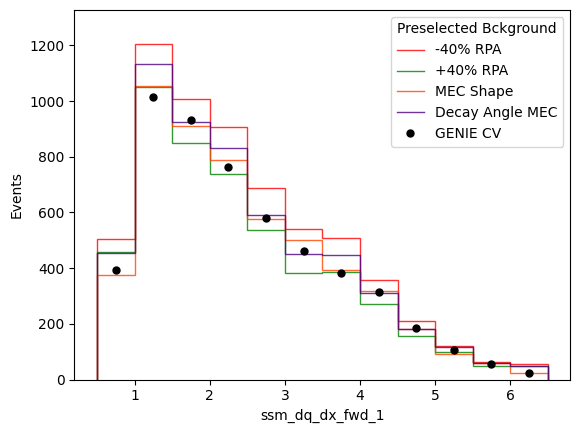

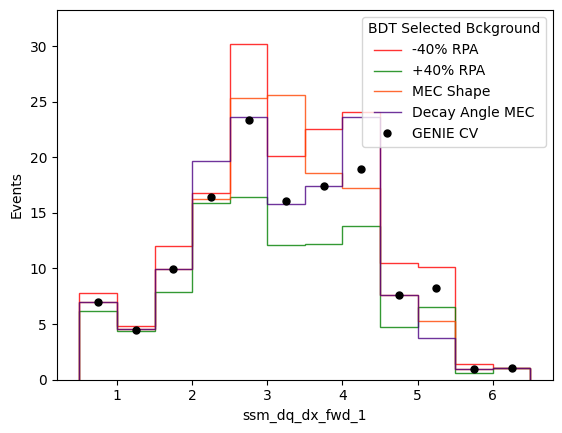

In [94]:
var = 'ssm_dq_dx_fwd_1'
xmin = 0.5
xmax = 6.5
nbins = 12
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)


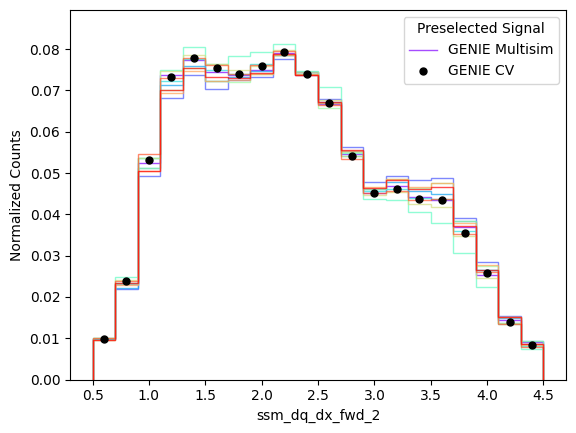

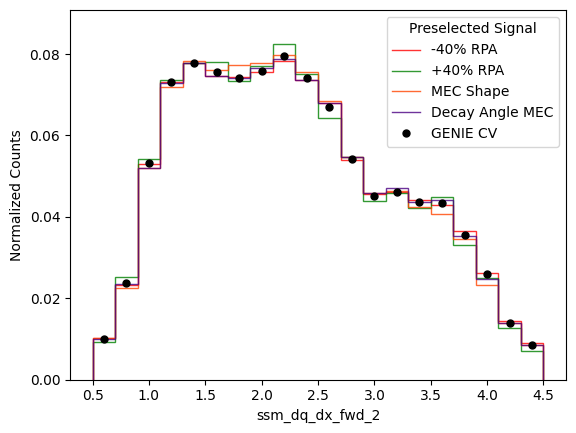

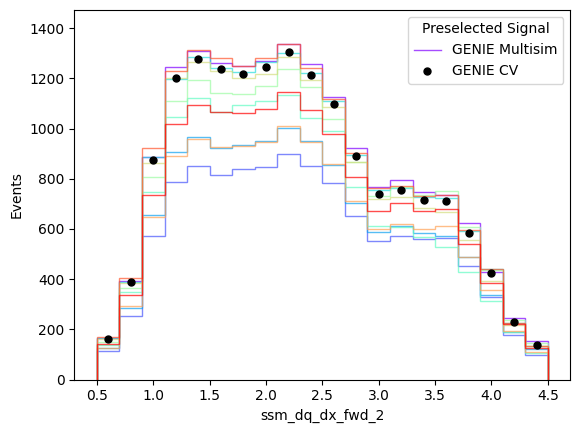

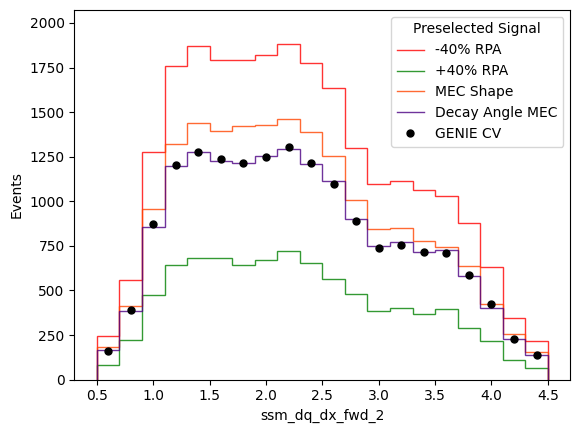

In [95]:
var = 'ssm_dq_dx_fwd_2'
xmin = 0.5
xmax = 4.5
nbins = 20
check_var(var,xmin,xmax,nbins,check_presel=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True)
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False)


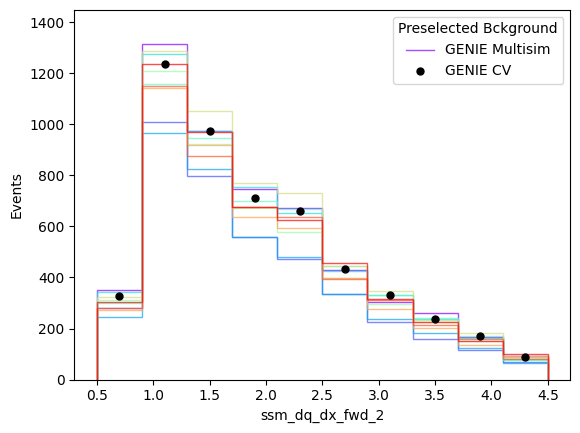

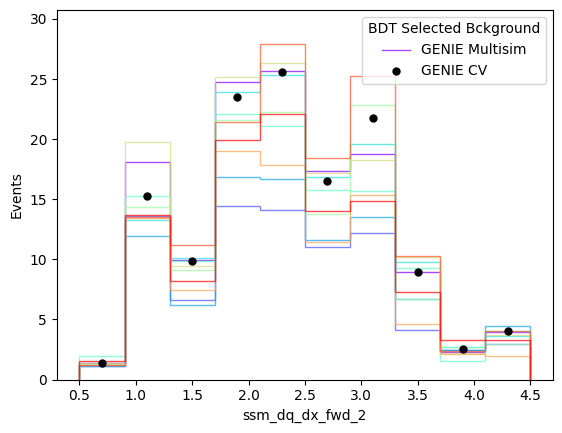

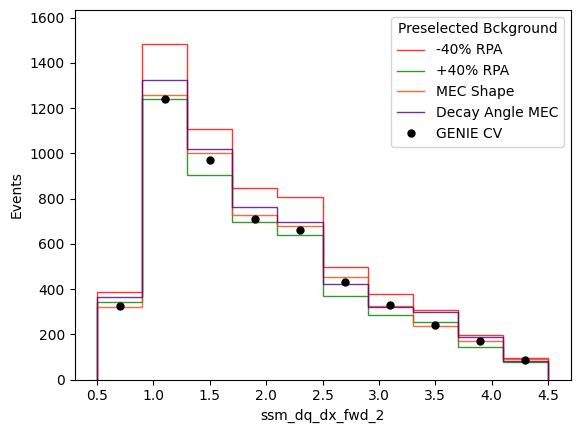

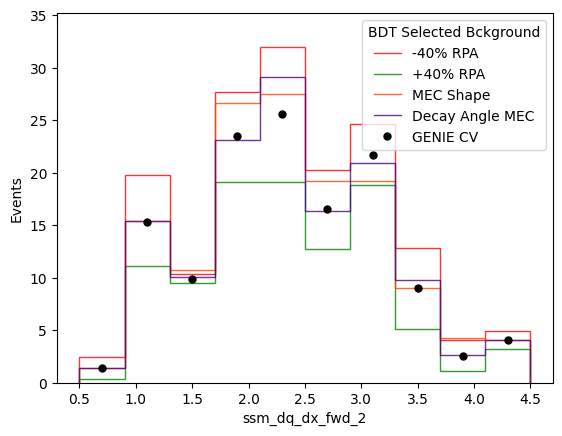

In [96]:
var = 'ssm_dq_dx_fwd_2'
xmin = 0.5
xmax = 4.5
nbins = 10
check_var(var,xmin,xmax,nbins,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_bdtsel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_presel=True,norm_sig=False,check_bckg=True)
check_var(var,xmin,xmax,nbins,check_n_genie_uni=0,plot_rpa=True,plot_XSecShape_CCMEC=True,plot_DecayAngMEC=True,plot_AxFFCCQEshape=False,plot_VecFFCCQEshape=False,check_bdtsel=True,norm_sig=False,check_bckg=True)
